RACİSM tweetlerinin tespiti ile alakalı çalışıldı Aşağıdaki konumdaki dosya kullanıldı

In [ ]:
/content/drive/My Drive/Bitirme/Datasets/Racism_PreprocessedSon_df.csv

# [1. Ön işleme Yok](#b1)

* ## [Kütüphanelerin Yüklenmesi ve Veri Seti İşlemleri](#b1)

###### [1.Kütüphaneler yüklenmesi](#b1)

In [ ]:
# Gerekli kütüphaneleri belirtilen versiyonlarda kur
!pip install --upgrade --no-cache-dir numpy==1.26.4 scipy==1.13.1 gensim==4.3.3 pandas==2.2.2 tensorflow==2.18.0 tensorflow-text==2.18.1 tf-keras==2.18.0 tensorflow-decision-forests==1.11.0


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.stem.porter import *
nltk.download('gutenberg')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
nltk.download('punkt_tab')

from nltk.tokenize import TweetTokenizer
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import datetime

from scipy import stats
from scipy.sparse import hstack, csr_matrix
from sklearn.model_selection import train_test_split, cross_val_score

from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams

import string
import gensim
from gensim.models.phrases import Phraser, Phrases
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
pd.set_option('max_colwidth',400)
from bs4 import BeautifulSoup
import re

from tqdm import tqdm
from bokeh.io import output_notebook, output_file
from bokeh.plotting import show, figure
%matplotlib inline
from collections import defaultdict

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Package gutenberg is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [ ]:
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")

In [ ]:
# Gerekli kütüphaneler
from keras.utils import to_categorical
import random
from sklearn.model_selection import train_test_split
from keras.preprocessing import sequence
from tensorflow.keras.preprocessing.text import Tokenizer

#from keras.preprocessing.text import Tokenizer
from keras.layers import Dense, Dropout, Embedding, LSTM
from keras.callbacks import EarlyStopping
from keras.losses import categorical_crossentropy
from keras.optimizers import Adam
from keras.models import Sequential


In [ ]:
"""from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM
from tensorflow.keras.callbacks import EarlyStopping"""


'from tensorflow.keras.preprocessing.text import Tokenizer\nfrom tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM\nfrom tensorflow.keras.callbacks import EarlyStopping'

In [ ]:
import tensorflow as tf
print(tf.__version__)


2.18.0


######[Dosyanın Yüklenmesi ve veri setinin incelenmesi](#b1)

In [ ]:
warnings.filterwarnings('ignore')
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Bitirme/Datasets/
#df=pd.read_csv("Loan.csv",index_col=0)


""" # Yeni Bir dosya kaydetme koddunu buraya yazıyoruz
PreprocessedSon2_df_file_path = '/content/drive/My Drive/Bitirme/Datasets/PreprocessedSon2_df.csv'
df.to_csv(PreprocessedSon2_df_file_path, index=False)"""


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/Bitirme/Datasets


" # Yeni Bir dosya kaydetme koddunu buraya yazıyoruz\nPreprocessedSon2_df_file_path = '/content/drive/My Drive/Bitirme/Datasets/PreprocessedSon2_df.csv'\ndf.to_csv(PreprocessedSon2_df_file_path, index=False)"

In [ ]:
"""
Kaggle API ile yükleme
import numpy as np
import pandas as pd
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'"""

"\nKaggle API ile yükleme\nimport numpy as np\nimport pandas as pd\nimport os\nfor dirname, _, filenames in os.walk('/kaggle/input'):\n    for filename in filenames:\n        print(os.path.join(dirname, filename))\nos.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'"

In [ ]:
# Veri setini yükle
file_path = '/content/drive/My Drive/Bert/USAir_df.csv'
file_path2 = '/content/drive/My Drive/Bert/USAir_balanced_df.csv'
file_path3 = '/content/drive/My Drive/Bitirme/Datasets/twitter_racism_parsed_dataset.csv'
file_path4 = '/content/drive/My Drive/Bitirme/Datasets/PreprocessedSon3_2output_df.csv'
file_path5 = '/content/drive/My Drive/Bitirme/Datasets/Racism_PreprocessedSon_df.csv'

df = pd.read_csv(file_path5, encoding='latin1', header=None)
#df = pd.read_csv(file_path5, index_col=0)
#df = pd.read_csv(file_path4, index_col=0)

# Sütun isimlerini belirle
#df.columns = ['index', 'id','Text','label','score']
df.columns=['Text','label','score', 'hibrit', 'USAirPrePro', 'USAirPrePro2', 'USAirPrePro3','MuammerNLPPrePRro', 'MuammerNLPPrePRro2', 'MuammerNLPPrePRro3', 'MuammerNLPLSTMPrePRro']

# İlk sütunu kontrol edelim
print("Sütun isimleri:", df.columns)

Sütun isimleri: Index(['Text', 'label', 'score', 'hibrit', 'USAirPrePro', 'USAirPrePro2',
       'USAirPrePro3', 'MuammerNLPPrePRro', 'MuammerNLPPrePRro2',
       'MuammerNLPPrePRro3', 'MuammerNLPLSTMPrePRro'],
      dtype='object')


In [ ]:
#df4=pd.read_csv("PreprocessedSon3_df.csv",index_col=0)

In [ ]:
#df3=pd.read_csv("IMDB_df.csv",index_col=0)

In [ ]:
#df2=pd.read_csv("USAir_balanced_df.csv",index_col=0)

In [ ]:
df

,Text,label,score,hibrit,USAirPrePro,USAirPrePro2,USAirPrePro3,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPPrePRro3,MuammerNLPLSTMPrePRro
1,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc,racism,1,aalwuhaib muslim mob violence hindus bangladesh continues islam http co jbwjwurc,aalwuhaib muslim mob violenc hindu bangladesh continu islam,aalwuhaib muslim mob violence hindu bangladesh continues islam,aalwuhaib muslim mob violenc hindu bangladesh continu islam,AAlwuhaib Muslim mob violence against Hindus in Bangladesh continues in Islam http co JBWJwuRc,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc,AAlwuhaib Muslim mob violence against Hindus in Bangladesh continues in Islam http co JBWJwuRc,aalwuhaib muslim mob violenc hindu bangladesh continu islam httptcocjbwjwurc
2,#NULL!,none,0,null,NaN,NaN,NaN,NULL,#NULL!,NULL,NaN
3,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.,racism,1,jncatron isra jourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed,jncatron israjourisra ampalestin islamophobia like idea naziphobia islam religion hate must outlaw,jncatron israjourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed,jncatron israjourisra ampalestin islamophobia like idea naziphobia islam religion hate must outlaw,jncatron isra jourisra AMPalestine Islamophobia is like the idea of Naziphobia Islam is religion of hate and it must be outlawed,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.,jncatron isra jourisra AMPalestine Islamophobia is like the idea of Naziphobia Islam is religion of hate and it must be outlawed,jncatron israjourisra ampalestin islamophobia like idea naziphobia islam religion hate must outlaw
4,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR",none,0,finally caught sudden death cook looks like gonna intense mkr,final im caught sudden death cook look like gon na intens mkr,finally caught sudden death cook look like going intense mkr,final caught sudden death cook look like gon na intens mkr,Finally m all caught up and that sudden death cook off looks like it gonna be intense MKR,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR",Finally m all caught up and that sudden death cook off looks like it gonna be intense MKR,"final 'm caught , sudden death cook look like 's gon na intens mkr"
5,@carolinesinders @herecomesfran *hugs*,none,0,carolinesinders herecomesfran hugs,carolinesind herecomesfran hug,carolinesinders herecomesfran hug,carolinesind herecomesfran hug,carolinesinders herecomesfran hugs,@carolinesinders @herecomesfran *hugs*,carolinesinders herecomesfran hugs,carolinesind herecomesfran hug
...,...,...,...,...,...,...,...,...,...,...,...
13467,#mkr NOOOOO!!! I wanted Kat and Andre to lose!!!,none,0,mkr nooooo wanted kat andre lose,mkr nooooo want kat andr lose,mkr nooooo wanted kat andre lose,mkr nooooo want kat andr lose,mkr NOOOOO wanted Kat and Andre to lose,#mkr NOOOOO!!! I wanted Kat and Andre to lose!!!,mkr NOOOOO wanted Kat and Andre to lose,mkr n want kat andr lose
13468,RT @MumtazCeltik: @WhiteHouse @VP \n\n#Kobane \n\n#JeSuisCharlie \n\n'Turkish military says MIT shipped weapons to al-Qaeda'\n@fehimtastekinÃ¢ÂÂºÃ¢ÂÂºhttpÃ¢ÂÂ¦,none,0,rt mumtazceltik whitehouse vp kobane jesuischarlie turkish military says mit shipped weapons al qaeda fehimtastekin http,rt mumtazceltik whitehous vp koban jesuischarli turkish militari say mit ship weapon alqaeda fehimtastekinhttp,rt mumtazceltik whitehouse vp kobane jesuischarlie turkish military say mit shipped weapon alqaeda fehimtastekinhttp,rt mumtazceltik whitehous vp koban jesuischarli turkish milita

In [ ]:
df['score'] = pd.to_numeric(df['score'], errors='coerce')


In [ ]:
#Burda -1 olanlar 0 yapıldı 1 olanlar kaldı
df['score2'] = df['score'].apply(lambda x: x + 1 if x == -1 else x)

In [ ]:
df['score']

,score
1,-1
2,-1
3,-1
4,-1
5,-1
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
df['score2']

,score2
1,0
2,0
3,0
4,0
5,0
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
df = df.drop(df.index[0])
df.head()

,Text,label,score,hibrit,USAirPrePro,USAirPrePro2,USAirPrePro3,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPPrePRro3,MuammerNLPLSTMPrePRro
1,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc,racism,1,aalwuhaib muslim mob violence hindus bangladesh continues islam http co jbwjwurc,aalwuhaib muslim mob violenc hindu bangladesh continu islam,aalwuhaib muslim mob violence hindu bangladesh continues islam,aalwuhaib muslim mob violenc hindu bangladesh continu islam,AAlwuhaib Muslim mob violence against Hindus in Bangladesh continues in Islam http co JBWJwuRc,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc,AAlwuhaib Muslim mob violence against Hindus in Bangladesh continues in Islam http co JBWJwuRc,aalwuhaib muslim mob violenc hindu bangladesh continu islam httptcocjbwjwurc
2,#NULL!,none,0,null,NaN,NaN,NaN,NULL,#NULL!,NULL,NaN
3,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.,racism,1,jncatron isra jourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed,jncatron israjourisra ampalestin islamophobia like idea naziphobia islam religion hate must outlaw,jncatron israjourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed,jncatron israjourisra ampalestin islamophobia like idea naziphobia islam religion hate must outlaw,jncatron isra jourisra AMPalestine Islamophobia is like the idea of Naziphobia Islam is religion of hate and it must be outlawed,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.,jncatron isra jourisra AMPalestine Islamophobia is like the idea of Naziphobia Islam is religion of hate and it must be outlawed,jncatron israjourisra ampalestin islamophobia like idea naziphobia islam religion hate must outlaw
4,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR",none,0,finally caught sudden death cook looks like gonna intense mkr,final im caught sudden death cook look like gon na intens mkr,finally caught sudden death cook look like going intense mkr,final caught sudden death cook look like gon na intens mkr,Finally m all caught up and that sudden death cook off looks like it gonna be intense MKR,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR",Finally m all caught up and that sudden death cook off looks like it gonna be intense MKR,"final 'm caught , sudden death cook look like 's gon na intens mkr"
5,@carolinesinders @herecomesfran *hugs*,none,0,carolinesinders herecomesfran hugs,carolinesind herecomesfran hug,carolinesinders herecomesfran hug,carolinesind herecomesfran hug,carolinesinders herecomesfran hugs,@carolinesinders @herecomesfran *hugs*,carolinesinders herecomesfran hugs,carolinesind herecomesfran hug


In [ ]:
#df2 = df2.reset_index()

In [ ]:
#gerekmezse çalıştırma
"""df = df.reset_index()
df.isnull().values.any()

df.head()"""

,index,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label
0,1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0
1,2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0
2,3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0
3,4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0
4,5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0


In [ ]:
df.columns

Index(['Text', 'label', 'score', 'hibrit', 'USAirPrePro', 'USAirPrePro2',
       'USAirPrePro3', 'MuammerNLPPrePRro', 'MuammerNLPPrePRro2',
       'MuammerNLPPrePRro3', 'MuammerNLPLSTMPrePRro'],
      dtype='object')

In [ ]:
#df = df.drop(columns=['index'])


In [ ]:
df.shape

(13471, 11)

In [ ]:
print(len(df))

13471


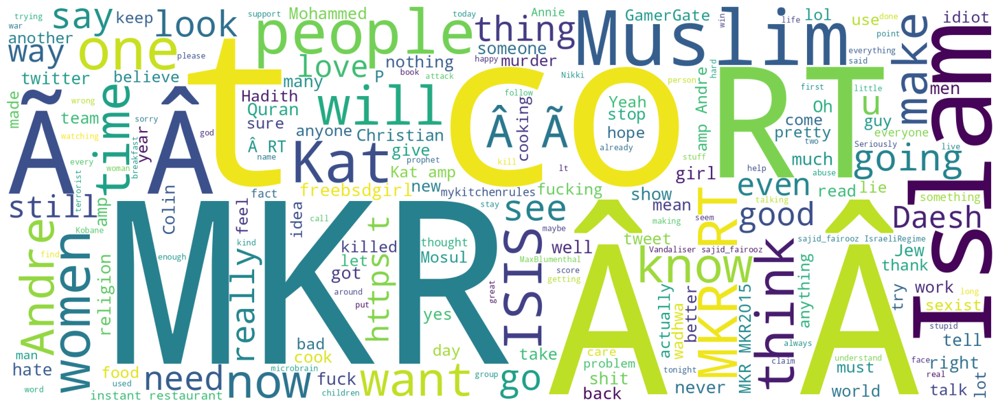

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in df.Text)
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

###### [Veri setinden kullanılacak sütun seçilmesi](#b1)

In [ ]:
df.columns

Index(['Text', 'label', 'score', 'hibrit', 'USAirPrePro', 'USAirPrePro2',
       'USAirPrePro3', 'MuammerNLPPrePRro', 'MuammerNLPPrePRro2',
       'MuammerNLPPrePRro3', 'MuammerNLPLSTMPrePRro'],
      dtype='object')

In [ ]:
#Kullanıacak kolon adi girin sonra çalıştırın. Yukarıdaki kolon isimlerinden seç
#secilen_kolon_adi='USAirPrePro2'
secilen_sentiment_kolon_adi='score'
#secilen_kolon_adi='hibrit'
secilen_kolon_adi='Text'

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(13471, 1)

In [ ]:
print(len(df))

13471


In [ ]:
data=df[[secilen_kolon_adi,secilen_sentiment_kolon_adi]]
data=data.reset_index(drop=True)

In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data.head()

,Text,score
1,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc,1
2,#NULL!,0
3,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.,1
4,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR",0
5,@carolinesinders @herecomesfran *hugs*,0


In [ ]:
X_df.head()

,Text
1,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc
2,#NULL!
3,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.
4,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR"
5,@carolinesinders @herecomesfran *hugs*


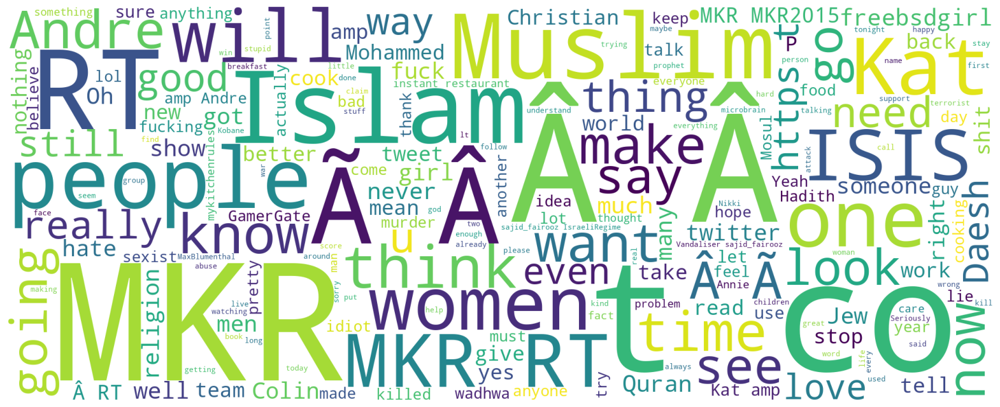

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in df['Text'])
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

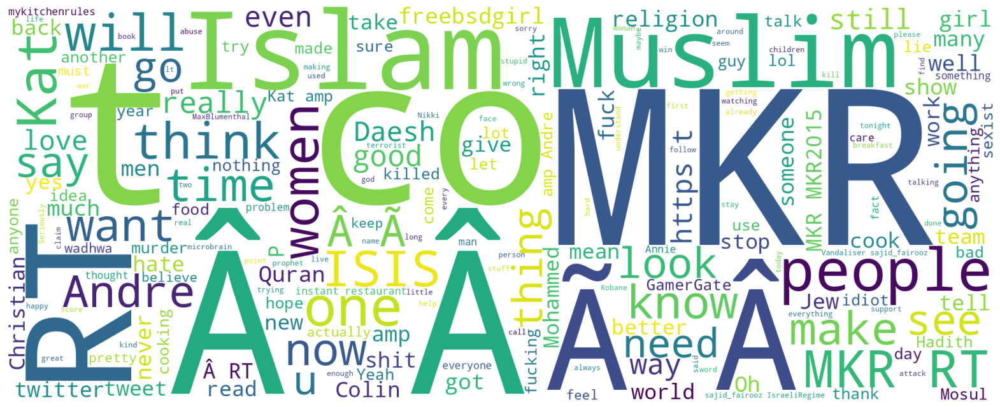

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in x_liste)
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

###### [x ve y değerlerinin belirlenmesi ve train tesst ayrımı](#b1)

In [ ]:
"""secilen_kolon_adi='USAirPrePro2'
secilen_sentiment_kolon_adi='score2'"""

In [ ]:
x = df[secilen_kolon_adi]
x

,Text
1,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc
2,#NULL!
3,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.
4,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR"
5,@carolinesinders @herecomesfran *hugs*
...,...
13467,#mkr NOOOOO!!! I wanted Kat and Andre to lose!!!
13468,RT @MumtazCeltik: @WhiteHouse @VP \n\n#Kobane \n\n#JeSuisCharlie \n\n'Turkish military says MIT shipped weapons to al-Qaeda'\n@fehimtastekinÃ¢ÂÂºÃ¢ÂÂºhttpÃ¢ÂÂ¦
13469,Glad the proper competition is starting and even happier that Colin is back. #mkr
13470,"No worries Pete and Manu, take all the time off you need. In fact, feel free to fuck right off - I prefer Colin #mkr"


In [ ]:
y = df[secilen_sentiment_kolon_adi]
y

,score
1,1
2,0
3,1
4,0
5,0
...,...
13467,0
13468,0
13469,0
13470,0


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
x

,Text
1,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc
2,#NULL!
3,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.
4,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR"
5,@carolinesinders @herecomesfran *hugs*
...,...
13467,#mkr NOOOOO!!! I wanted Kat and Andre to lose!!!
13468,RT @MumtazCeltik: @WhiteHouse @VP \n\n#Kobane \n\n#JeSuisCharlie \n\n'Turkish military says MIT shipped weapons to al-Qaeda'\n@fehimtastekinÃ¢ÂÂºÃ¢ÂÂºhttpÃ¢ÂÂ¦
13469,Glad the proper competition is starting and even happier that Colin is back. #mkr
13470,"No worries Pete and Manu, take all the time off you need. In fact, feel free to fuck right off - I prefer Colin #mkr"


####  [keşifsel veri analizi için deneme](#b1)


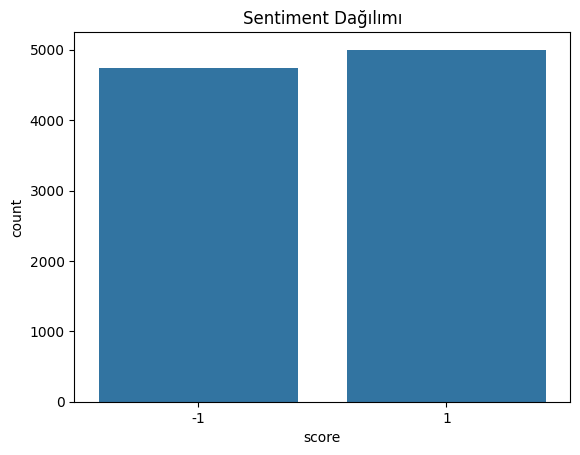

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.countplot(x='score', data=df)
plt.title("Sentiment Dağılımı")
plt.show()

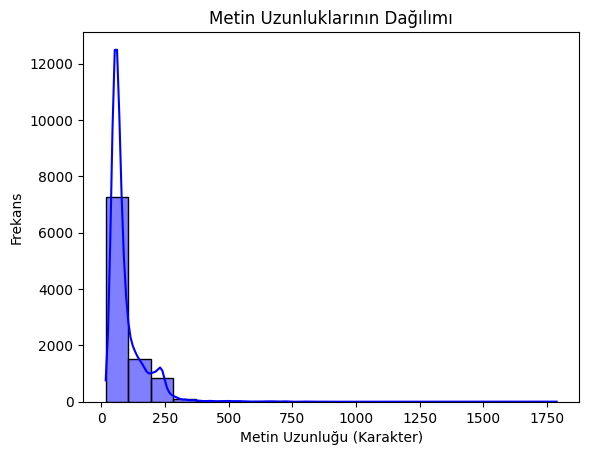

In [ ]:
df['text_length'] = df['Text'].apply(len)
sns.histplot(df['text_length'], bins=20, kde=True, color='blue')
plt.title("Metin Uzunluklarının Dağılımı")
plt.xlabel("Metin Uzunluğu (Karakter)")
plt.ylabel("Frekans")
plt.show()

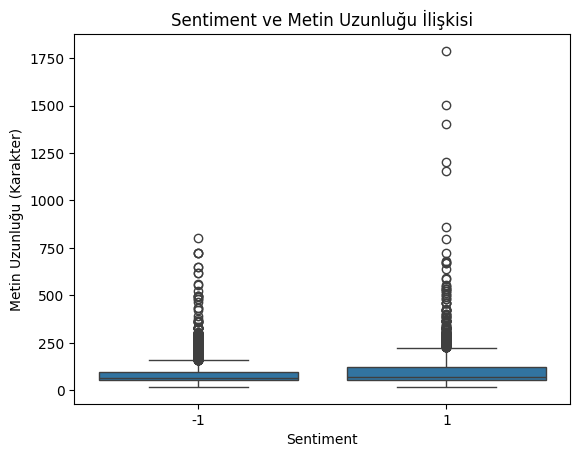

In [ ]:
# Sentiment bazında metin uzunluklarının dağılımı
sns.boxplot(x='score', y='text_length', data=df)
plt.title("Sentiment ve Metin Uzunluğu İlişkisi")
plt.xlabel("Sentiment")
plt.ylabel("Metin Uzunluğu (Karakter)")
plt.show()

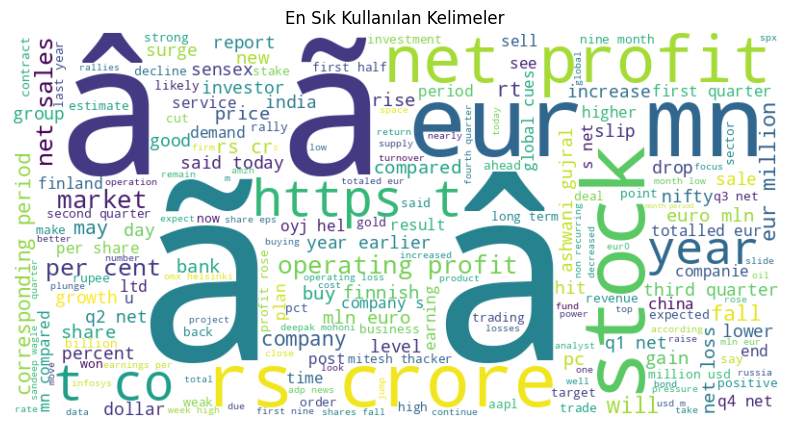

In [ ]:
from collections import Counter
from wordcloud import WordCloud

# Tüm metinleri birleştirerek kelimeleri say
all_words = " ".join(df['Text']).lower().split()
word_counts = Counter(all_words)

# En sık kullanılan kelimeleri görselleştirme
wordcloud = WordCloud(width=800, height=400, background_color="white").generate(" ".join(all_words))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("En Sık Kullanılan Kelimeler")
plt.show()

In [ ]:
# Pozitif, negatif ve nötr metinleri ayırma
positive_text = " ".join(df[df['score'] == '1']['Text']).lower()
negative_text = " ".join(df[df['score'] == '-1']['Text']).lower()
neutral_text = " ".join(df[df['score'] == '0']['Text']).lower()

In [ ]:
# Pozitif, negatif ve nötr metinleri ayırma
positive_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 1][secilen_kolon_adi]).lower()
negative_text = " ".join(df[df[secilen_sentiment_kolon_adi] == -1][secilen_kolon_adi]).lower()
neutral_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 0][secilen_kolon_adi]).lower()

In [ ]:
# Pozitif, negatif metinleri ayırma
positive_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 1][secilen_kolon_adi]).lower()
negative_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 0][secilen_kolon_adi]).lower()


In [ ]:
positive_text

'euronext list first french dutch belgian exchange glaxosmithkline consumer hit week high expansion plan snowman ipo get overwhelming response subscribing time small investor find merit beatendown midcaps like kfa suzlon energy lanco infra jyothy lab q net per cent edelweiss maintains buy irb infrastructure number collection error fell considerably operation speeded february finnish broadband data communication system provider teleste oyj hel tltv saw net profit jump eur last quarter eur period outotec oyj press release february outotec two large mineral processing technology order mirabela mineracao brasil ltda brazil cumerio med jsco bulgaria sensex hit record alltime high nifty race past finnish kci konecranes awarded order four hot metal ladle crane indian steel producer bhushan steel strip delivered acquisition double gcpls topline sistema deal help rcom launch g service later nitin soni initiate fresh long trade essar oil devang visaria finnish software developer basware oyj said

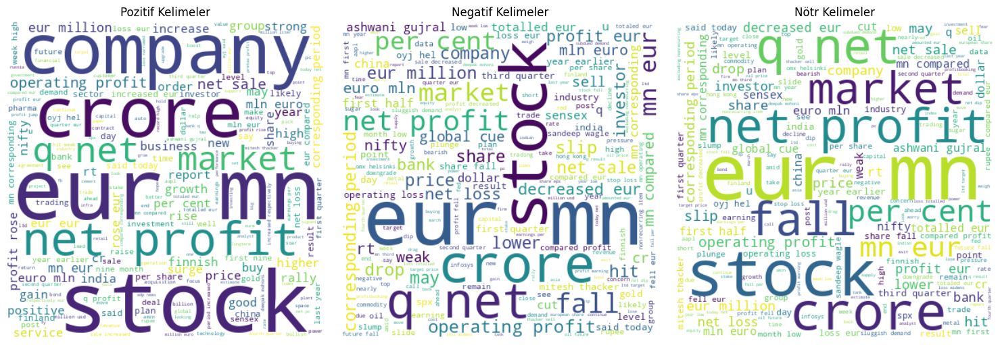

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Pozitif kelimeler
if positive_text.strip():
    axes[0].imshow(WordCloud(width=400, height=400, background_color="white").generate(positive_text), interpolation="bilinear")
    axes[0].set_title("Pozitif Kelimeler")
else:
    axes[0].text(0.5, 0.5, 'Veri yok', horizontalalignment='center', verticalalignment='center', fontsize=16)
axes[0].axis("off")

# Negatif kelimeler
if negative_text.strip():
    axes[1].imshow(WordCloud(width=400, height=400, background_color="white").generate(negative_text), interpolation="bilinear")
    axes[1].set_title("Negatif Kelimeler")
else:
    axes[1].text(0.5, 0.5, 'Veri yok', horizontalalignment='center', verticalalignment='center', fontsize=16)
axes[1].axis("off")

# Nötr kelimeler (örnek)
if neutral_text.strip():
    axes[2].imshow(WordCloud(width=400, height=400, background_color="white").generate(neutral_text), interpolation="bilinear")
    axes[2].set_title("Nötr Kelimeler")
else:
    axes[2].text(0.5, 0.5, 'Veri yok', horizontalalignment='center', verticalalignment='center', fontsize=16)
axes[2].axis("off")

plt.tight_layout()
plt.show()


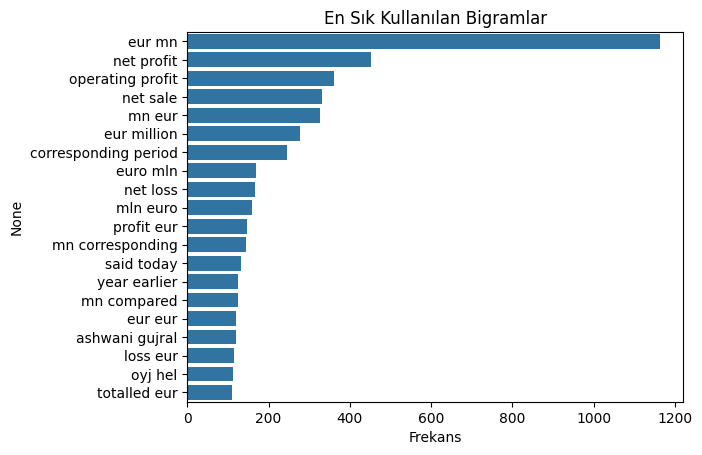

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

# Bigram oluşturma
vectorizer = CountVectorizer(ngram_range=(2, 2), max_features=20, stop_words='english')
bigrams = vectorizer.fit_transform(df[secilen_kolon_adi])
bigram_df = pd.DataFrame(bigrams.toarray(), columns=vectorizer.get_feature_names_out())

# En sık kullanılan bigramları görselleştirme
bigram_counts = bigram_df.sum().sort_values(ascending=False)
sns.barplot(x=bigram_counts.values, y=bigram_counts.index)
plt.title("En Sık Kullanılan Bigramlar")
plt.xlabel("Frekans")
plt.show()

* ## [TF_IDF](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [KNN](#svm)
    * #### [LOGISTIC REG](#log)


#####[Dosya en başta yüklenmişse](#b2)

######Kütüphanelerin Yüklenmesi

In [ ]:
pip install keras

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.stem.porter import *
nltk.download('gutenberg')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

from nltk.tokenize import TweetTokenizer
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import datetime

from scipy import stats
from scipy.sparse import hstack, csr_matrix
from sklearn.model_selection import train_test_split, cross_val_score

from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams

import string
import gensim
from gensim.models.phrases import Phraser, Phrases
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
pd.set_option('max_colwidth',400)
from bs4 import BeautifulSoup
import re

from tqdm import tqdm
from bokeh.io import output_notebook, output_file
from bokeh.plotting import show, figure
%matplotlib inline
from collections import defaultdict

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Package gutenberg is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [ ]:
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from tensorflow.keras.utils import to_categorical
import random
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.losses import categorical_crossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential


###### [Dosyanın yüklenmesi](#p2)

In [ ]:
#dirve da kullanacaksanız buras şart yoksa yorum satırına alınız
warnings.filterwarnings('ignore')

from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Bil482/
"""da db .csv nini yüklü olduğu klasör"""


Mounted at /content/drive
/content/drive/My Drive/Bil482


'da db .csv nini yüklü olduğu klasör'

In [ ]:
df=pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

###### [Veri setinin incelenmesi](#p2)

In [ ]:
df.isnull().values.any()

df.head(10)

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0
6,"SREI Infra is moving sideways: Ashwani Gujral, Market Strategist","[""['sir', 'infra', 'move', 'sideways', 'washwoman', 'inaugural', 'marker', 'strategist']""]",64,srei infra moving sideways ashwani gujral market strategist,srei infra move sideway ashwani gujral market strategist,srei infra moving sideways ashwani gujral market strategist,SREI Infra is moving sideways Ashwani Gujral Market Strategist,"SREI Infra is moving sideways: Ashwani Gujral, Market Strategist","srei infra move sideway ashwani gujral , market strategist",-1,0,0
7,Sweet sugar turns bitter for mill owners in 2014,"[""['sweet', 'sugar', 'turn', 'bitter', 'mill', 'owner', '2014']""]",48,sweet sugar turns bitter mill owners,sweet sugar turn bitter mill owner,sweet sugar turn bitter mill owner,Sweet sugar turns bitter for mill owners in,Sweet sugar turns bitter for mill owners in 2014,sweet sugar turn bitter mill owner,-1,0,0
8,Foreign investors navigate turmoil in Chinese markets with new playbook,"[""['fo reign', 'investor', 'navigable', 'turmoil', 'Chinese', 'market', 'no', 'playbook']""]",71,foreign investors navigate turmoil chinese markets new playbook,foreign investor navig turmoil chines market new playbook,foreign investor navigate turmoil chinese market new playbook,Foreign investors navigate turmoil in Chinese markets with new playbook,Foreign investors navigate turmoil in Chinese markets with new playbook,foreign investor navig turmoil chines market new playbook,-1,0,0
9,NIF may turn co-plaintiff in Modern India suit against NSEL,"[""['nigh', 'be', 'ten', 'co plaintiff', 'modern', 'India', 'soot', 'noel']""]",59,nif may turn co plaintiff modern india suit nsel,nif may turn coplaintiff modern india suit nsel,nif may turn coplaintiff modern india suit nsel,NIF may turn co plaintiff in Modern India suit against NSEL,NIF may turn co-plaintiff in Modern India suit against NSEL,nif may turn coplaintiff modern india suit nsel,-1,0,0
10,NIF may turn co-plaintiff in Modern India suit against NSEL,"[""['nigh', 'be', 'ten', 'co plaintiff', 'modern', 'India', 'soot', 'noel']""]",59,ni

<Axes: xlabel='score', ylabel='count'>

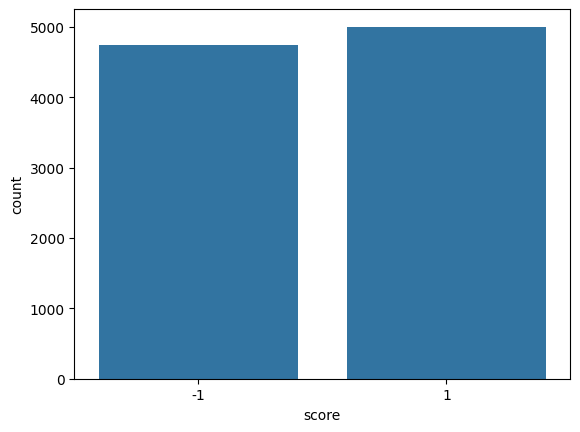

In [ ]:
import seaborn as sns
sns.countplot(x='score', data=df)

In [ ]:
df.shape

(9741, 12)

In [ ]:
print(len(df))

9741


#####[Dosya en başta yüklenmişse](#b2)

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
df.columns

Index(['Text', 'label', 'score', 'hibrit', 'USAirPrePro', 'USAirPrePro2',
       'USAirPrePro3', 'MuammerNLPPrePRro', 'MuammerNLPPrePRro2',
       'MuammerNLPPrePRro3', 'MuammerNLPLSTMPrePRro'],
      dtype='object')

In [ ]:
#secilen_kolon_adi="hibrit"
#secilen_sentiment_kolon_adi="score"

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(13471, 1)

In [ ]:
print(len(df))

9741


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data

,USAirPrePro2,score2
1,wipro growth remains mirage,0
2,chinese stock leave u investor vulnerable,0
3,u stock finish mixed amid tech selling,0
4,opec reduces estimate oil demand growth,0
5,immediate support rupee placed bonanza,0
...,...,...
9737,negotiation carried constructive manner party tried find solution situation,1
9738,wockhardt story really intriguing deven choksey,1
9739,finnish bore owned rettig family grown recently acquisition smaller shipping company,1
9740,operating profit eur mn eur mn,1


###### [Veri Ön işleme ](#b2)

In [ ]:
def preprocess_text(sen):
    # Removing html tags
    sentence = remove_tags(sen)

    # Remove punctuations and numbers
    sentence = re.sub('[^a-zA-Z]', ' ', sentence)

    # Single character removal
    sentence = re.sub(r"\s+[a-zA-Z]\s+", ' ', sentence)

    # Removing multiple spaces
    sentence = re.sub(r'\s+', ' ', sentence)

    return sentence

In [ ]:
TAG_RE = re.compile(r'<[^>]+>')

def remove_tags(text):
    return TAG_RE.sub('', text)

In [ ]:
df['Comment']=df['Text'].apply(str)

In [ ]:
X = []
sentences = list(df['Comment'])
for sen in sentences:
    X.append(preprocess_text(sen))

In [ ]:
y = df['score2']

In [ ]:
y.shape

(9741,)

In [ ]:
y_liste

,score2
1,0
2,0
3,0
4,0
5,0
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
x

,Text
1,"At Wipro, growth remains a mirage"
2,Why Chinese stocks leave US investors vulnerable
3,US stocks finish mixed amid more tech selling
4,Opec reduces estimate on oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza
...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation ."
9738,Wockhardt story is really intriguing: Deven Choksey
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .
9740,"Operating profit was EUR 24.5 mn , up from EUR 23.0 mn ."


In [ ]:
X #Büyük X

['At Wipro growth remains mirage',
 'Why Chinese stocks leave US investors vulnerable',
 'US stocks finish mixed amid more tech selling',
 'Opec reduces estimate on oil demand growth',
 'Immediate support for rupee is placed at Bonanza',
 'SREI Infra is moving sideways Ashwani Gujral Market Strategist',
 'Sweet sugar turns bitter for mill owners in ',
 'Foreign investors navigate turmoil in Chinese markets with new playbook',
 'NIF may turn co plaintiff in Modern India suit against NSEL',
 'NIF may turn co plaintiff in Modern India suit against NSEL',
 'Stock Buzz Sun Pharma may face resistance at current levels',
 'Investors should be wary of cyclicals even if Narendra Modi wins',
 'Markets will move sideways before next upside starts Ashwani Gujral',
 'Stock markets to see cautious trading amid elections IIP data Report',
 'Be cautious on amount of stock you buy into BEML Devang Visaria',
 'Immediate resistance for Reliance is around levels Mileen Vasudeo Angel Broking',
 ' Sahara in

###### %30-70

In [ ]:
  #X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
#df['score'] = df['score'].astype(int)
y = [int(val) for val in y]

In [ ]:
  X_train, X_test, y_train, y_test = train_test_split(x_liste, y_liste, test_size=0.30, random_state=42)

In [ ]:
x_liste

,Text
1,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc
2,#NULL!
3,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.
4,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR"
5,@carolinesinders @herecomesfran *hugs*
...,...
13467,#mkr NOOOOO!!! I wanted Kat and Andre to lose!!!
13468,RT @MumtazCeltik: @WhiteHouse @VP \n\n#Kobane \n\n#JeSuisCharlie \n\n'Turkish military says MIT shipped weapons to al-Qaeda'\n@fehimtastekinÃ¢ÂÂºÃ¢ÂÂºhttpÃ¢ÂÂ¦
13469,Glad the proper competition is starting and even happier that Colin is back. #mkr
13470,"No worries Pete and Manu, take all the time off you need. In fact, feel free to fuck right off - I prefer Colin #mkr"


---
<a id="p1"></a>
###### TF-IDF

In [ ]:
#feature extraction with Tf-idf vectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(max_features=10000)
train_vectors = vectorizer.fit_transform(X_train)
test_vectors = vectorizer.transform(X_test)
print(train_vectors.shape, test_vectors.shape)

(9429, 10000) (4042, 10000)


In [ ]:
print(test_vectors)

  (0, 722)	0.14538737210007138
  (0, 2591)	0.13108926933966653
  (0, 2815)	0.19400271977909536
  (0, 2995)	0.14458366680436432
  (0, 3723)	0.3648261054892112
  (0, 3913)	0.2476083064213541
  (0, 3918)	0.2658227392599095
  (0, 4349)	0.2378897784071529
  (0, 4598)	0.1390182152196274
  (0, 5329)	0.35323287926942926
  (0, 6462)	0.344240474397538
  (0, 7619)	0.35323287926942926
  (0, 8225)	0.08263579353802446
  (0, 9178)	0.3648261054892112
  (0, 9464)	0.1469841563194208
  (0, 9566)	0.1804709984367927
  (1, 369)	0.13758585941153703
  (1, 3545)	0.41783728581022705
  (1, 4008)	0.2737152557199986
  (1, 4046)	0.29102251131400875
  (1, 4232)	0.12208905222568506
  (1, 5362)	0.5209267098178547
  (1, 7314)	0.20913510542579974
  (1, 8158)	0.45193084346297596
  (1, 8437)	0.12836928733166916
  :	:
  (4039, 2836)	0.6862888859273134
  (4039, 4828)	0.7273290624281743
  (4040, 256)	0.20615625525045328
  (4040, 460)	0.3163391592442963
  (4040, 763)	0.1913771776675624
  (4040, 890)	0.3293104852345829
  (4040

In [ ]:
y_train = [int(val) for val in y_train]
y_test = [int(val) for val in y_test]


<a id="nb"></a>
###### NB

In [ ]:
#use ML algorithms classifier
#use a Naive Bayes Classifier and train the model on the training set.
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(train_vectors, y_train)

In [ ]:
#test the performance of our model on the test set to predict the sentiment labels
from  sklearn.metrics  import accuracy_score
predicted_NB = clf.predict(test_vectors)
print("Naive Bayes Accuracy Score -> ", accuracy_score(y_test,predicted_NB)*100)


Naive Bayes Accuracy Score ->  88.22365165759524


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predicted_NB))

              precision    recall  f1-score   support

           0       0.88      0.99      0.93      3431
           1       0.88      0.26      0.40       611

    accuracy                           0.88      4042
   macro avg       0.88      0.62      0.67      4042
weighted avg       0.88      0.88      0.85      4042



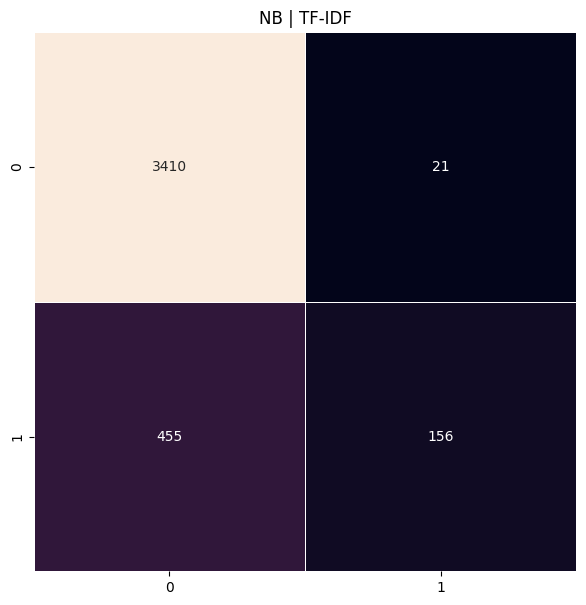

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predicted_NB)
plt.figure(figsize=(7,7))
plt.title("NB | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

predicted_NB= predicted_NB.astype(int)
y_test = y_test.astype(int)
# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_log)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


NameError: name 'predictions_log' is not defined

<a id="svm"></a>
###### SVM  

In [ ]:
from sklearn.svm import LinearSVC
l2_norm = 2
l2_norm_inverse = 1/l2_norm
maximum_iterations=4000 #maximum number of iterations
svm = LinearSVC(C=l2_norm_inverse,max_iter=maximum_iterations) #create support vector machine model

SVM=svm.fit(train_vectors,y_train)
import numpy as np
#y_true = np.array(y_true).astype(int)

# predict the labels on validation dataset
predictions_SVM = SVM.predict(test_vectors)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  92.80059376546265


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_SVM))

              precision    recall  f1-score   support

           0       0.95      0.97      0.96      3431
           1       0.79      0.71      0.75       611

    accuracy                           0.93      4042
   macro avg       0.87      0.84      0.85      4042
weighted avg       0.93      0.93      0.93      4042



In [ ]:
y_test.head(500)

,score
4464,0
3290,0
8420,0
7608,0
6867,0
...,...
6428,0
1635,0
9594,0
10913,0


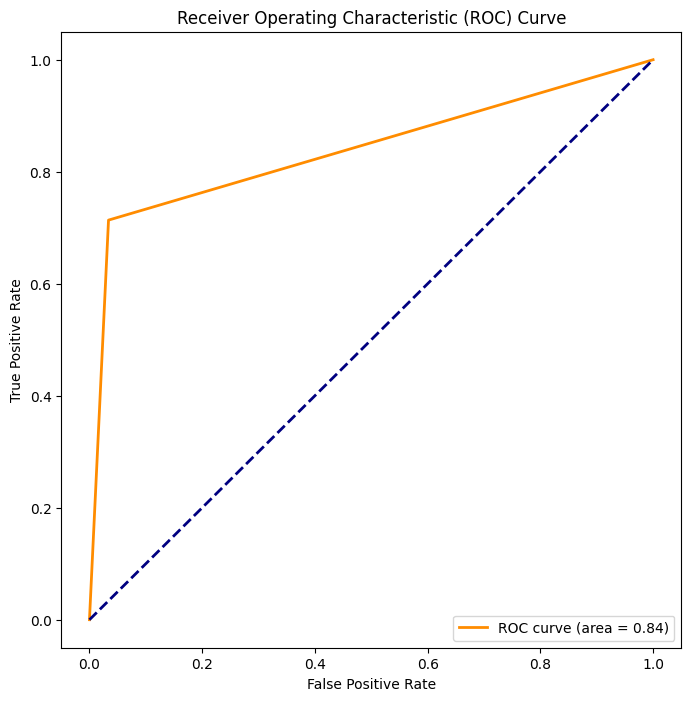

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

predictions_SVM= predictions_SVM.astype(int)
y_test = y_test.astype(int)
# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_SVM)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


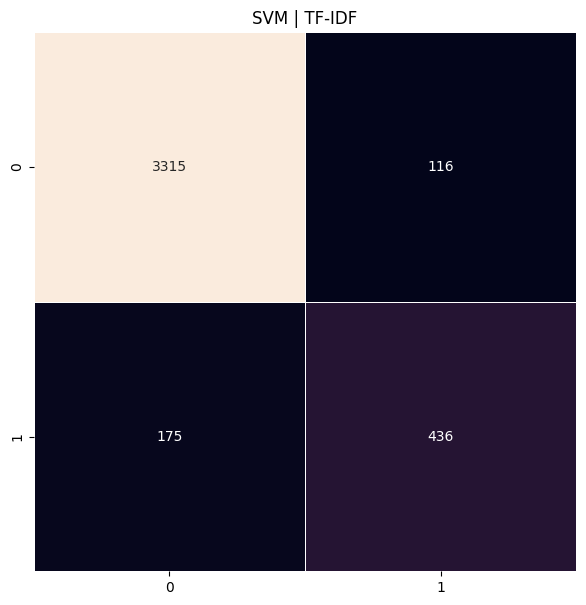

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_SVM)
plt.figure(figsize=(7,7))
plt.title("SVM | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


<a id="log"></a>
###### Log Reg

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
log_reg = linear_model.LogisticRegression()

y_train = [int(val) for val in y_train]
y_test = [int(val) for val in y_test]
log_reg.fit(train_vectors,y_train)
predictions_log = log_reg.predict(test_vectors)
print("Logistic Regression Accuracy Score -> ",accuracy_score(predictions_log, y_test)*100)

Logistic Regression Accuracy Score ->  91.21721919841661


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_log))

              precision    recall  f1-score   support

           0       0.93      0.97      0.95      3431
           1       0.79      0.57      0.66       611

    accuracy                           0.91      4042
   macro avg       0.86      0.77      0.81      4042
weighted avg       0.91      0.91      0.91      4042



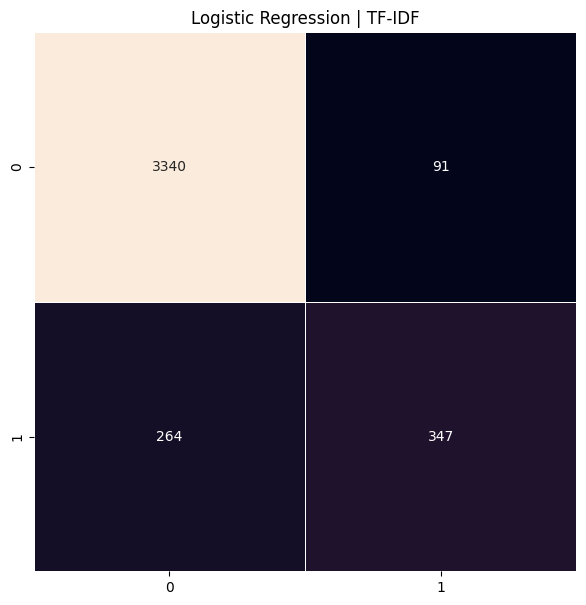

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_log)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

In [ ]:
y_test

,score2
3313,0
3669,0
7536,1
5226,1
9618,1
...,...
1972,0
2906,0
531,0
3283,0


In [ ]:
predictions_log

array([0, 0, 0, ..., 0, 0, 0])

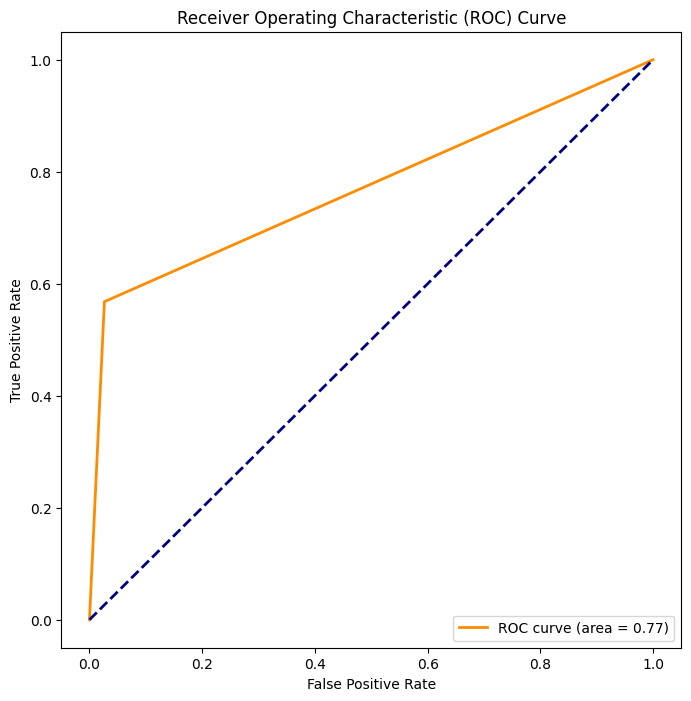

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

predictions_log= predictions_log.astype(int)
y_train = [int(val) for val in y_train]
y_test = [int(val) for val in y_test]
# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_log)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


<a id="knn"></a>
###### KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
number_of_neigbors = 5
minkowski_power = 2 # Manhattan Distance = 1, Euclidean Distance = 2
knn = KNeighborsClassifier(n_neighbors=number_of_neigbors, p =minkowski_power)
model_knn=knn.fit(train_vectors, y_train)
predictions_knn = model_knn.predict(test_vectors)
predictions_knn= predictions_knn.astype(int)
y_train = [int(val) for val in y_train]
y_test = [int(val) for val in y_test]
# Use accuracy_score function to get the accuracy
print("KNN Accuracy Score -> ",accuracy_score(predictions_knn, y_test)*100)





KNN Accuracy Score ->  85.23008411677388


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_knn))

              precision    recall  f1-score   support

           0       0.85      1.00      0.92      3431
           1       0.85      0.03      0.05       611

    accuracy                           0.85      4042
   macro avg       0.85      0.51      0.49      4042
weighted avg       0.85      0.85      0.79      4042



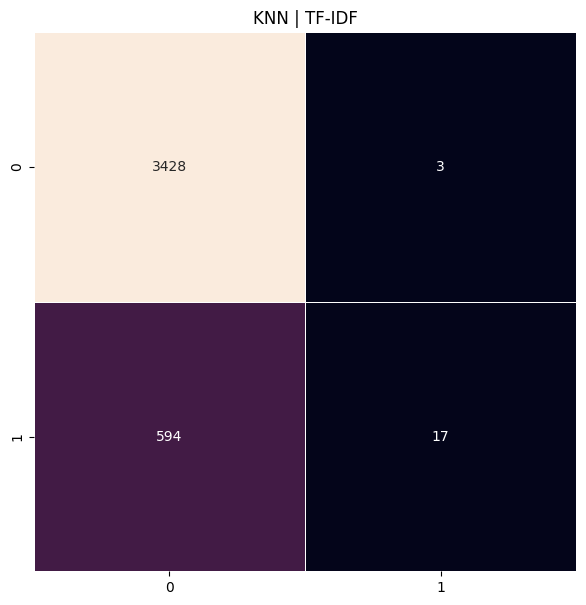

In [ ]:

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_knn)
plt.figure(figsize=(7,7))
plt.title("KNN | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

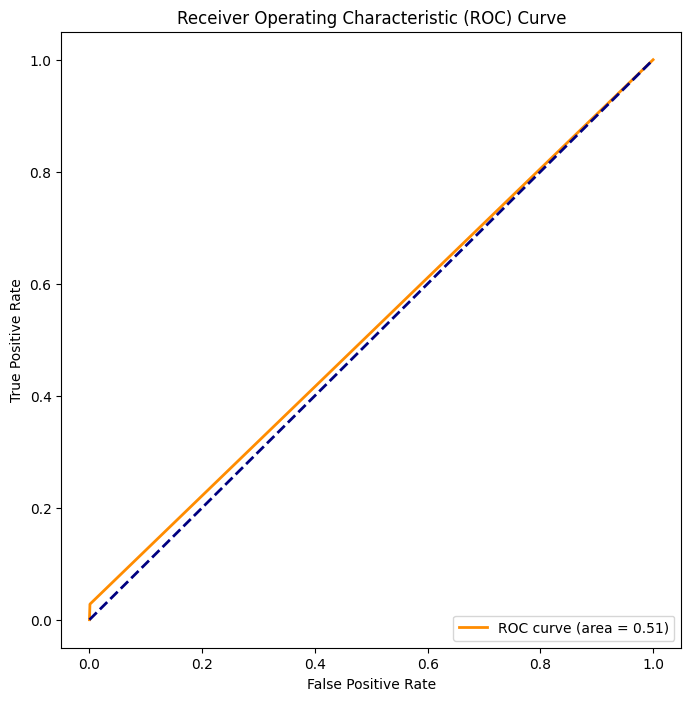

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_knn)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


###### Decision tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

# Decision Tree sınıflandırıcısını tanımla
tree_clf = DecisionTreeClassifier()

# Modeli eğit
tree_clf.fit(train_vectors, y_train)

# Test verileri üzerinde tahmin yap
predictions_tree = tree_clf.predict(test_vectors)

predictions_tree= predictions_tree.astype(int)
y_train = [int(val) for val in y_train]
y_test = [int(val) for val in y_test]
# Doğruluk skorunu hesapla ve yazdır
print("Decision Tree Accuracy Score -> ", accuracy_score(predictions_tree, y_test) * 100)


Decision Tree Accuracy Score ->  90.30183077684315


In [ ]:
from sklearn.metrics import classification_report

# Sınıflandırma raporunu yazdır
print(classification_report(y_test, predictions_tree))


              precision    recall  f1-score   support

           0       0.94      0.94      0.94      3431
           1       0.68      0.69      0.68       611

    accuracy                           0.90      4042
   macro avg       0.81      0.81      0.81      4042
weighted avg       0.90      0.90      0.90      4042



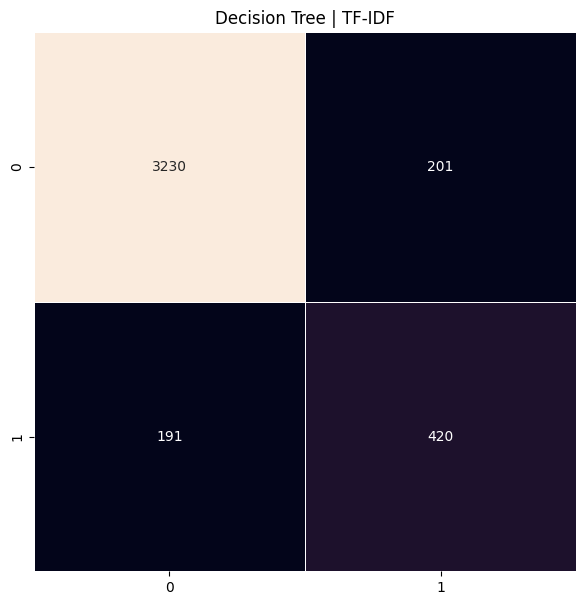

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Karar ağacı modeli için confusion matrix oluştur
cm_tree = confusion_matrix(y_test, predictions_tree)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Decision Tree | TF-IDF")
sns.heatmap(cm_tree, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


######Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Random Forest sınıflandırıcısını tanımla
rf_clf = RandomForestClassifier()

# Modeli eğit
rf_clf.fit(train_vectors, y_train)

# Test verileri üzerinde tahmin yap
predictions_rf = rf_clf.predict(test_vectors)
predictions_rf = predictions_rf.astype(int)
y_train = [int(val) for val in y_train]
y_test = [int(val) for val in y_test]

# Doğruluk skorunu hesapla ve yazdır
print("Random Forest Accuracy Score -> ", accuracy_score(predictions_rf, y_test) * 100)


Random Forest Accuracy Score ->  91.95942602671946


In [ ]:
from sklearn.metrics import classification_report

# Sınıflandırma raporunu yazdır
print(classification_report(y_test, predictions_rf))


              precision    recall  f1-score   support

           0       0.89      0.84      0.86      1432
           1       0.86      0.90      0.88      1491

    accuracy                           0.87      2923
   macro avg       0.87      0.87      0.87      2923
weighted avg       0.87      0.87      0.87      2923



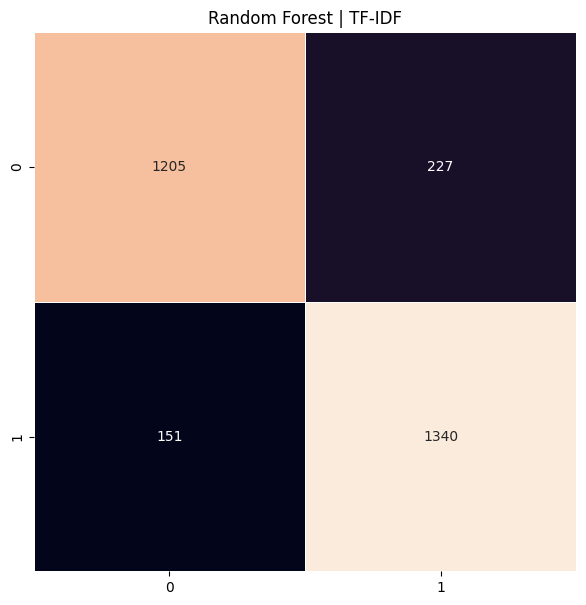

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Random Forest modeli için confusion matrix oluştur
cm_rf = confusion_matrix(y_test, predictions_rf)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Random Forest | TF-IDF")
sns.heatmap(cm_rf, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


* ## [BOW](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [LOGISTIC REG](#log)
    * #### [Decission Tree](#log)
    * #### [Random Forest](#log)
    
    

#####[Dosya en başta yüklenmişse](#b2)

######[Kütüphanelerin yüklenmesi ve test setinin oluşturulması](#b2)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.stem.porter import *
nltk.download('gutenberg')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

from nltk.tokenize import TweetTokenizer
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import datetime

from scipy import stats
from scipy.sparse import hstack, csr_matrix
from sklearn.model_selection import train_test_split, cross_val_score

from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams

import string
import gensim
from gensim.models.phrases import Phraser, Phrases
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
pd.set_option('max_colwidth',400)
from bs4 import BeautifulSoup
import re

from tqdm import tqdm
from bokeh.io import output_notebook, output_file
from bokeh.plotting import show, figure
%matplotlib inline
from collections import defaultdict

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Package gutenberg is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [ ]:
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")

In [ ]:
altta hata oluştu

In [ ]:
from keras.utils import to_categorical
import random
from sklearn.model_selection import train_test_split
from keras.preprocessing import sequence
from keras.preprocessing.text import Tokenizer
from keras.layers import Dense,Dropout,Embedding,LSTM
from keras.callbacks import EarlyStopping
from keras.losses import categorical_crossentropy
from keras.optimizers import Adam
from keras.models import Sequential

ModuleNotFoundError: No module named 'keras.preprocessing.text'

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM
from tensorflow.keras.callbacks import EarlyStopping


In [ ]:
import tensorflow as tf
print(tf.__version__)


2.18.0


In [ ]:
!pip install --upgrade tensorflow keras


In [ ]:
!pip uninstall keras -y
!pip install keras tensorflow


Found existing installation: keras 3.6.0
Uninstalling keras-3.6.0:
  Successfully uninstalled keras-3.6.0
  Using cached keras-3.6.0-py3-none-any.whl.metadata (5.8 kB)
Using cached keras-3.6.0-py3-none-any.whl (1.2 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-keras 2.17.0 requires tensorflow<2.18,>=2.17, but you have tensorflow 2.18.0 which is incompatible.


In [ ]:
!pip install nltk
from nltk.tokenize import word_tokenize


###### [Dosyanın yüklenmesi](#b2)

In [ ]:
warnings.filterwarnings('ignore')
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Eski/Bil482/
df=pd.read_csv("Loan.csv",index_col=0)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/Bil482


In [ ]:
df=pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

In [ ]:
df.isnull().values.any()

df.head()

,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,NumberOfDependents,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,LoanApproved,RiskScore
ApplicationDate,,,,,,,,,,,,,,,,,,,,,
2018-01-01,45,39948,617,Employed,Master,22,13152,48,Married,2,...,3329.000000,0.724972,11,126928,0.199652,0.227590,419.805992,0.181077,0,49.0
2018-01-02,38,39709,628,Employed,Associate,15,26045,48,Single,1,...,3309.083333,0.935132,3,43609,0.207045,0.201077,794.054238,0.389852,0,52.0
2018-01-03,47,40724,570,Employed,Bachelor,26,17627,36,Married,2,...,3393.666667,0.872241,6,5205,0.217627,0.212548,666.406688,0.462157,0,52.0
2018-01-04,58,69084,545,Employed,High School,34,37898,96,Single,1,...,5757.000000,0.896155,5,99452,0.300398,0.300911,1047.506980,0.313098,0,54.0
2018-01-05,37,103264,594,Employed,Associate,17,9184,36,Married,1,...,8605.333333,0.941369,5,227019,0.197184,0.175990,330.179140,0.070210,1,36.0


In [ ]:
df.shape

(20000, 35)

In [ ]:
print(len(df))

20000


In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in df.Text)
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

AttributeError: 'DataFrame' object has no attribute 'Text'

#####[Dosya en başta yüklemişse](#b2)

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
#secilen_kolon_adi="hibrit"

In [ ]:
#secilen_sentiment_kolon_adi="score2"

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(9741, 1)

In [ ]:
print(len(df))

9741


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data

,Text,score
1,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc,1
2,#NULL!,0
3,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.,1
4,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR",0
5,@carolinesinders @herecomesfran *hugs*,0
...,...,...
13467,#mkr NOOOOO!!! I wanted Kat and Andre to lose!!!,0
13468,RT @MumtazCeltik: @WhiteHouse @VP \n\n#Kobane \n\n#JeSuisCharlie \n\n'Turkish military says MIT shipped weapons to al-Qaeda'\n@fehimtastekinÃ¢ÂÂºÃ¢ÂÂºhttpÃ¢ÂÂ¦,0
13469,Glad the proper competition is starting and even happier that Colin is back. #mkr,0
13470,"No worries Pete and Manu, take all the time off you need. In fact, feel free to fuck right off - I prefer Colin #mkr",0


###### [Veri ön işleme](#b2)

In [ ]:
def preprocess_text(sen):
    # Removing html tags
    sentence = remove_tags(sen)

    # Remove punctuations and numbers
    sentence = re.sub('[^a-zA-Z]', ' ', sentence)

    # Single character removal
    sentence = re.sub(r"\s+[a-zA-Z]\s+", ' ', sentence)

    # Removing multiple spaces
    sentence = re.sub(r'\s+', ' ', sentence)

    return sentence

In [ ]:
TAG_RE = re.compile(r'<[^>]+>')

def remove_tags(text):
    return TAG_RE.sub('', text)

In [ ]:
df['Comment']=df['Text'].apply(str)

In [ ]:
X = []
sentences = list(df['Comment'])
for sen in sentences:
    X.append(preprocess_text(sen))

In [ ]:
X

[' AAlwuhaib Muslim mob violence against Hindus in Bangladesh continues in Islam http co JBWJwuRc',
 ' NULL ',
 ' jncatron isra jourisra AMPalestine Islamophobia is like the idea of Naziphobia Islam is religion of hate and it must be outlawed ',
 'Finally m all caught up and that sudden death cook off looks like it gonna be intense MKR',
 ' carolinesinders herecomesfran hugs ',
 'Please PLEASE start using is your discernment blunted by steroids to mean are you on DRUGS from now on DEAD',
 ' aymannathem As soon as ISIS chased all the minorities out of Mosul the Sunni Arabs were happy to steal their property So fuck them ',
 ' Ali Gharib MaxBlumenthal Glad you like it http co ME Nrk xZ',
 ' HuffPostRelig Islam invaded and conquered of Christiandom before any Christian crusades in response The writer is liar ',
 ' semzyxx Do you approve of your pedophile prophet raping year old girl like it says in hadith ',
 ' watan geeky zekey Problem with vile Muslims is that they try to rationalize am

In [ ]:
y = df['oh_label']

KeyError: 'oh_label'

###### %30-70

In [ ]:
x

,hibrit
1,wipro growth remains mirage
2,chinese stocks leave us investors vulnerable
3,us stocks finish mixed amid tech selling
4,opec reduces estimate oil demand growth
5,immediate support rupee placed bonanza
...,...
9737,negotiations carried constructive manner parties tried find solution situation
9738,wockhardt story really intriguing deven choksey
9739,finnish bore owned rettig family grown recently acquisition smaller shipping companies
9740,operating profit eur mn eur mn


In [ ]:
y

,score2
1,0
2,0
3,0
4,0
5,0
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x_liste, y_liste, test_size=0.30, random_state=42)

In [ ]:
from sklearn import  preprocessing

In [ ]:
encoder = preprocessing.LabelEncoder()
y_train = encoder.fit_transform(y_train)
y_test = encoder.fit_transform(y_test)

###### BOW

In [ ]:
#feature extraction with Tf-idf vectorizer

#feature extraction with BOW
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(max_features=10000)
vectorizer.fit(X_train)

train_vectors = vectorizer.transform(X_train)
test_vectors = vectorizer.transform(X_test)
print(train_vectors.shape, test_vectors.shape)

(9429, 10000) (4042, 10000)


###### NB

In [ ]:
#use ML algorithms classifier
#use a Naive Bayes Classifier and train the model on the training set.
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(train_vectors, y_train)

In [ ]:
#test the performance of our model on the test set to predict the sentiment labels
from  sklearn.metrics  import accuracy_score
predicted = clf.predict(test_vectors)
print("Naive Bayes Accuracy Score -> ", accuracy_score(y_test,predicted)*100)


Naive Bayes Accuracy Score ->  90.59871350816428


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predicted))

              precision    recall  f1-score   support

           0       0.97      0.92      0.94      3431
           1       0.64      0.84      0.73       611

    accuracy                           0.91      4042
   macro avg       0.81      0.88      0.84      4042
weighted avg       0.92      0.91      0.91      4042



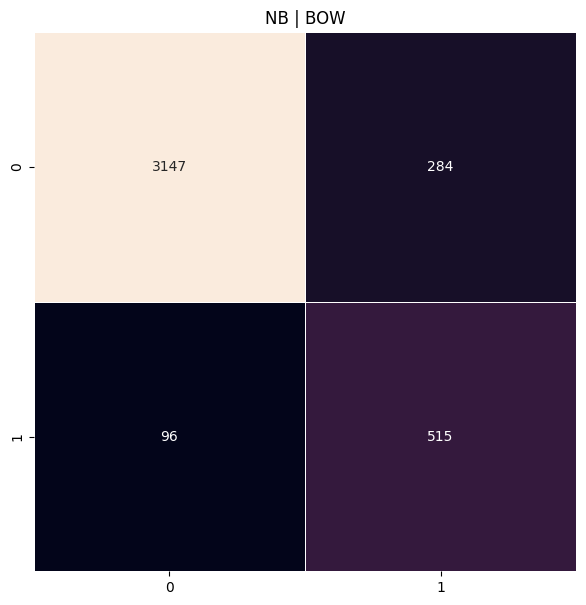

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predicted)
plt.figure(figsize=(7,7))
plt.title("NB | BOW")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### SVM

In [ ]:
from sklearn.svm import LinearSVC
l2_norm = 2
l2_norm_inverse = 1/l2_norm
maximum_iterations=4000
svm = LinearSVC(C=l2_norm_inverse,max_iter=maximum_iterations)
SVM=svm.fit(train_vectors,y_train)

# predict the labels on validation dataset
predictions_SVM = SVM.predict(test_vectors)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  91.83572488866898


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_SVM))

              precision    recall  f1-score   support

           0       0.95      0.96      0.95      3431
           1       0.74      0.71      0.72       611

    accuracy                           0.92      4042
   macro avg       0.84      0.83      0.84      4042
weighted avg       0.92      0.92      0.92      4042



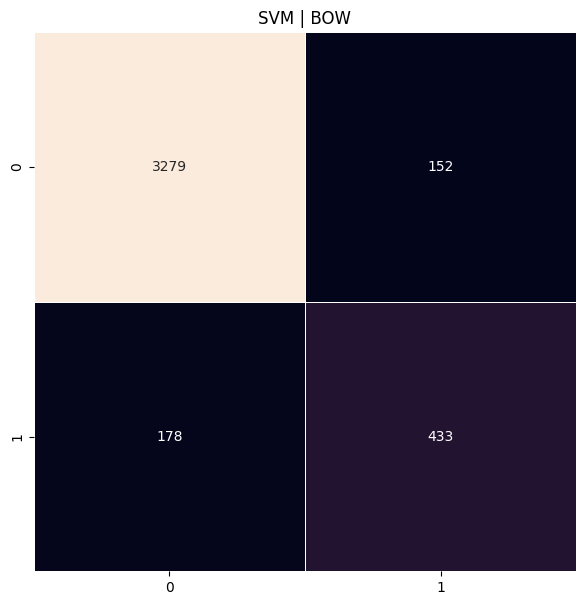

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_SVM)
plt.figure(figsize=(7,7))
plt.title("SVM | BOW")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### LOG REG

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
log_reg = linear_model.LogisticRegression()
log_reg.fit(train_vectors,y_train)
predictions_log = log_reg.predict(test_vectors)
print("Logistic Regression Accuracy Score -> ",accuracy_score(predictions_log, y_test)*100)

Logistic Regression Accuracy Score ->  92.40475012370113


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_log))

              precision    recall  f1-score   support

           0       0.95      0.97      0.96      3431
           1       0.79      0.68      0.73       611

    accuracy                           0.92      4042
   macro avg       0.87      0.83      0.84      4042
weighted avg       0.92      0.92      0.92      4042



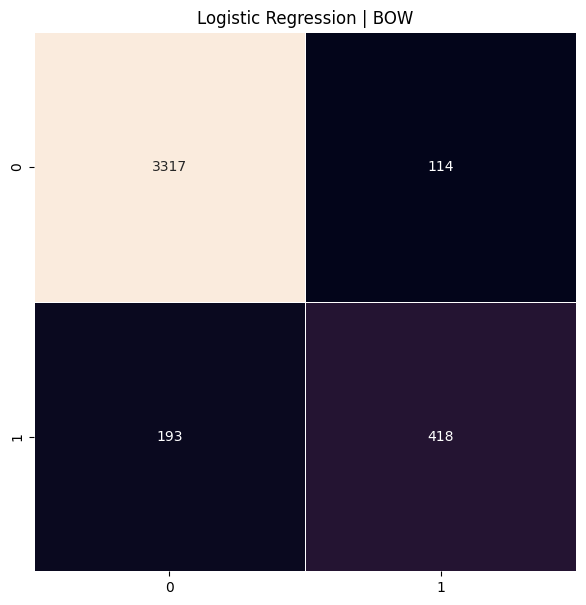

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_log)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | BOW")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### Decission Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
tree_clf = DecisionTreeClassifier()
tree_clf.fit(train_vectors, y_train)
predictions_tree = tree_clf.predict(test_vectors)
print("Decision Tree Accuracy Score -> ", accuracy_score(predictions_tree, y_test) * 100)

Decision Tree Accuracy Score ->  91.3409203364671


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_tree))

              precision    recall  f1-score   support

           0       0.95      0.95      0.95      3431
           1       0.71      0.73      0.72       611

    accuracy                           0.91      4042
   macro avg       0.83      0.84      0.83      4042
weighted avg       0.91      0.91      0.91      4042



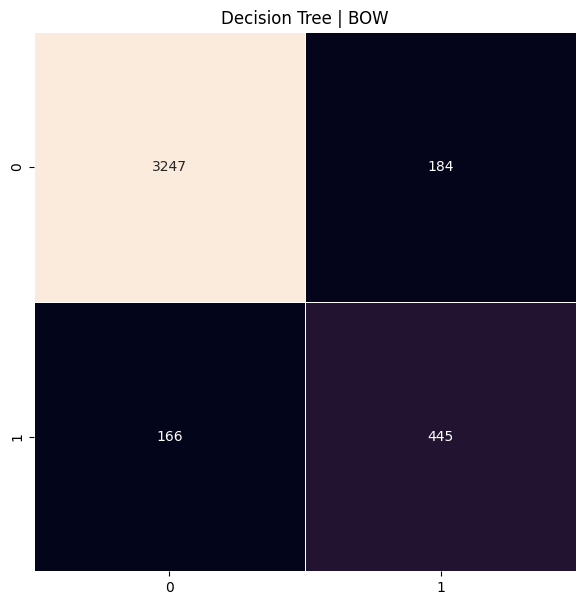

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Karar ağacı modeli için confusion matrix oluştur
cm_tree = confusion_matrix(y_test, predictions_tree)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Decision Tree | BOW")
sns.heatmap(cm_tree, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### Random forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Random Forest sınıflandırıcısını tanımla
rf_clf = RandomForestClassifier()

# Modeli eğit
rf_clf.fit(train_vectors, y_train)

# Test verileri üzerinde tahmin yap
predictions_rf = rf_clf.predict(test_vectors)

# Doğruluk skorunu hesapla ve yazdır
print("Random Forest Accuracy Score -> ", accuracy_score(predictions_rf, y_test) * 100)


Random Forest Accuracy Score ->  92.03364670954973


In [ ]:
from sklearn.metrics import classification_report

# Sınıflandırma raporunu yazdır
print(classification_report(y_test, predictions_rf))

              precision    recall  f1-score   support

           0       0.93      0.98      0.95      3431
           1       0.81      0.61      0.70       611

    accuracy                           0.92      4042
   macro avg       0.87      0.79      0.83      4042
weighted avg       0.92      0.92      0.92      4042



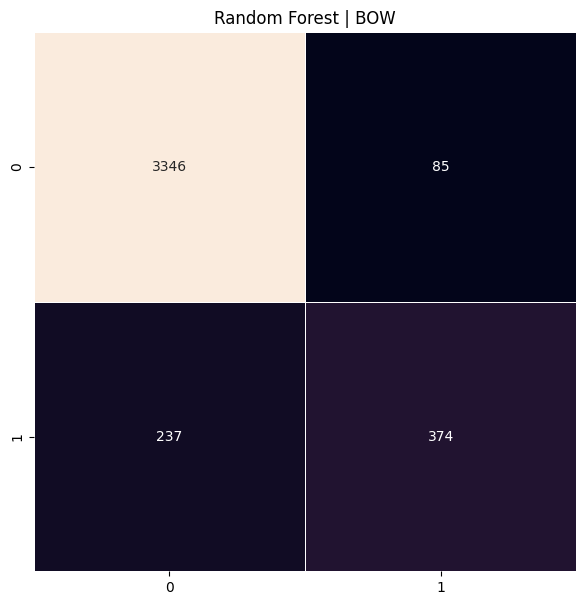

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Random Forest modeli için confusion matrix oluştur
cm_rf = confusion_matrix(y_test, predictions_rf)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Random Forest | BOW")
sns.heatmap(cm_rf, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


* ## [W2V](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [LOGISTIC REG](#log)


#####[Dosya en başta yüklenmemişse](#b2)

###### [Kütüphanelerin eklenmesi](#b2)

> Blok alıntı ekle



In [ ]:
# importing required libraries
import pandas as pd
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import string
import nltk
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

%matplotlib inline

In [ ]:
#dirve da kullanacaksanız buras şart yoksa yorum satırına alınız
warnings.filterwarnings('ignore')

from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Bil482/  #çalışılacak drve dizinni


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[Errno 2] No such file or directory: '/content/drive/My Drive/Bil482/ #çalışılacak drve dizinni'
/content/drive/My Drive/Bil482


'\n\ndata = pd.read_csv("db.csv",index_col=0)\ndata.isnull().values.any()\n\ndata.head()'

In [ ]:
data = pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

In [ ]:
data['Text'].isnull().values.any()

False

In [ ]:
data.head()

,Text,score
1,"At Wipro, growth remains a mirage",-1
2,Why Chinese stocks leave US investors vulnerable,-1
3,US stocks finish mixed amid more tech selling,-1
4,Opec reduces estimate on oil demand growth,-1
5,Immediate support for rupee is placed at 55.10: Bonanza,-1


In [ ]:
data.head()

,Text,score
0,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc,1
1,#NULL!,0
2,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.,1
3,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR",0
4,@carolinesinders @herecomesfran *hugs*,0


In [ ]:
data.shape

(9741, 2)

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
import gensim

In [ ]:
data['Text'] = data['Text'].values.astype('U')
"""data['Text'] = data['Comment'].values.astype('U')"""

"data['Text'] = data['Comment'].values.astype('U')"

In [ ]:
data['Text'].head()

,Text
1,"At Wipro, growth remains a mirage"
2,Why Chinese stocks leave US investors vulnerable
3,US stocks finish mixed amid more tech selling
4,Opec reduces estimate on oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza


#####[Dosya en başta yüklenmemişse](#b2)

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
#secilen_kolon_adi="hibrit"
#secilen_sentiment_kolon_adi="score2"

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(9741, 1)

In [ ]:
print(len(df))

9741


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data

,USAirPrePro2,score2
1,wipro growth remains mirage,0
2,chinese stock leave u investor vulnerable,0
3,u stock finish mixed amid tech selling,0
4,opec reduces estimate oil demand growth,0
5,immediate support rupee placed bonanza,0
...,...,...
9737,negotiation carried constructive manner party tried find solution situation,1
9738,wockhardt story really intriguing deven choksey,1
9739,finnish bore owned rettig family grown recently acquisition smaller shipping company,1
9740,operating profit eur mn eur mn,1


,score2
1,0
2,0
3,0
4,0
5,0
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
data_size=data.shape[0]
data_size

13471

###### [**Word Embeddings**](#b2)
1. Word2Vec Embeddings

- 100 dim,
- cbow

In [ ]:
tokenized_tweet = data[secilen_kolon_adi].head(data_size).apply(lambda x: x.split()) # tokenizing

model_w2v = gensim.models.Word2Vec(
            tokenized_tweet,
            vector_size=100,
            window=5, # context window size
            min_count=2,
            sg = 0, # 1 for skip-gram model
            hs = 0,
            negative = 10, # for negative sampling
            workers= 2, # no.of cores
            seed = 34)

model_w2v.train(tokenized_tweet, total_examples= len(data[secilen_kolon_adi]), epochs=20)

(2932614, 4015480)

In [ ]:
tokenized_tweet


,Text
1,"[@AAlwuhaib1977, Muslim, mob, violence, against, Hindus, in, Bangladesh, continues, in, 2014., #Islam, http://t.co/C1JBWJwuRc]"
2,[#NULL!]
3,"[@jncatron, @isra_jourisra, @AMPalestine, Islamophobia, is, like, the, idea, of, Naziphobia., Islam, is, a, religion, of, hate, and, it, must, be, outlawed.]"
4,"[Finally, I'm, all, caught, up,, and, that, sudden, death, cook, off, looks, like, it's, gonna, be, intense, #MKR]"
5,"[@carolinesinders, @herecomesfran, *hugs*]"
...,...
13467,"[#mkr, NOOOOO!!!, I, wanted, Kat, and, Andre, to, lose!!!]"
13468,"[RT, @MumtazCeltik:, @WhiteHouse, @VP, #Kobane, #JeSuisCharlie, 'Turkish, military, says, MIT, shipped, weapons, to, al-Qaeda', @fehimtastekinÃ¢ÂÂºÃ¢ÂÂºhttpÃ¢ÂÂ¦]"
13469,"[Glad, the, proper, competition, is, starting, and, even, happier, that, Colin, is, back., #mkr]"
13470,"[No, worries, Pete, and, Manu,, take, all, the, time, off, you, need., In, fact,, feel, free, to, fuck, right, off, -, I, prefer, Colin, #mkr]"


In [ ]:
tokenized_tweet.shape

(13471,)

In [ ]:
null_count = 0
from contextlib import nullcontext

# Örnek bir tokenized_tweet listesi oluşturalım
tokenized_tweet = [{"Text": "#NULL!"}, {"Text": "some_text"}, {"Text": "#NULL!"}]

# Sözlük olup olmadığını kontrol edelim ve "Text" anahtarının varlığını kontrol edelim
for tweet in tokenized_tweet:
    if isinstance(tweet, dict) and "Text" in tweet:
        if tweet["Text"] == '#NULL!':
            null_count += 1

print(null_count)


2


In [ ]:
def word_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v[word].reshape((1, size))
            count += 1.
        except KeyError: # handling the case where the token is not in vocabulary

            continue
    if count != 0:
        vec /= count
    return vec

In [ ]:
# Assuming 'model_w2v' is the Word2Vec model you trained earlier
def get_tweet_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v.wv[word].reshape((1, size))
            count += 1.
        except KeyError:  # handling the case where the word is not in the vocabulary
            continue
    if count != 0:
        vec /= count
    return vec

#wordvec_arrays = np.zeros((len(tokenized_tweet), 100))

In [ ]:
"""for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape"""

(3, 100)

In [ ]:
# Assuming 'model_w2v' is the Word2Vec model you trained earlier
def get_tweet_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v.wv[word].reshape((1, size))
            count += 1.
        except KeyError:  # handling the case where the word is not in the vocabulary
            continue
    if count != 0:
        vec /= count
    return vec

wordvec_arrays = np.zeros((len(tokenized_tweet), 100))

"""for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape
"""

'for i in range(len(tokenized_tweet)):\n    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)\n\nwordvec_df = pd.DataFrame(wordvec_arrays)\nwordvec_df.shape\n'

In [ ]:
for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape

(3, 100)

In [ ]:
print("tokenized_tweet:", len(tokenized_tweet))
print("wordvec_df:", wordvec_df.shape)
print("data['score']:", len(data[secilen_sentiment_kolon_adi]))

tokenized_tweet: 3
wordvec_df: (3, 100)
data['score']: 13471


In [ ]:
# 1. Tüm veriyi tokenize et (buradaki 'text' sütunun adı sana bağlı)
tokenized_tweet = [str(text).split() for text in data[secilen_kolon_adi]]  # veya kendi tokenizer'ın varsa kullan

# 2. Word2Vec modelini oluştur
from gensim.models import Word2Vec
model_w2v = Word2Vec(sentences=tokenized_tweet, vector_size=100, window=5, min_count=2)

# 3. Ortalama vektör fonksiyonu (seninkini aynen kullanıyoruz)
def get_tweet_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v.wv[word].reshape((1, size))
            count += 1.
        except KeyError:
            continue
    if count != 0:
        vec /= count
    return vec

# 4. Tüm tweet'leri vektöre çevir
wordvec_arrays = np.zeros((len(tokenized_tweet), 100))
for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)

# 5. Etiketlerle aynı uzunlukta mı kontrol et
print(wordvec_df.shape)         # (13471, 100) olmalı
print(len(data[secilen_kolon_adi]))       # 13471 olmalı


(13471, 100)
13471


In [ ]:
wordvec_df

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,-0.188579,0.441452,0.008579,-0.001505,0.015905,-0.736021,0.066649,0.909472,-0.285398,-0.275578,...,0.645148,0.207108,-0.042023,0.078935,0.784728,0.480187,0.216637,-0.360255,0.193779,-0.093446
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,-0.233306,0.626316,0.004383,0.002627,0.066974,-1.037280,0.129638,1.244182,-0.411908,-0.363496,...,0.957845,0.296655,-0.077580,0.147016,1.133413,0.671806,0.249104,-0.468697,0.239856,-0.147767
3,-0.157401,0.491979,-0.003371,0.060031,0.112341,-0.952091,0.130235,1.124301,-0.417681,-0.301779,...,0.889611,0.218806,-0.023678,0.119872,1.013239,0.542630,0.207220,-0.436242,0.197598,-0.195240
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13466,-0.081773,0.501109,0.029458,0.148121,0.205951,-1.326457,0.253893,1.684141,-0.921710,-0.417367,...,1.121268,0.112581,0.273708,-0.062951,1.377747,0.471605,0.367775,-0.691163,0.497195,-0.508381
13467,-0.148254,0.407461,0.009563,0.032449,0.095085,-0.774542,0.067133,0.919607,-0.315901,-0.258165,...,0.708867,0.173713,-0.062591,0.096806,0.805867,0.485258,0.188029,-0.371843,0.127205,-0.125807
13468,-0.194787,0.502739,0.011321,0.006675,0.053036,-0.879138,0.103832,1.055666,-0.374291,-0.299001,...,0.796648,0.234801,-0.032212,0.091877,0.952341,0.539050,0.218378,-0.414588,0.226435,-0.149352
13469,-0.150826,0.489261,-0.012712,0.063562,0.126956,-0.943013,0.109965,1.126078,-0.409718,-0.299719,...,0.867794,0.200632,-0.047828,0.123513,0.998357,0.556318,0.214257,-0.451286,0.168931,-0.180817


**2. Doc2Vec Embedding**

- 100 dim,


###### [Train test split](#b2)

In [ ]:

from sklearn.model_selection import train_test_split

train_w2v = wordvec_df.iloc[:150000, :]
test_w2v = wordvec_df.iloc[150000:, :]
#xtrain_w2v, xvalid_w2v, ytrain, yvalid = train_test_split(train_w2v, data['score'],random_state=42,test_size=0.3)
"""
# Splitting data into training and validation set
xtrain_w2v, xvalid_w2v, ytrain, yvalid = train_test_split(train_w2v, data['BinaryNumTarget'],random_state=42,test_size=0.2)
"""
xtrain_w2v, xvalid_w2v, ytrain, yvalid = train_test_split(train_w2v, data[secilen_sentiment_kolon_adi],random_state=42,test_size=0.3)


In [ ]:
test_w2v.shape

(0, 100)

In [ ]:
print(type(ytrain))
print(ytrain.head())

<class 'pandas.core.series.Series'>
6351    1
5174    0
2466    0
5397    1
2287    0
Name: score, dtype: object


In [ ]:
yvalid.head()

,score
4464,0
3290,0
8420,0
7608,0
6867,0


In [ ]:
yvalid.shape

(4042,)

In [ ]:
ytrain

,score
6351,1
5174,0
2466,0
5397,1
2287,0
...,...
5192,0
13419,1
5391,0
861,0


In [ ]:
ytrain.shape

(9429,)

In [ ]:
y_train = [int(val) for val in y_train]
y_test = [int(val) for val in y_test]

###### [**1. Logistic Regression**](#b2)
xtrain_w2v, xvalid_w2v, ytrain, yvalid

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
log_reg = linear_model.LogisticRegression()
log_reg.fit(xtrain_w2v,y_train)
predictions_log = log_reg.predict(xvalid_w2v)
print("Logistic Regression Accuracy Score -> ",accuracy_score(predictions_log, y_test)*100)

Logistic Regression Accuracy Score ->  85.1063829787234


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
lreg = linear_model.LogisticRegression()

In [ ]:
lreg.fit(xtrain_w2v, ytrain)

LogisticRegression()

In [ ]:
from sklearn.metrics import f1_score

# Olasılık tahmini
prediction = lreg.predict_proba(xvalid_w2v)

# Eşik değeri uygulayarak ikili sınıflandırma
prediction_LR_int = (prediction[:, 1] >= 0.3).astype(int)

# Etiketleri integer'a dönüştür (örneğin: "0" -> 0, "1" -> 1)
yvalid_int = [int(label) for label in yvalid]

# F1 skoru hesapla
f1_score_result = f1_score(yvalid_int, prediction_LR_int)
print("F1 Score:", f1_score_result)


F1 Score: 0.4558951965065502


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_LR_int))

              precision    recall  f1-score   support

           0       0.90      0.92      0.91      3431
           1       0.49      0.43      0.46       611

    accuracy                           0.85      4042
   macro avg       0.69      0.67      0.68      4042
weighted avg       0.84      0.85      0.84      4042



In [ ]:
f1_score(yvalid_int, prediction_LR_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, prediction_LR_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.8415409666148302

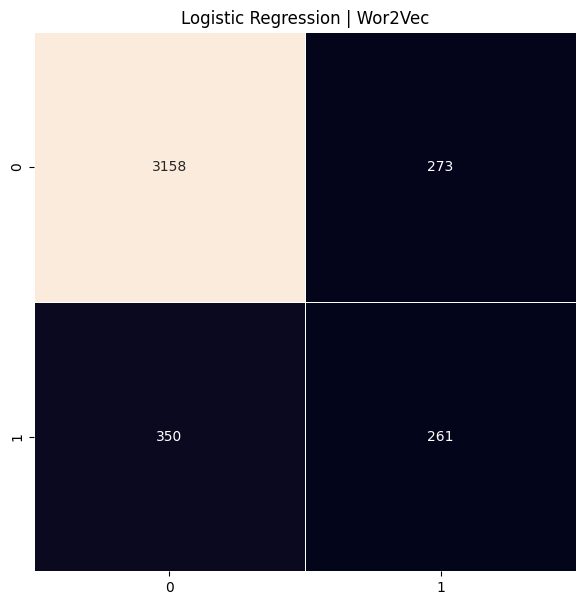

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, prediction_LR_int)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | Wor2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### [**2. Support Vector Machine**](#b2)

In [ ]:
from sklearn import svm


In [ ]:
from sklearn.svm import LinearSVC
l2_norm = 2
l2_norm_inverse = 1/l2_norm
maximum_iterations=4000
svm = LinearSVC(C=l2_norm_inverse,max_iter=maximum_iterations)
SVM=svm.fit(xtrain_w2v,y_train)

# predict the labels on validation dataset
predictions_SVM = SVM.predict(xvalid_w2v)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  85.9475507174666


In [ ]:
import numpy as np
from sklearn import svm
from sklearn.metrics import f1_score

svc = svm.SVC(kernel='linear', C=1, probability=True).fit(xtrain_w2v, ytrain)

prediction = svc.predict_proba(xvalid_w2v)
prediction_int = prediction[:, 1] >= 0.3
prediction_SVM_int = prediction_int.astype(int)
f1_score(yvalid_int, prediction_SVM_int)


0.5541941564561734

In [ ]:
f1_score(yvalid_int, prediction_SVM_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, prediction_SVM_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.8754414437120097

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_SVM_int))

              precision    recall  f1-score   support

           0       0.91      0.95      0.93      3431
           1       0.65      0.48      0.55       611

    accuracy                           0.88      4042
   macro avg       0.78      0.72      0.74      4042
weighted avg       0.87      0.88      0.88      4042



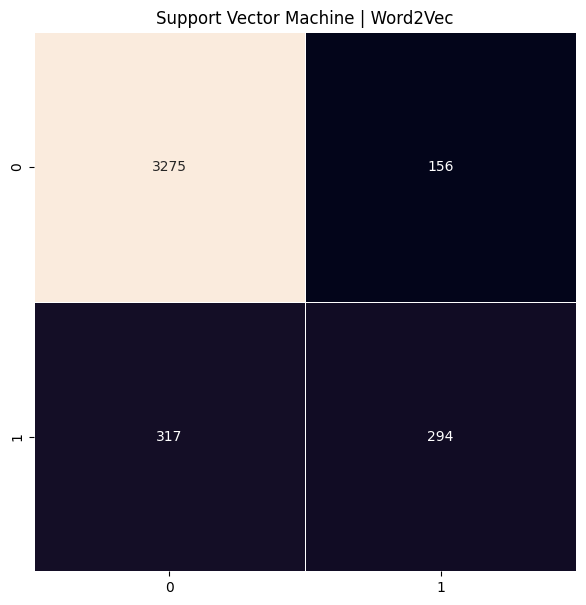

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, prediction_SVM_int)
plt.figure(figsize=(7,7))
plt.title("Support Vector Machine | Word2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### [**3. Decission tree**]($b2)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
tree_clf = DecisionTreeClassifier()
tree_clf.fit(xtrain_w2v, ytrain)
predictions_tree = tree_clf.predict(xvalid_w2v)
predictions_tree_int = [int(label) for label in predictions_tree]
yvalid_int = [int(label) for label in yvalid]
print("Decision Tree Accuracy Score -> ", accuracy_score(predictions_tree_int, yvalid_int) * 100)

Decision Tree Accuracy Score ->  80.72736269173676


In [ ]:
from sklearn.tree import DecisionTreeClassifier


In [ ]:
dt = DecisionTreeClassifier().fit(xtrain_w2v, ytrain)
yvalid_int = [int(label) for label in yvalid]
prediction_DT=  dt.predict(xvalid_w2v)
prediction_DT_int = [int(label) for label in prediction_DT]
f1_score(yvalid_int, prediction_DT_int)


0.3782894736842105

In [ ]:
f1_score(yvalid_int, prediction_DT_int, average='macro')       # Sınıflar eşit ağırlıklı
#f1_score(yvalid_int, prediction_DT_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.6341068801152561

In [ ]:
f1_score(yvalid_int, prediction_DT_int, average='weighted')

0.8125841404159856

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_DT_int))

              precision    recall  f1-score   support

           0       0.89      0.89      0.89      3431
           1       0.38      0.38      0.38       611

    accuracy                           0.81      4042
   macro avg       0.63      0.63      0.63      4042
weighted avg       0.81      0.81      0.81      4042



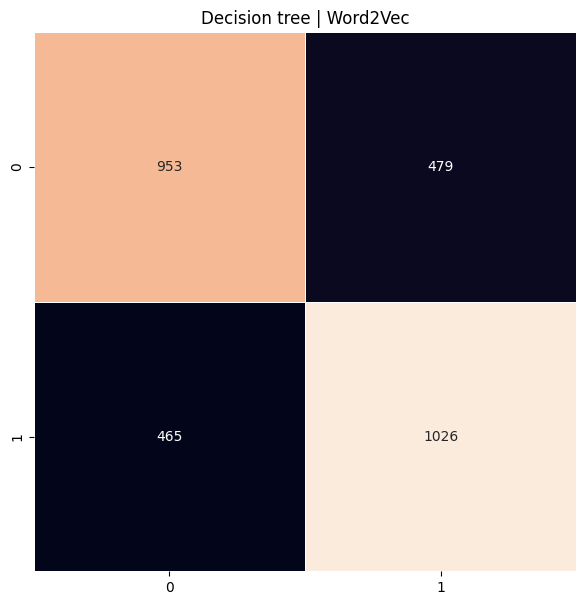

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, prediction_DT_int)
plt.figure(figsize=(7,7))
plt.title("Decision tree | Word2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### [NB](#b2)
Navie Bayes wordvec deki negatif değerlerden dolayı hata verdi

In [ ]:
#use ML algorithms classifier
#use a Naive Bayes Classifier and train the model on the training set.
"""from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(xtrain_w2v, ytrain)"""

'from sklearn.naive_bayes import MultinomialNB\nclf = MultinomialNB().fit(xtrain_w2v, ytrain)'

###### [Random Forest](#b2)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Random Forest sınıflandırıcısını tanımla
rf_clf = RandomForestClassifier()

# Modeli eğit
rf_clf.fit(xtrain_w2v, ytrain)

# Test verileri üzerinde tahmin yap
predictions_rf = rf_clf.predict(xvalid_w2v)
predictions_rf_int = [int(label) for label in predictions_rf]
yvalid_int = [int(label) for label in yvalid]
# Doğruluk skorunu hesapla ve yazdır
print("Random Forest Accuracy Score -> ", accuracy_score(predictions_rf_int, yvalid_int) * 100)


Random Forest Accuracy Score ->  86.49183572488866


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score

RF = RandomForestClassifier().fit(xtrain_w2v, ytrain)
yvalid_int = [int(label) for label in yvalid]
prediction_RF = RF.predict(xvalid_w2v)

# Bu satırda yanlışlık var — prediction_DT yanlış değişken
prediction_RF_int = [int(label) for label in prediction_RF]  # Doğrusu bu olmalı

f1_score(yvalid_int, prediction_RF_int)

0.3457382953181273

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_RF_int))

              precision    recall  f1-score   support

           0       0.88      0.98      0.92      3431
           1       0.65      0.24      0.35       611

    accuracy                           0.87      4042
   macro avg       0.76      0.61      0.64      4042
weighted avg       0.84      0.87      0.84      4042



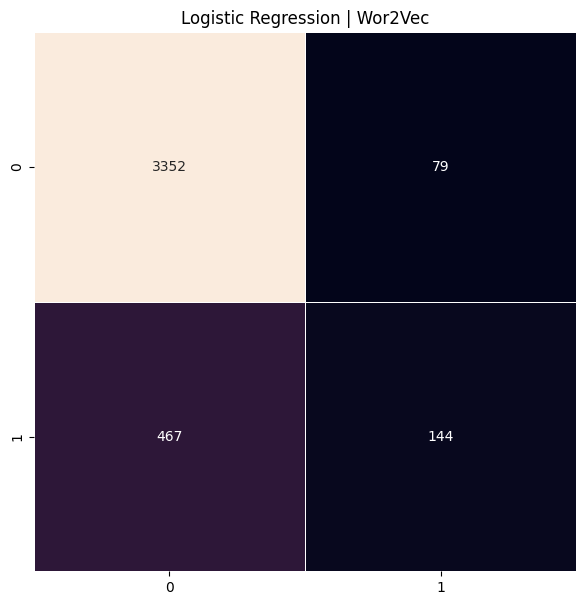

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, predictions_rf_int)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | Wor2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

In [ ]:
f1_score(yvalid_int, predictions_rf_int, average='macro')       # Sınıflar eşit ağırlıklı
  # Gerçek örnek sayısına göre ağırlıklı


0.635006698089804

In [ ]:
f1_score(yvalid_int, predictions_rf_int, average='weighted')

0.8371110867520899

* ## [LSTM](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [LOGISTIC REG](#log)


#####[Dosya en başta yüklenmemişse](#b2)

###### [Kütüphanelerin yüklenmesi](#p2)

In [ ]:
# importing required libraries
import pandas as pd
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import string
import nltk
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

%matplotlib inline

###### [Dosyanın yüklenmesin](#p2)

In [ ]:
import numpy as np
import pandas as pd
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

/kaggle/input/amazon-product-reviews/amazon.csv

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/BİL482/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[Errno 2] No such file or directory: '/content/drive/My Drive/BİL482/'
/content/drive/My Drive/Bil482


In [ ]:
train_df = pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

###### [Veri Setinin incelenmesi](#p2)

In [ ]:
train_df=df

In [ ]:
train_df.isnull().values.any()

False

In [ ]:
train_df.head()

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2,Comment
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0,"At Wipro, growth remains a mirage"
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0,Why Chinese stocks leave US investors vulnerable
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0,US stocks finish mixed amid more tech selling
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0,Opec reduces estimate on oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0,Immediate support for rupee is placed at 55.10: Bonanza


In [ ]:
train_df

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2,Text_prepro
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1.0,0,0.0,"wipro , growth remain mirag"
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1.0,0,0.0,chines stock leav us investor vulner
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1.0,0,0.0,us stock finish mix amid tech sell
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1.0,0,0.0,opec reduc estim oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1.0,0,0.0,immedi support rupe place bonanza
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","[""['negotiation', 'carry', 'constructive', 'manner', '', 'patch', 'tire', 'fund', 'solution', 'situation', '']""]",121,negotiations carried constructive manner parties tried find solution situation,negoti carri construct manner parti tri find solut situat,negotiation carried constructive manner party tried find solution situation,The negotiations were carried out in constructive manner and all parties tried to find solution to the situation,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","negoti carri construct manner , parti tri find solut situat",1.0,2,1.0,"negoti carri construct manner , parti tri find solut situat"
9738,Wockhardt story is really intriguing: Deven Choksey,"[""['hardtack', 'story', 'really', 'intrigue', 'seven', 'choke']""]",51,wockhardt story really intriguing deven choksey,wockhardt stori realli intrigu deven choksey,wockhardt story really intriguing deven choksey,Wockhardt story is really intriguing Deven Choksey,Wockhardt story is really intriguing: Deven Choksey,wockhardt stori realli intrigu deven choksey,1.0,2,1.0,wockhardt stori realli intrigu deven choksey
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .,"[""['Finnish', 'robe', 'own', 'get', 'family', 'frown', 'recently', 'acquisition', 'small', 'shipping', 'company', '']""]",123,finnish bore owned rettig family grown recently acquisition smaller shipping companies,finnish bore own rettig famili grown recent acquisit smaller ship compani,finnish bore owned rettig family grown recently acquisition smaller shipping company,Finnish Bore that is o

In [ ]:
train_df

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2,Text_prepro
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0,"wipro , growth remain mirag"
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0,chines stock leav us investor vulner
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0,us stock finish mix amid tech sell
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0,opec reduc estim oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0,immedi support rupe place bonanza
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","[""['negotiation', 'carry', 'constructive', 'manner', '', 'patch', 'tire', 'fund', 'solution', 'situation', '']""]",121,negotiations carried constructive manner parties tried find solution situation,negoti carri construct manner parti tri find solut situat,negotiation carried constructive manner party tried find solution situation,The negotiations were carried out in constructive manner and all parties tried to find solution to the situation,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","negoti carri construct manner , parti tri find solut situat",1,2,1,"negoti carri construct manner , parti tri find solut situat"
9738,Wockhardt story is really intriguing: Deven Choksey,"[""['hardtack', 'story', 'really', 'intrigue', 'seven', 'choke']""]",51,wockhardt story really intriguing deven choksey,wockhardt stori realli intrigu deven choksey,wockhardt story really intriguing deven choksey,Wockhardt story is really intriguing Deven Choksey,Wockhardt story is really intriguing: Deven Choksey,wockhardt stori realli intrigu deven choksey,1,2,1,wockhardt stori realli intrigu deven choksey
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .,"[""['Finnish', 'robe', 'own', 'get', 'family', 'frown', 'recently', 'acquisition', 'small', 'shipping', 'company', '']""]",123,finnish bore owned rettig family grown recently acquisition smaller shipping companies,finnish bore own rettig famili grown recent acquisit smaller ship compani,finnish bore owned rettig family grown recently acquisition smaller shipping company,Finnish Bore that is owned by the Rettig family ha

#####[Dosya en başta yüklenmişse burdan başla](#b2)

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
#ecilen_kolon_adi="hibrit"
#secilen_sentiment_kolon_adi="score2"

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(9741, 1)

In [ ]:
print(len(df))

9741


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data

,USAirPrePro2,score2
1,wipro growth remains mirage,0
2,chinese stock leave u investor vulnerable,0
3,u stock finish mixed amid tech selling,0
4,opec reduces estimate oil demand growth,0
5,immediate support rupee placed bonanza,0
...,...,...
9737,negotiation carried constructive manner party tried find solution situation,1
9738,wockhardt story really intriguing deven choksey,1
9739,finnish bore owned rettig family grown recently acquisition smaller shipping company,1
9740,operating profit eur mn eur mn,1


###### [Tokanize işlemleri](#p2)

In [ ]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
nltk.download('stopwords')
nltk.download('punkt')
stemmer = PorterStemmer()
def preprocess_text(text):
    text = text.lower()
    text = re.sub(r'[^\x00-\x7F]+', ' ', text)
    text = re.sub(r'(.)\1{2,}', '', text)
    text = re.sub(r'\.{2,}', ' ', text)
    text = re.sub(r'\b(\w+)\s+(\1\s+){2,}', r'\1 ', text)
    text = re.sub(r'[^a-zA-Z\s,\']', '', text)
    tokens = word_tokenize(text)
    stopwords_set = set(stopwords.words('english'))
    tokens = [stemmer.stem(word) for word in tokens if word not in stopwords_set]
    preprocessed_text = ' '.join(tokens)
    return preprocessed_text

def preprocess_text2(text):
    text = text.lower()
    text = re.sub(r'[^\x00-\x7F]+', ' ', text)
    text = re.sub(r'\.{2,}', ' ', text)
    text = re.sub(r'[^a-zA-Z\s,\']', '', text)
    tokens = word_tokenize(text)
    stopwords_set = set(stopwords.words('english'))
    tokens = [stemmer.stem(word) for word in tokens if word not in stopwords_set]
    return tokens
def preprocess_text3(text):

    tokens = word_tokenize(text)

    return tokens

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
preprocess_data=lambda text:preprocess_text(text)
data["Text_prepro"]=data[secilen_kolon_adi].apply(preprocess_data)

In [ ]:
tokenized_documents=[preprocess_text2(doc) for doc in X_df[secilen_kolon_adi]]

In [ ]:
X_df

,Text
1,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc
2,#NULL!
3,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.
4,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR"
5,@carolinesinders @herecomesfran *hugs*
...,...
13467,#mkr NOOOOO!!! I wanted Kat and Andre to lose!!!
13468,RT @MumtazCeltik: @WhiteHouse @VP \n\n#Kobane \n\n#JeSuisCharlie \n\n'Turkish military says MIT shipped weapons to al-Qaeda'\n@fehimtastekinÃ¢ÂÂºÃ¢ÂÂºhttpÃ¢ÂÂ¦
13469,Glad the proper competition is starting and even happier that Colin is back. #mkr
13470,"No worries Pete and Manu, take all the time off you need. In fact, feel free to fuck right off - I prefer Colin #mkr"


In [ ]:
#Ön işleme yapmayacaksak
tokenized_documents=[preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]

In [ ]:
len(tokenized_documents)

13471

In [ ]:
tokenized_documents[0]

['@',
 'AAlwuhaib1977',
 'Muslim',
 'mob',
 'violence',
 'against',
 'Hindus',
 'in',
 'Bangladesh',
 'continues',
 'in',
 '2014',
 '.',
 '#',
 'Islam',
 'http',
 ':',
 '//t.co/C1JBWJwuRc']

In [ ]:
from gensim.models import Word2Vec
ukuran_vektor=100
word2vec_model = Word2Vec(sentences=tokenized_documents,
                          min_count=1, vector_size=ukuran_vektor,sg=1)

In [ ]:
print(word2vec_model)

Word2Vec<vocab=24997, vector_size=100, alpha=0.025>


In [ ]:
all_words =word2vec_model.wv.index_to_key
print("50 kata pertama dalam model Word2Vec:")
for index, word in enumerate(all_words):
    if index < 50:
        print(f"{word} : {index}")
    else:
        break

50 kata pertama dalam model Word2Vec:
@ : 0
. : 1
# : 2
: : 3
the : 4
, : 5
to : 6
a : 7
I : 8
of : 9
is : 10
and : 11
that : 12
http : 13
you : 14
RT : 15
MKR : 16
! : 17
in : 18
? : 19
are : 20
mkr : 21
it : 22
's : 23
n't : 24
for : 25
not : 26
on : 27
do : 28
they : 29
have : 30
be : 31
this : 32
with : 33
Islam : 34
; : 35
'' : 36
`` : 37
was : 38
about : 39
The : 40
& : 41
i : 42
like : 43
all : 44
my : 45
'm : 46
just : 47
your : 48
Kat : 49


In [ ]:
max_length = X_df[secilen_kolon_adi].apply(lambda x: len(x.split())).max()

In [ ]:
max_length

34

In [ ]:
max_length_index = X_df[secilen_kolon_adi].apply(len).idxmax()
print("Index baris dengan max_length adalah :", max_length_index)

Index baris dengan max_length adalah : 2484


In [ ]:
X_df.at[max_length_index, secilen_kolon_adi]

'RT @0xabad1dea: Certain threads:\nÃ°Â\x9fÂ\x91Â¦ tech isnÃ¢Â\x80Â\x99t sexist\nÃ°Â\x9fÂ\x91Â§ yes it is\nÃ°Â\x9fÂ\x91Â¦ no it isnÃ¢Â\x80Â\x99t\nÃ°Â\x9fÂ\x91Â§Ã°Â\x9fÂ\x91Â§ yes it is\nÃ°Â\x9fÂ\x91Â¦ no it isnÃ¢Â\x80Â\x99t\nÃ°Â\x9fÂ\x91Â§Ã°Â\x9fÂ\x91Â§Ã°Â\x9fÂ\x91Â§ yes it is\nÃ°Â\x9fÂ\x91Â¦ no it isnÃ¢Â\x80Â\x99t\nÃ°Â\x9fÂ\x91Â§Ã°Â\x9fÂ\x91Â§Ã°Â\x9fÂ\x91Â§Ã°Â\x9fÂ\x91Â§ Ã¢Â\x80Â¦'

In [ ]:
X_df.at[max_length_index, secilen_kolon_adi]

'RT @0xabad1dea: Certain threads:\nÃ°Â\x9fÂ\x91Â¦ tech isnÃ¢Â\x80Â\x99t sexist\nÃ°Â\x9fÂ\x91Â§ yes it is\nÃ°Â\x9fÂ\x91Â¦ no it isnÃ¢Â\x80Â\x99t\nÃ°Â\x9fÂ\x91Â§Ã°Â\x9fÂ\x91Â§ yes it is\nÃ°Â\x9fÂ\x91Â¦ no it isnÃ¢Â\x80Â\x99t\nÃ°Â\x9fÂ\x91Â§Ã°Â\x9fÂ\x91Â§Ã°Â\x9fÂ\x91Â§ yes it is\nÃ°Â\x9fÂ\x91Â¦ no it isnÃ¢Â\x80Â\x99t\nÃ°Â\x9fÂ\x91Â§Ã°Â\x9fÂ\x91Â§Ã°Â\x9fÂ\x91Â§Ã°Â\x9fÂ\x91Â§ Ã¢Â\x80Â¦'

In [ ]:
sequences = [[word2vec_model.wv.key_to_index[word] for word in text]
             for text in [preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]]

In [ ]:
sequences = [
    [word2vec_model.wv.key_to_index[word] if word in word2vec_model.wv.key_to_index else None for word in text]
    for text in [preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]
]


In [ ]:
sequences = [
    [word2vec_model.wv.key_to_index[word] for word in text if word in word2vec_model.wv.key_to_index]
    for text in [preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]
]

# Pad sequences after removing None values
padded_sequences = pad_sequences(sequences, maxlen=max_length, padding='post')


NameError: name 'pad_sequences' is not defined

In [ ]:
len(sequences)

13471

In [ ]:
sequences[0]

[0,
 820,
 99,
 2108,
 559,
 161,
 709,
 18,
 4155,
 2154,
 18,
 2350,
 1,
 2,
 34,
 13,
 3,
 14899]

In [ ]:
from keras.preprocessing.sequence import pad_sequences
padded_sequences = pad_sequences(sequences, maxlen=max_length, padding='post')

In [ ]:
padded_sequences.shape

(13471, 34)

In [ ]:
y = np.asarray(df[secilen_sentiment_kolon_adi])

In [ ]:
jumlah_kelas=len(df[secilen_sentiment_kolon_adi].unique())

In [ ]:
jumlah_kelas

2

In [ ]:
y

array(['1', '0', '1', ..., '0', '0', '0'], dtype=object)

In [ ]:
padded_sequences

array([[    0,   820,    99, ...,     0,     0,     0],
       [    2, 14898,    17, ...,     0,     0,     0],
       [    0,  1275,     0, ...,     0,     0,     0],
       ...,
       [ 1795,     4,  4731, ...,     0,     0,     0],
       [  122,  2816,   330, ...,     0,     0,     0],
       [    0,   130,     2, ...,     0,     0,     0]], dtype=int32)

###### [Test_train ayrımı ve embeding yapma](#p2)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(padded_sequences, y,
                                            test_size=0.3,
                                            random_state=42, stratify=y)

In [ ]:
embedding_matrix = np.zeros((len(word2vec_model.wv.key_to_index) + 1, word2vec_model.vector_size))
for word, i in word2vec_model.wv.key_to_index.items():
    embedding_vector = word2vec_model.wv[word]
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

###### [Model Oluşturma ve çalıştırma](#p2)

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input,Embedding,GlobalMaxPooling1D
model = Sequential()
model.add(Input(shape=(max_length,)))
model.add(Embedding(input_dim=embedding_matrix.shape[0], output_dim=embedding_matrix.shape[1],
                  trainable=False))
model.add(LSTM(ukuran_vektor, return_sequences=True))
model.add(GlobalMaxPooling1D())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(jumlah_kelas, activation='softmax'))

In [ ]:
# 0 ve 1 output varsa
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input, Embedding, GlobalMaxPooling1D

model = Sequential()
model.add(Input(shape=(max_length,)))  # Giriş katmanı
model.add(Embedding(input_dim=embedding_matrix.shape[0], output_dim=embedding_matrix.shape[1], trainable=False))  # Embedding katmanı
model.add(LSTM(ukuran_vektor, return_sequences=True))  # LSTM katmanı
model.add(GlobalMaxPooling1D())  # GlobalMaxPooling1D katmanı
model.add(Dense(128, activation='relu'))  # Dense katmanı
model.add(Dropout(0.2))  # Dropout katmanı
model.add(Dense(1, activation='sigmoid'))  # Çıkış katmanı: 1 nöron, sigmoid aktivasyon

# Modelin derlenmesi
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
y_train_int=[int(label) for label in y_train]
y_val_int=[int(label) for label in y_val]

In [ ]:
from keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0001)
model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
from keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

In [ ]:
history = model.fit(X_train, y_train, epochs=500, batch_size=256,
                    validation_data=(X_val, y_val), callbacks=[early_stopping])

Epoch 1/500


InvalidArgumentError: Graph execution error:

Detected at node compile_loss/sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/SparseSoftmaxCrossEntropyWithLogits defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "/usr/local/lib/python3.11/dist-packages/colab_kernel_launcher.py", line 37, in <module>

  File "/usr/local/lib/python3.11/dist-packages/traitlets/config/application.py", line 992, in launch_instance

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelapp.py", line 712, in start

  File "/usr/local/lib/python3.11/dist-packages/tornado/platform/asyncio.py", line 205, in start

  File "/usr/lib/python3.11/asyncio/base_events.py", line 608, in run_forever

  File "/usr/lib/python3.11/asyncio/base_events.py", line 1936, in _run_once

  File "/usr/lib/python3.11/asyncio/events.py", line 84, in _run

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 510, in dispatch_queue

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 499, in process_one

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 406, in dispatch_shell

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 730, in execute_request

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py", line 383, in do_execute

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/zmqshell.py", line 528, in run_cell

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 2975, in run_cell

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3030, in _run_cell

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/async_helpers.py", line 78, in _pseudo_sync_runner

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3257, in run_cell_async

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3473, in run_ast_nodes

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code

  File "<ipython-input-219-5073228405bd>", line 1, in <cell line: 0>

  File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 371, in fit

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 219, in function

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 132, in multi_step_on_iterator

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 113, in one_step_on_data

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 60, in train_step

  File "/usr/local/lib/python3.11/dist-packages/keras/src/trainers/trainer.py", line 383, in _compute_loss

  File "/usr/local/lib/python3.11/dist-packages/keras/src/trainers/trainer.py", line 351, in compute_loss

  File "/usr/local/lib/python3.11/dist-packages/keras/src/trainers/compile_utils.py", line 691, in __call__

  File "/usr/local/lib/python3.11/dist-packages/keras/src/trainers/compile_utils.py", line 700, in call

  File "/usr/local/lib/python3.11/dist-packages/keras/src/losses/loss.py", line 67, in __call__

  File "/usr/local/lib/python3.11/dist-packages/keras/src/losses/losses.py", line 33, in call

  File "/usr/local/lib/python3.11/dist-packages/keras/src/losses/losses.py", line 2246, in sparse_categorical_crossentropy

  File "/usr/local/lib/python3.11/dist-packages/keras/src/ops/nn.py", line 1963, in sparse_categorical_crossentropy

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/nn.py", line 744, in sparse_categorical_crossentropy

Received a label value of 1 which is outside the valid range of [0, 1).  Label values: 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 1 0 1 0 0 0 0 1 1 0 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1
	 [[{{node compile_loss/sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/SparseSoftmaxCrossEntropyWithLogits}}]] [Op:__inference_multi_step_on_iterator_2748]

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input, Embedding, GlobalMaxPooling1D

model = Sequential()
model.add(Input(shape=(max_length,)))  # Giriş katmanı
model.add(Embedding(input_dim=embedding_matrix.shape[0], output_dim=embedding_matrix.shape[1], trainable=False))  # Embedding katmanı
model.add(LSTM(ukuran_vektor, return_sequences=True))  # LSTM katmanı
model.add(GlobalMaxPooling1D())  # GlobalMaxPooling1D katmanı
model.add(Dense(128, activation='relu'))  # Dense katmanı
model.add(Dropout(0.2))  # Dropout katmanı
model.add(Dense(1, activation='sigmoid'))  # Çıkış katmanı: 1 nöron, sigmoid aktivasyon

# Modelin derlenmesi
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

# Etiketlerinizi sayısal değerlere dönüştürün
y_train = label_encoder.fit_transform(y_train)
y_val = label_encoder.transform(y_val)


In [ ]:
y_val.shape

(4042,)

In [ ]:
y_train.shape

(9429,)

In [ ]:
history = model.fit(X_train, y_train, epochs=100, batch_size=256,
                    validation_data=(X_val, y_val), callbacks=[early_stopping])


Epoch 1/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 11s 236ms/step - accuracy: 0.8091 - loss: 0.5575 - val_accuracy: 0.8538 - val_loss: 0.4064
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - accuracy: 0.8486 - loss: 0.4046 - val_accuracy: 0.8538 - val_loss: 0.3620
Epoch 3/100


In [ ]:
loss, accuracy = model.evaluate(X_val, y_val, verbose=0)
print(f'Test Accuracy: {accuracy*100:.2f}%')

Test Accuracy: 77.08%


In [ ]:
from sklearn.metrics import classification_report
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
report = classification_report(y_val, y_pred_classes)
print("Classification Report:")
print(report)

92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.49      1.00      0.65      1423
           1       0.00      0.00      0.00      1500

    accuracy                           0.49      2923
   macro avg       0.24      0.50      0.33      2923
weighted avg       0.24      0.49      0.32      2923



In [ ]:
print("Konfigurasi Lapisan Embedding:")
print(model.layers[0].get_config())

Konfigurasi Lapisan Embedding:
{'name': 'embedding_5', 'trainable': False, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None}, 'input_dim': 9812, 'output_dim': 100, 'embeddings_initializer': {'module': 'keras.initializers', 'class_name': 'RandomUniform', 'config': {'seed': None, 'minval': -0.05, 'maxval': 0.05}, 'registered_name': None}, 'embeddings_regularizer': None, 'activity_regularizer': None, 'embeddings_constraint': None, 'mask_zero': False}


In [ ]:
print("Bobot Lapisan Embedding:")
print(model.layers[0].get_weights()[0])

Bobot Lapisan Embedding:
[[-0.04519786  0.00506743  0.04164286 ...  0.04010054 -0.00221134
   0.00623528]
 [-0.00735713  0.0218625  -0.03816529 ... -0.00974482 -0.0122553
   0.04100901]
 [-0.02643167 -0.00945206 -0.00791474 ... -0.0068404  -0.03539057
  -0.02666515]
 ...
 [-0.01960655  0.04041782 -0.02229015 ... -0.04667262  0.04667972
  -0.00404646]
 [-0.02550494  0.04417685  0.02810412 ... -0.02909876  0.04002215
  -0.01307654]
 [ 0.00185049  0.03814306 -0.03833202 ... -0.01929575  0.04256621
  -0.00403254]]


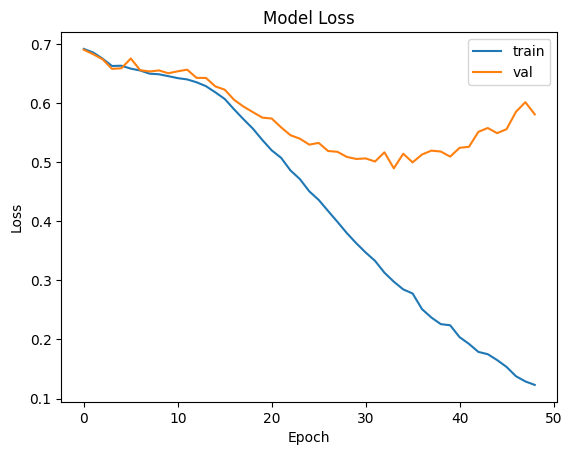

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

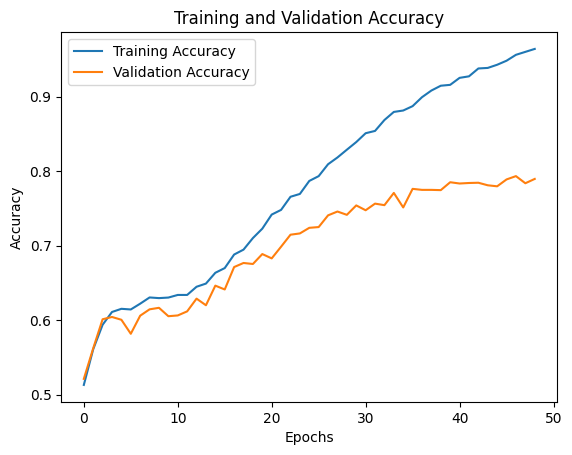

In [ ]:
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
plt.plot(accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_2 (Embedding)         │ (None, 53, 100)        │     1,079,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 53, 100)        │        80,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling1d_2          │ (None, 100)            │             0 │
│ (GlobalMaxPooling1D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        12,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,359,473 (5.19 MB)

 Trainable params: 93,457 (365.07 KB)

 Non-trainable params: 1,079,100 (4.12 MB)

 Optimizer params: 186,916 (730.14 KB)

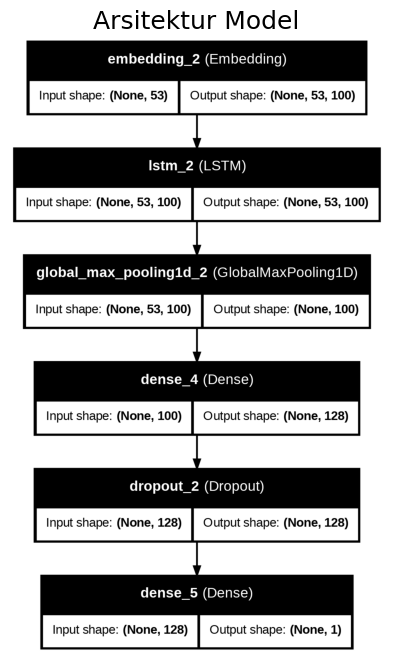

In [ ]:
from keras.utils import plot_model
file_name = 'arsitektur_model.png'
plot_model(model, to_file=file_name, show_shapes=True, show_layer_names=True)
plt.figure(figsize=(8,8))
img = plt.imread(file_name)
plt.imshow(img)
plt.title('Arsitektur Model', fontsize=18)
plt.axis('off')
plt.savefig(file_name)
plt.show()

In [ ]:
from sklearn.metrics import classification_report
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
report = classification_report(y_val, y_pred_classes)
print("Classification Report:")
print(report)

92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.49      1.00      0.65      1423
           1       0.00      0.00      0.00      1500

    accuracy                           0.49      2923
   macro avg       0.24      0.50      0.33      2923
weighted avg       0.24      0.49      0.32      2923



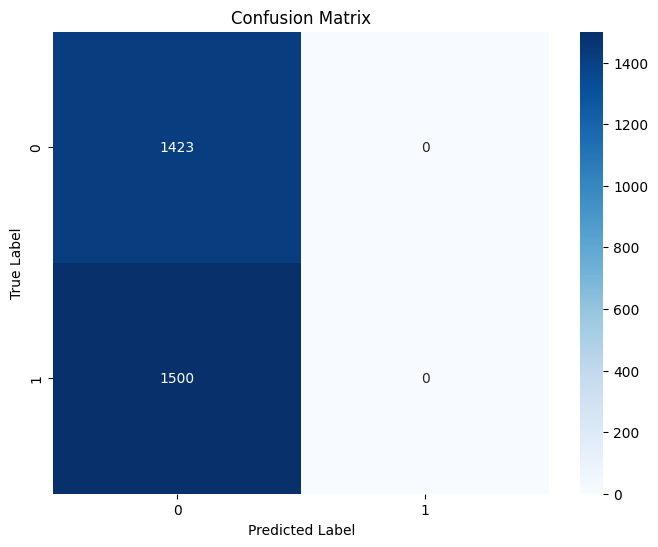

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
cm = confusion_matrix(y_val, y_pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
model.save("model_Amazon_Product_Reviews.h5")
word2vec_model.save("word2vec_model.model")
train_df.to_csv("train_data.csv", index=False)

###### [Denemeler 0 ın öğrenmesi o geldiği için yapıldı](#b2)

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weights_dict = {i : class_weights[i] for i in range(len(class_weights))}

model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=50, class_weight=class_weights_dict)


Epoch 1/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - accuracy: 0.8543 - loss: 0.3336 - val_accuracy: 0.7756 - val_loss: 0.4651
Epoch 2/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - accuracy: 0.8863 - loss: 0.2743 - val_accuracy: 0.7680 - val_loss: 0.5310
Epoch 3/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step - accuracy: 0.9294 - loss: 0.2049 - val_accuracy: 0.7889 - val_loss: 0.4667
Epoch 4/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step - accuracy: 0.9353 - loss: 0.1925 - val_accuracy: 0.7886 - val_loss: 0.5145
Epoch 5/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step - accuracy: 0.9554 - loss: 0.1389 - val_accuracy: 0.7927 - val_loss: 0.5285
Epoch 6/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step - accuracy: 0.9706 - loss: 0.1073 - val_accuracy: 0.8050 - val_loss: 0.5483
Epoch 7/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9819 - loss: 0.0785 - val_accuracy: 0.7978 - val_loss: 0.5897
Epoch 8/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step - accuracy: 0.9856 - loss: 0.0622 - 

In [ ]:
loss, accuracy = model.evaluate(X_val, y_val, verbose=0)
print(f'Test Accuracy: {accuracy*100:.2f}%')


Test Accuracy: 80.19%


In [ ]:
from sklearn.metrics import classification_report
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
report = classification_report(y_val, y_pred_classes)
print("Classification Report:")
print(report)

92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.49      1.00      0.65      1423
           1       0.00      0.00      0.00      1500

    accuracy                           0.49      2923
   macro avg       0.24      0.50      0.33      2923
weighted avg       0.24      0.49      0.32      2923



In [ ]:
import numpy as np

y_pred_probs = model.predict(X_val)
print("Tahmin ortalaması:", np.mean(y_pred_probs))
print("0.5'ten büyük kaç tane tahmin var:", np.sum(y_pred_probs > 0.5))


92/92 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step
Tahmin ortalaması: 0.5227914
0.5'ten büyük kaç tane tahmin var: 1535


In [ ]:
print(np.unique(y_train))  # [0 1] olmalı
print(y_train[:10])        # Sayılar olmalı, liste değil


[0 1]
[0 1 0 1 1 1 1 1 1 0]


In [ ]:
print(embedding_matrix.shape)
# input_dim=embedding_matrix.shape[0] ile tokenizer.num_words eşleşiyor mu?


(10791, 100)


In [ ]:
print(X_train.shape, y_train.shape)


(6818, 53) (6818,)


In [ ]:
print("Etiket tipi:", y_train.dtype)
print("Eşsiz etiketler:", np.unique(y_train))


Etiket tipi: int64
Eşsiz etiketler: [0 1]


In [ ]:
y_pred_probs = model.predict(X_val)
print("Tahmin ortalaması:", np.mean(y_pred_probs))
print("0.5 üstü kaç tane:", np.sum(y_pred_probs > 0.5))


92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step
Tahmin ortalaması: 0.5227914
0.5 üstü kaç tane: 1535


# [2. Hibrit sütununa göre](#b1)

* ## [Kütüphanelerin Yüklenmesi ve Veri Seti İşlemleri](#b1)

###### [1.Kütüphaneler yüklenmesi](#b1)

In [ ]:
# Gerekli kütüphaneleri belirtilen versiyonlarda kur
!pip install --upgrade --no-cache-dir numpy==1.26.4 scipy==1.13.1 gensim==4.3.3 pandas==2.2.2 tensorflow==2.18.0 tensorflow-text==2.18.1 tf-keras==2.18.0 tensorflow-decision-forests==1.11.0


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.stem.porter import *
nltk.download('gutenberg')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
nltk.download('punkt_tab')

from nltk.tokenize import TweetTokenizer
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import datetime

from scipy import stats
from scipy.sparse import hstack, csr_matrix
from sklearn.model_selection import train_test_split, cross_val_score

from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams

import string
import gensim
from gensim.models.phrases import Phraser, Phrases
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
pd.set_option('max_colwidth',400)
from bs4 import BeautifulSoup
import re

from tqdm import tqdm
from bokeh.io import output_notebook, output_file
from bokeh.plotting import show, figure
%matplotlib inline
from collections import defaultdict

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Unzipping corpora/gutenberg.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


In [ ]:
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")

In [ ]:
# Gerekli kütüphaneler
from keras.utils import to_categorical
import random
from sklearn.model_selection import train_test_split
from keras.preprocessing import sequence
from tensorflow.keras.preprocessing.text import Tokenizer

#from keras.preprocessing.text import Tokenizer
from keras.layers import Dense, Dropout, Embedding, LSTM
from keras.callbacks import EarlyStopping
from keras.losses import categorical_crossentropy
from keras.optimizers import Adam
from keras.models import Sequential


In [ ]:
"""from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM
from tensorflow.keras.callbacks import EarlyStopping"""


'from tensorflow.keras.preprocessing.text import Tokenizer\nfrom tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM\nfrom tensorflow.keras.callbacks import EarlyStopping'

In [ ]:
import tensorflow as tf
print(tf.__version__)


2.18.0


######[Dosyanın Yüklenmesi ve veri setinin incelenmesi](#b1)

In [ ]:
warnings.filterwarnings('ignore')
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Bitirme/Datasets/
#df=pd.read_csv("Loan.csv",index_col=0)


""" # Yeni Bir dosya kaydetme koddunu buraya yazıyoruz
PreprocessedSon2_df_file_path = '/content/drive/My Drive/Bitirme/Datasets/PreprocessedSon2_df.csv'
df.to_csv(PreprocessedSon2_df_file_path, index=False)"""


Mounted at /content/drive
/content/drive/My Drive/Bitirme/Datasets


" # Yeni Bir dosya kaydetme koddunu buraya yazıyoruz\nPreprocessedSon2_df_file_path = '/content/drive/My Drive/Bitirme/Datasets/PreprocessedSon2_df.csv'\ndf.to_csv(PreprocessedSon2_df_file_path, index=False)"

In [ ]:
"""
Kaggle API ile yükleme
import numpy as np
import pandas as pd
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'"""

"\nKaggle API ile yükleme\nimport numpy as np\nimport pandas as pd\nimport os\nfor dirname, _, filenames in os.walk('/kaggle/input'):\n    for filename in filenames:\n        print(os.path.join(dirname, filename))\nos.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'"

In [ ]:
# Veri setini yükle
file_path = '/content/drive/My Drive/Bert/USAir_df.csv'
file_path2 = '/content/drive/My Drive/Bert/USAir_balanced_df.csv'
file_path3 = '/content/drive/My Drive/Bitirme/Datasets/twitter_racism_parsed_dataset.csv'
file_path4 = '/content/drive/My Drive/Bitirme/Datasets/PreprocessedSon3_2output_df.csv'
file_path5 = '/content/drive/My Drive/Bitirme/Datasets/Racism_PreprocessedSon_df.csv'

df = pd.read_csv(file_path5, encoding='latin1', header=None)
#df = pd.read_csv(file_path5, index_col=0)
#df = pd.read_csv(file_path4, index_col=0)

# Sütun isimlerini belirle
#df.columns = ['index', 'id','Text','label','score']
df.columns=['Text','label','score', 'hibrit', 'USAirPrePro', 'USAirPrePro2', 'USAirPrePro3','MuammerNLPPrePRro', 'MuammerNLPPrePRro2', 'MuammerNLPPrePRro3', 'MuammerNLPLSTMPrePRro']

# İlk sütunu kontrol edelim
print("Sütun isimleri:", df.columns)

Sütun isimleri: Index(['Text', 'label', 'score', 'hibrit', 'USAirPrePro', 'USAirPrePro2',
       'USAirPrePro3', 'MuammerNLPPrePRro', 'MuammerNLPPrePRro2',
       'MuammerNLPPrePRro3', 'MuammerNLPLSTMPrePRro'],
      dtype='object')


In [ ]:
#df4=pd.read_csv("PreprocessedSon3_df.csv",index_col=0)

In [ ]:
#df3=pd.read_csv("IMDB_df.csv",index_col=0)

In [ ]:
#df2=pd.read_csv("USAir_balanced_df.csv",index_col=0)

In [ ]:
df

,Text,label,score,hibrit,USAirPrePro,USAirPrePro2,USAirPrePro3,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPPrePRro3,MuammerNLPLSTMPrePRro
0,Text,label,score,hibrit,USAirPrePro,USAirPrePro2,USAirPrePro3,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPPrePRro3,MuammerNLPLSTMPrePRro
1,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc,racism,1,aalwuhaib muslim mob violence hindus bangladesh continues islam http co jbwjwurc,aalwuhaib muslim mob violenc hindu bangladesh continu islam,aalwuhaib muslim mob violence hindu bangladesh continues islam,aalwuhaib muslim mob violenc hindu bangladesh continu islam,AAlwuhaib Muslim mob violence against Hindus in Bangladesh continues in Islam http co JBWJwuRc,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc,AAlwuhaib Muslim mob violence against Hindus in Bangladesh continues in Islam http co JBWJwuRc,aalwuhaib muslim mob violenc hindu bangladesh continu islam httptcocjbwjwurc
2,#NULL!,none,0,null,NaN,NaN,NaN,NULL,#NULL!,NULL,NaN
3,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.,racism,1,jncatron isra jourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed,jncatron israjourisra ampalestin islamophobia like idea naziphobia islam religion hate must outlaw,jncatron israjourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed,jncatron israjourisra ampalestin islamophobia like idea naziphobia islam religion hate must outlaw,jncatron isra jourisra AMPalestine Islamophobia is like the idea of Naziphobia Islam is religion of hate and it must be outlawed,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.,jncatron isra jourisra AMPalestine Islamophobia is like the idea of Naziphobia Islam is religion of hate and it must be outlawed,jncatron israjourisra ampalestin islamophobia like idea naziphobia islam religion hate must outlaw
4,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR",none,0,finally caught sudden death cook looks like gonna intense mkr,final im caught sudden death cook look like gon na intens mkr,finally caught sudden death cook look like going intense mkr,final caught sudden death cook look like gon na intens mkr,Finally m all caught up and that sudden death cook off looks like it gonna be intense MKR,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR",Finally m all caught up and that sudden death cook off looks like it gonna be intense MKR,"final 'm caught , sudden death cook look like 's gon na intens mkr"
...,...,...,...,...,...,...,...,...,...,...,...
13467,#mkr NOOOOO!!! I wanted Kat and Andre to lose!!!,none,0,mkr nooooo wanted kat andre lose,mkr nooooo want kat andr lose,mkr nooooo wanted kat andre lose,mkr nooooo want kat andr lose,mkr NOOOOO wanted Kat and Andre to lose,#mkr NOOOOO!!! I wanted Kat and Andre to lose!!!,mkr NOOOOO wanted Kat and Andre to lose,mkr n want kat andr lose
13468,RT @MumtazCeltik: @WhiteHouse @VP \n\n#Kobane \n\n#JeSuisCharlie \n\n'Turkish military says MIT shipped weapons to al-Qaeda'\n@fehimtastekinÃ¢ÂÂºÃ¢ÂÂºhttpÃ¢ÂÂ¦,none,0,rt mumtazceltik whitehouse vp kobane jesuischarlie turkish military says mit shipped weapons al qaeda fehimtastekin http,rt mumtazceltik whitehous vp koban jesuischarli turkish militari say mit ship weapon alqaeda fehimtastekinhttp,rt mumtazceltik whitehouse vp kobane jesuischarlie turkish military say mit shipped weapon alqaeda fehimtastekinhttp,rt mumtazceltik whitehous vp koban jesuischarli turkish militari say mit ship weapon alqaeda fehimtastekinhttp,RT MumtazCeltik WhiteHouse VP Kobane JeSuisCharlie Turkish military says MIT shipped weapons to al Qaeda fehimtastekin http,RT @

In [ ]:
df['score'] = pd.to_numeric(df['score'], errors='coerce')


In [ ]:
#Burda -1 olanlar 0 yapıldı 1 olanlar kaldı
df['score2'] = df['score'].apply(lambda x: x + 1 if x == -1 else x)

In [ ]:
df['score']

,score
0,NaN
1,1.0
2,0.0
3,1.0
4,0.0
...,...
13467,0.0
13468,0.0
13469,0.0
13470,0.0


In [ ]:
df['score2']

KeyError: 'score2'

In [ ]:
#df = df.drop(df.index[0])
df.head()

,Text,label,score,hibrit,USAirPrePro,USAirPrePro2,USAirPrePro3,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPPrePRro3,MuammerNLPLSTMPrePRro
1,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc,racism,1.0,aalwuhaib muslim mob violence hindus bangladesh continues islam http co jbwjwurc,aalwuhaib muslim mob violenc hindu bangladesh continu islam,aalwuhaib muslim mob violence hindu bangladesh continues islam,aalwuhaib muslim mob violenc hindu bangladesh continu islam,AAlwuhaib Muslim mob violence against Hindus in Bangladesh continues in Islam http co JBWJwuRc,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc,AAlwuhaib Muslim mob violence against Hindus in Bangladesh continues in Islam http co JBWJwuRc,aalwuhaib muslim mob violenc hindu bangladesh continu islam httptcocjbwjwurc
2,#NULL!,none,0.0,null,NaN,NaN,NaN,NULL,#NULL!,NULL,NaN
3,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.,racism,1.0,jncatron isra jourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed,jncatron israjourisra ampalestin islamophobia like idea naziphobia islam religion hate must outlaw,jncatron israjourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed,jncatron israjourisra ampalestin islamophobia like idea naziphobia islam religion hate must outlaw,jncatron isra jourisra AMPalestine Islamophobia is like the idea of Naziphobia Islam is religion of hate and it must be outlawed,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.,jncatron isra jourisra AMPalestine Islamophobia is like the idea of Naziphobia Islam is religion of hate and it must be outlawed,jncatron israjourisra ampalestin islamophobia like idea naziphobia islam religion hate must outlaw
4,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR",none,0.0,finally caught sudden death cook looks like gonna intense mkr,final im caught sudden death cook look like gon na intens mkr,finally caught sudden death cook look like going intense mkr,final caught sudden death cook look like gon na intens mkr,Finally m all caught up and that sudden death cook off looks like it gonna be intense MKR,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR",Finally m all caught up and that sudden death cook off looks like it gonna be intense MKR,"final 'm caught , sudden death cook look like 's gon na intens mkr"
5,@carolinesinders @herecomesfran *hugs*,none,0.0,carolinesinders herecomesfran hugs,carolinesind herecomesfran hug,carolinesinders herecomesfran hug,carolinesind herecomesfran hug,carolinesinders herecomesfran hugs,@carolinesinders @herecomesfran *hugs*,carolinesinders herecomesfran hugs,carolinesind herecomesfran hug


In [ ]:
#df2 = df2.reset_index()

In [ ]:
#gerekmezse çalıştırma
"""df = df.reset_index()
df.isnull().values.any()

df.head()"""

,index,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label
0,1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0
1,2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0
2,3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0
3,4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0
4,5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0


In [ ]:
df.columns

Index(['Text', 'label', 'score', 'hibrit', 'USAirPrePro', 'USAirPrePro2',
       'USAirPrePro3', 'MuammerNLPPrePRro', 'MuammerNLPPrePRro2',
       'MuammerNLPPrePRro3', 'MuammerNLPLSTMPrePRro'],
      dtype='object')

In [ ]:
#df = df.drop(columns=['index'])


In [ ]:
df.shape

(13471, 11)

In [ ]:
print(len(df))

13471


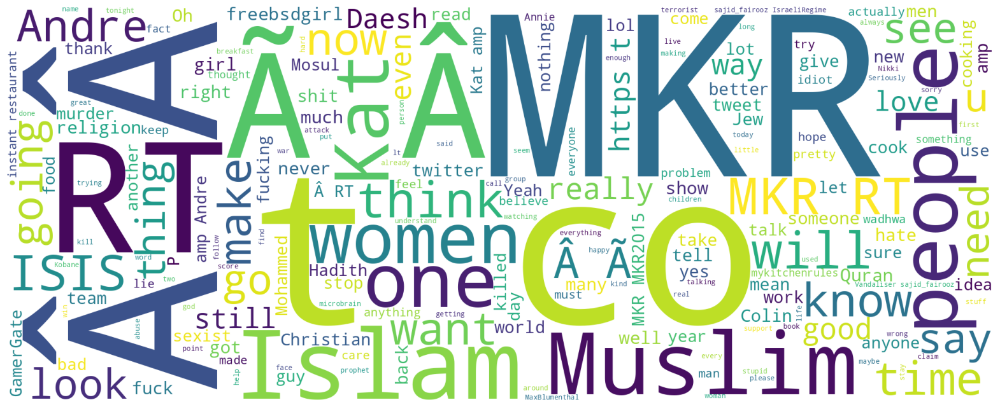

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in df.Text)
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

###### [Veri setinden kullanılacak sütun seçilmesi](#b1)

In [ ]:
df.columns

Index(['Text', 'label', 'score', 'hibrit', 'USAirPrePro', 'USAirPrePro2',
       'USAirPrePro3', 'MuammerNLPPrePRro', 'MuammerNLPPrePRro2',
       'MuammerNLPPrePRro3', 'MuammerNLPLSTMPrePRro'],
      dtype='object')

In [ ]:
#Kullanıacak kolon adi girin sonra çalıştırın. Yukarıdaki kolon isimlerinden seç
#secilen_kolon_adi='USAirPrePro2'
secilen_sentiment_kolon_adi='score'
#secilen_kolon_adi='hibrit'
secilen_kolon_adi='hibrit'

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(13471, 1)

In [ ]:
print(len(df))

13471


In [ ]:
data=df[[secilen_kolon_adi,secilen_sentiment_kolon_adi]]
data=data.reset_index(drop=True)

In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data.head()

,hibrit,score
1,aalwuhaib muslim mob violence hindus bangladesh continues islam http co jbwjwurc,1.0
2,null,0.0
3,jncatron isra jourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed,1.0
4,finally caught sudden death cook looks like gonna intense mkr,0.0
5,carolinesinders herecomesfran hugs,0.0


In [ ]:
X_df.head()

,hibrit
1,aalwuhaib muslim mob violence hindus bangladesh continues islam http co jbwjwurc
2,null
3,jncatron isra jourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed
4,finally caught sudden death cook looks like gonna intense mkr
5,carolinesinders herecomesfran hugs


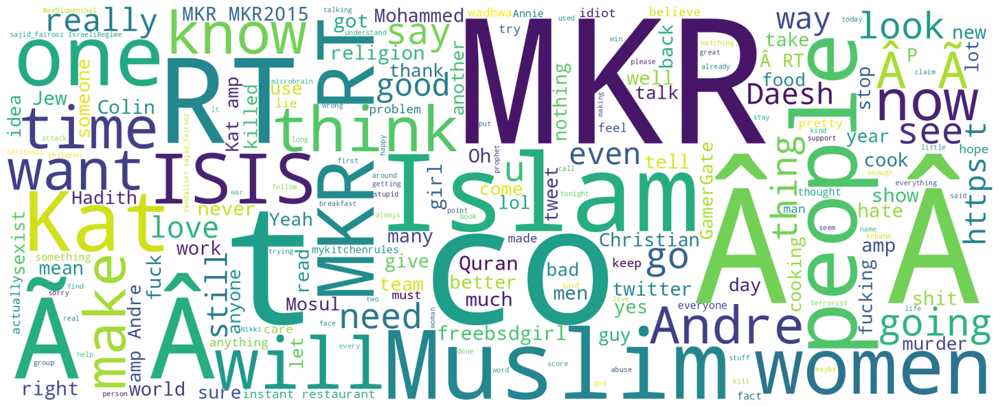

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in df['Text'])
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

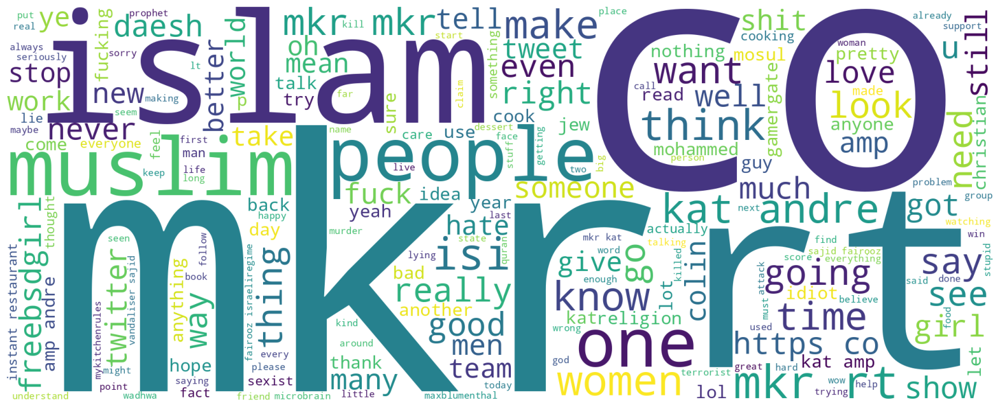

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in x_liste)
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

###### [x ve y değerlerinin belirlenmesi ve train tesst ayrımı](#b1)

In [ ]:
"""secilen_kolon_adi='USAirPrePro2'
secilen_sentiment_kolon_adi='score2'"""

In [ ]:
x = df[secilen_kolon_adi]
x

,hibrit
1,aalwuhaib muslim mob violence hindus bangladesh continues islam http co jbwjwurc
2,null
3,jncatron isra jourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed
4,finally caught sudden death cook looks like gonna intense mkr
5,carolinesinders herecomesfran hugs
...,...
13467,mkr nooooo wanted kat andre lose
13468,rt mumtazceltik whitehouse vp kobane jesuischarlie turkish military says mit shipped weapons al qaeda fehimtastekin http
13469,glad proper competition starting even happier colin back mkr
13470,worries pete manu take time need fact feel free fuck right prefer colin mkr


In [ ]:
y = df[secilen_sentiment_kolon_adi]
y

,score
1,1.0
2,0.0
3,1.0
4,0.0
5,0.0
...,...
13467,0.0
13468,0.0
13469,0.0
13470,0.0


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
x

,hibrit
1,aalwuhaib muslim mob violence hindus bangladesh continues islam http co jbwjwurc
2,null
3,jncatron isra jourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed
4,finally caught sudden death cook looks like gonna intense mkr
5,carolinesinders herecomesfran hugs
...,...
13467,mkr nooooo wanted kat andre lose
13468,rt mumtazceltik whitehouse vp kobane jesuischarlie turkish military says mit shipped weapons al qaeda fehimtastekin http
13469,glad proper competition starting even happier colin back mkr
13470,worries pete manu take time need fact feel free fuck right prefer colin mkr


####  [keşifsel veri analizi için deneme](#b1)


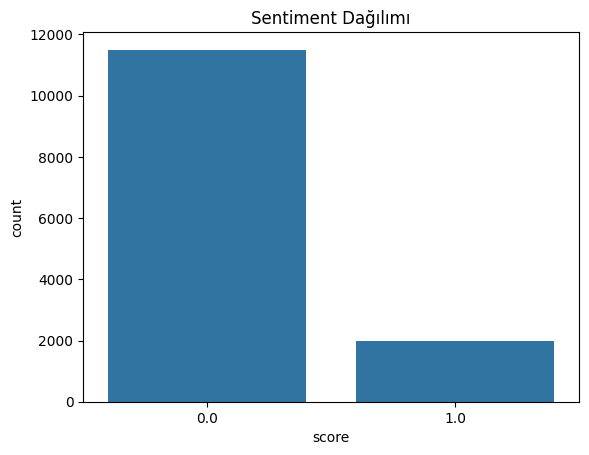

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.countplot(x='score', data=df)
plt.title("Sentiment Dağılımı")
plt.show()

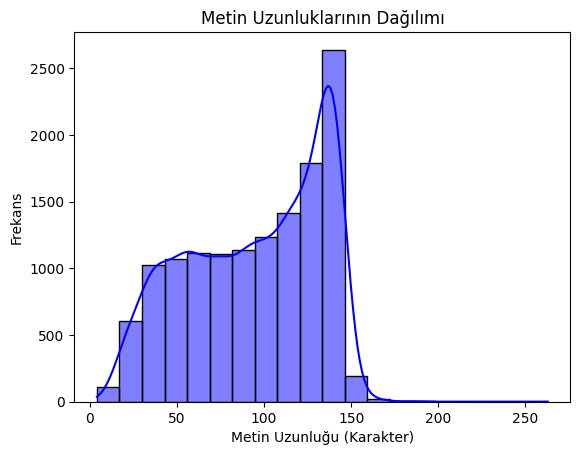

In [ ]:
df['text_length'] = df['Text'].apply(len)
sns.histplot(df['text_length'], bins=20, kde=True, color='blue')
plt.title("Metin Uzunluklarının Dağılımı")
plt.xlabel("Metin Uzunluğu (Karakter)")
plt.ylabel("Frekans")
plt.show()

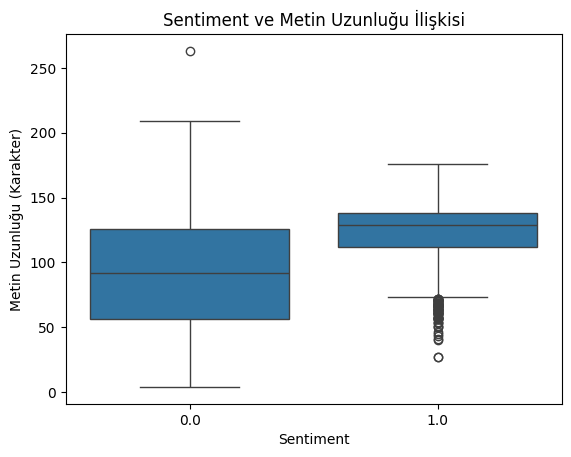

In [ ]:
# Sentiment bazında metin uzunluklarının dağılımı
sns.boxplot(x='score', y='text_length', data=df)
plt.title("Sentiment ve Metin Uzunluğu İlişkisi")
plt.xlabel("Sentiment")
plt.ylabel("Metin Uzunluğu (Karakter)")
plt.show()

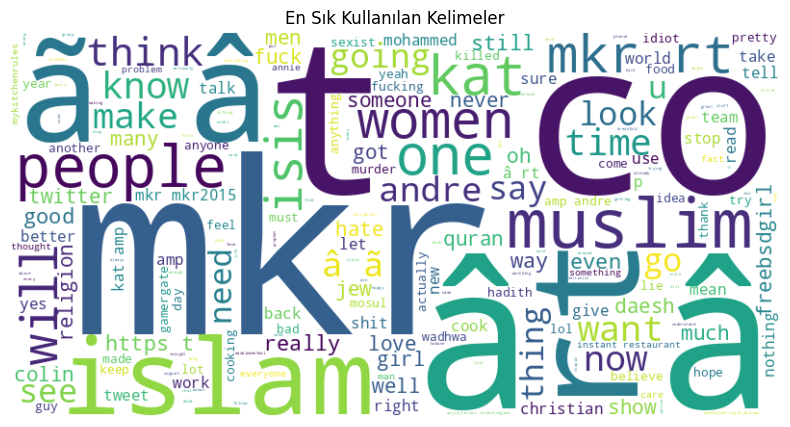

In [ ]:
from collections import Counter
from wordcloud import WordCloud

# Tüm metinleri birleştirerek kelimeleri say
all_words = " ".join(df['Text']).lower().split()
word_counts = Counter(all_words)

# En sık kullanılan kelimeleri görselleştirme
wordcloud = WordCloud(width=800, height=400, background_color="white").generate(" ".join(all_words))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("En Sık Kullanılan Kelimeler")
plt.show()

In [ ]:
# Pozitif, negatif ve nötr metinleri ayırma
positive_text = " ".join(df[df['score'] == '1']['Text']).lower()
negative_text = " ".join(df[df['score'] == '-1']['Text']).lower()
neutral_text = " ".join(df[df['score'] == '0']['Text']).lower()

In [ ]:
# Pozitif, negatif ve nötr metinleri ayırma
positive_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 1][secilen_kolon_adi]).lower()
negative_text = " ".join(df[df[secilen_sentiment_kolon_adi] == -1][secilen_kolon_adi]).lower()
neutral_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 0][secilen_kolon_adi]).lower()

In [ ]:
# Pozitif, negatif metinleri ayırma
positive_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 1][secilen_kolon_adi]).lower()
negative_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 0][secilen_kolon_adi]).lower()


In [ ]:
positive_text

' aalwuhaib muslim mob violence hindus bangladesh continues islam http co jbwjwurc  jncatron isra jourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed   huffpostrelig islam invaded conquered christiandom christian crusades response writer liar   semzyxx approve pedophile prophet raping year old girl like says hadith   watan geeky zekey problem vile muslims try rationalize amp excuse crimes islam rather get rid   ammaawah jm following religion ignorance illiterate prophet want talk spelling lol   hahellyer true stoning beheading much mohammed taste   abunaseeha told tribe yet daughters would become whores sexual jihad   madasahatter buttercupashby furthermore telling people tolerant wholly intolerant religion idiotic   ummsuhaym logicalmind quran would good example terrorism http co vonyoatpfk rt iammgraham called islamophobe saying islam needs theological reformation head egypt agrees http co   reza rahman basically claiming religion teaches hatred m

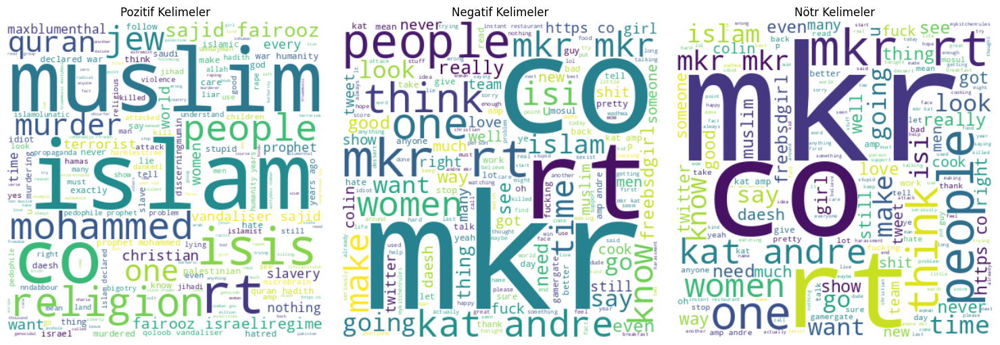

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Pozitif kelimeler
if positive_text.strip():
    axes[0].imshow(WordCloud(width=400, height=400, background_color="white").generate(positive_text), interpolation="bilinear")
    axes[0].set_title("Pozitif Kelimeler")
else:
    axes[0].text(0.5, 0.5, 'Veri yok', horizontalalignment='center', verticalalignment='center', fontsize=16)
axes[0].axis("off")

# Negatif kelimeler
if negative_text.strip():
    axes[1].imshow(WordCloud(width=400, height=400, background_color="white").generate(negative_text), interpolation="bilinear")
    axes[1].set_title("Negatif Kelimeler")
else:
    axes[1].text(0.5, 0.5, 'Veri yok', horizontalalignment='center', verticalalignment='center', fontsize=16)
axes[1].axis("off")

# Nötr kelimeler (örnek)
if neutral_text.strip():
    axes[2].imshow(WordCloud(width=400, height=400, background_color="white").generate(neutral_text), interpolation="bilinear")
    axes[2].set_title("Nötr Kelimeler")
else:
    axes[2].text(0.5, 0.5, 'Veri yok', horizontalalignment='center', verticalalignment='center', fontsize=16)
axes[2].axis("off")

plt.tight_layout()
plt.show()


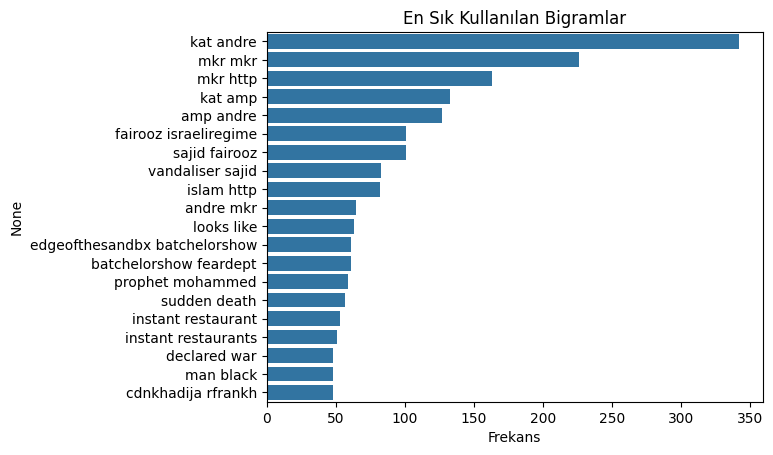

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

# Bigram oluşturma
vectorizer = CountVectorizer(ngram_range=(2, 2), max_features=20, stop_words='english')
bigrams = vectorizer.fit_transform(df[secilen_kolon_adi])
bigram_df = pd.DataFrame(bigrams.toarray(), columns=vectorizer.get_feature_names_out())

# En sık kullanılan bigramları görselleştirme
bigram_counts = bigram_df.sum().sort_values(ascending=False)
sns.barplot(x=bigram_counts.values, y=bigram_counts.index)
plt.title("En Sık Kullanılan Bigramlar")
plt.xlabel("Frekans")
plt.show()

* ## [TF_IDF](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [KNN](#svm)
    * #### [LOGISTIC REG](#log)


#####[Dosya en başta yüklenmişse](#b2)

######Kütüphanelerin Yüklenmesi

In [ ]:
pip install keras

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.stem.porter import *
nltk.download('gutenberg')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

from nltk.tokenize import TweetTokenizer
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import datetime

from scipy import stats
from scipy.sparse import hstack, csr_matrix
from sklearn.model_selection import train_test_split, cross_val_score

from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams

import string
import gensim
from gensim.models.phrases import Phraser, Phrases
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
pd.set_option('max_colwidth',400)
from bs4 import BeautifulSoup
import re

from tqdm import tqdm
from bokeh.io import output_notebook, output_file
from bokeh.plotting import show, figure
%matplotlib inline
from collections import defaultdict

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Package gutenberg is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [ ]:
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from tensorflow.keras.utils import to_categorical
import random
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.losses import categorical_crossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential


###### [Dosyanın yüklenmesi](#p2)

In [ ]:
#dirve da kullanacaksanız buras şart yoksa yorum satırına alınız
warnings.filterwarnings('ignore')

from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Bil482/
"""da db .csv nini yüklü olduğu klasör"""


Mounted at /content/drive
/content/drive/My Drive/Bil482


'da db .csv nini yüklü olduğu klasör'

In [ ]:
df=pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

###### [Veri setinin incelenmesi](#p2)

In [ ]:
df.isnull().values.any()

df.head(10)

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0
6,"SREI Infra is moving sideways: Ashwani Gujral, Market Strategist","[""['sir', 'infra', 'move', 'sideways', 'washwoman', 'inaugural', 'marker', 'strategist']""]",64,srei infra moving sideways ashwani gujral market strategist,srei infra move sideway ashwani gujral market strategist,srei infra moving sideways ashwani gujral market strategist,SREI Infra is moving sideways Ashwani Gujral Market Strategist,"SREI Infra is moving sideways: Ashwani Gujral, Market Strategist","srei infra move sideway ashwani gujral , market strategist",-1,0,0
7,Sweet sugar turns bitter for mill owners in 2014,"[""['sweet', 'sugar', 'turn', 'bitter', 'mill', 'owner', '2014']""]",48,sweet sugar turns bitter mill owners,sweet sugar turn bitter mill owner,sweet sugar turn bitter mill owner,Sweet sugar turns bitter for mill owners in,Sweet sugar turns bitter for mill owners in 2014,sweet sugar turn bitter mill owner,-1,0,0
8,Foreign investors navigate turmoil in Chinese markets with new playbook,"[""['fo reign', 'investor', 'navigable', 'turmoil', 'Chinese', 'market', 'no', 'playbook']""]",71,foreign investors navigate turmoil chinese markets new playbook,foreign investor navig turmoil chines market new playbook,foreign investor navigate turmoil chinese market new playbook,Foreign investors navigate turmoil in Chinese markets with new playbook,Foreign investors navigate turmoil in Chinese markets with new playbook,foreign investor navig turmoil chines market new playbook,-1,0,0
9,NIF may turn co-plaintiff in Modern India suit against NSEL,"[""['nigh', 'be', 'ten', 'co plaintiff', 'modern', 'India', 'soot', 'noel']""]",59,nif may turn co plaintiff modern india suit nsel,nif may turn coplaintiff modern india suit nsel,nif may turn coplaintiff modern india suit nsel,NIF may turn co plaintiff in Modern India suit against NSEL,NIF may turn co-plaintiff in Modern India suit against NSEL,nif may turn coplaintiff modern india suit nsel,-1,0,0
10,NIF may turn co-plaintiff in Modern India suit against NSEL,"[""['nigh', 'be', 'ten', 'co plaintiff', 'modern', 'India', 'soot', 'noel']""]",59,ni

<Axes: xlabel='score', ylabel='count'>

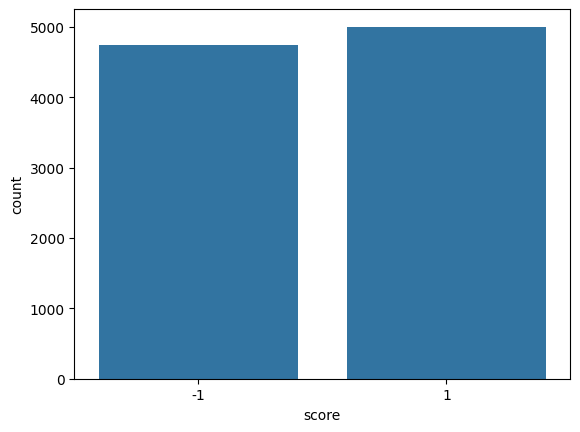

In [ ]:
import seaborn as sns
sns.countplot(x='score', data=df)

In [ ]:
df.shape

(9741, 12)

In [ ]:
print(len(df))

9741


#####[Dosya en başta yüklenmişse](#b2)

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
df.columns

Index(['Text', 'label', 'score', 'hibrit', 'USAirPrePro', 'USAirPrePro2',
       'USAirPrePro3', 'MuammerNLPPrePRro', 'MuammerNLPPrePRro2',
       'MuammerNLPPrePRro3', 'MuammerNLPLSTMPrePRro', 'text_length'],
      dtype='object')

In [ ]:
#secilen_kolon_adi="hibrit"
#secilen_sentiment_kolon_adi="score"

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(13471, 1)

In [ ]:
print(len(df))

9741


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data

,USAirPrePro2,score2
1,wipro growth remains mirage,0
2,chinese stock leave u investor vulnerable,0
3,u stock finish mixed amid tech selling,0
4,opec reduces estimate oil demand growth,0
5,immediate support rupee placed bonanza,0
...,...,...
9737,negotiation carried constructive manner party tried find solution situation,1
9738,wockhardt story really intriguing deven choksey,1
9739,finnish bore owned rettig family grown recently acquisition smaller shipping company,1
9740,operating profit eur mn eur mn,1


###### [Veri Ön işleme ](#b2)

In [ ]:
def preprocess_text(sen):
    # Removing html tags
    sentence = remove_tags(sen)

    # Remove punctuations and numbers
    sentence = re.sub('[^a-zA-Z]', ' ', sentence)

    # Single character removal
    sentence = re.sub(r"\s+[a-zA-Z]\s+", ' ', sentence)

    # Removing multiple spaces
    sentence = re.sub(r'\s+', ' ', sentence)

    return sentence

In [ ]:
TAG_RE = re.compile(r'<[^>]+>')

def remove_tags(text):
    return TAG_RE.sub('', text)

In [ ]:
df['Comment']=df['Text'].apply(str)

In [ ]:
X = []
sentences = list(df['Comment'])
for sen in sentences:
    X.append(preprocess_text(sen))

In [ ]:
y = df['score2']

In [ ]:
y.shape

(9741,)

In [ ]:
y_liste

,score2
1,0
2,0
3,0
4,0
5,0
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
x

,Text
1,"At Wipro, growth remains a mirage"
2,Why Chinese stocks leave US investors vulnerable
3,US stocks finish mixed amid more tech selling
4,Opec reduces estimate on oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza
...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation ."
9738,Wockhardt story is really intriguing: Deven Choksey
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .
9740,"Operating profit was EUR 24.5 mn , up from EUR 23.0 mn ."


In [ ]:
X #Büyük X

['At Wipro growth remains mirage',
 'Why Chinese stocks leave US investors vulnerable',
 'US stocks finish mixed amid more tech selling',
 'Opec reduces estimate on oil demand growth',
 'Immediate support for rupee is placed at Bonanza',
 'SREI Infra is moving sideways Ashwani Gujral Market Strategist',
 'Sweet sugar turns bitter for mill owners in ',
 'Foreign investors navigate turmoil in Chinese markets with new playbook',
 'NIF may turn co plaintiff in Modern India suit against NSEL',
 'NIF may turn co plaintiff in Modern India suit against NSEL',
 'Stock Buzz Sun Pharma may face resistance at current levels',
 'Investors should be wary of cyclicals even if Narendra Modi wins',
 'Markets will move sideways before next upside starts Ashwani Gujral',
 'Stock markets to see cautious trading amid elections IIP data Report',
 'Be cautious on amount of stock you buy into BEML Devang Visaria',
 'Immediate resistance for Reliance is around levels Mileen Vasudeo Angel Broking',
 ' Sahara in

###### %30-70

In [ ]:
  #X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
#df['score'] = df['score'].astype(int)
y = [int(val) for val in y]

In [ ]:
  X_train, X_test, y_train, y_test = train_test_split(x_liste, y_liste, test_size=0.30, random_state=42)

In [ ]:
x_liste

,hibrit
1,aalwuhaib muslim mob violence hindus bangladesh continues islam http co jbwjwurc
2,null
3,jncatron isra jourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed
4,finally caught sudden death cook looks like gonna intense mkr
5,carolinesinders herecomesfran hugs
...,...
13467,mkr nooooo wanted kat andre lose
13468,rt mumtazceltik whitehouse vp kobane jesuischarlie turkish military says mit shipped weapons al qaeda fehimtastekin http
13469,glad proper competition starting even happier colin back mkr
13470,worries pete manu take time need fact feel free fuck right prefer colin mkr


---
<a id="p1"></a>
###### TF-IDF

In [ ]:
#feature extraction with Tf-idf vectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(max_features=10000)
train_vectors = vectorizer.fit_transform(X_train)
test_vectors = vectorizer.transform(X_test)
print(train_vectors.shape, test_vectors.shape)

(9429, 10000) (4042, 10000)


In [ ]:
print(test_vectors)

  (0, 2722)	0.207736690655464
  (0, 3646)	0.3686101773337983
  (0, 3840)	0.26513716000139687
  (0, 3845)	0.28464104120654804
  (0, 4281)	0.25473063142276964
  (0, 5085)	0.3686101773337983
  (0, 6434)	0.3686101773337983
  (0, 7469)	0.3782391785727905
  (0, 9091)	0.39065312025185533
  (0, 9472)	0.19324702260481655
  (1, 3455)	0.43562180797049543
  (1, 3933)	0.2853654726735108
  (1, 3971)	0.3034093816996058
  (1, 4168)	0.1268350527817248
  (1, 5124)	0.5430990552002605
  (1, 8020)	0.4711664990002525
  (1, 8398)	0.32202694044022184
  (2, 503)	0.24736167311904067
  (2, 1090)	0.3493550067637234
  (2, 2536)	0.2467032312321177
  (2, 3210)	0.3853372685498447
  (2, 6230)	0.2560650259973664
  (2, 6421)	0.13514734760473754
  (2, 7504)	0.45151380428278015
  (2, 8288)	0.39171156049195927
  :	:
  (4038, 2185)	0.2537660809633986
  (4038, 2656)	0.3143842569855795
  (4038, 3840)	0.2660243112320528
  (4038, 4199)	0.2952546725528376
  (4038, 4725)	0.36984355017543336
  (4038, 7447)	0.40951526040948033
  (4

In [ ]:
y_train = [int(val) for val in y_train]
y_test = [int(val) for val in y_test]


<a id="nb"></a>
###### NB

In [ ]:
#use ML algorithms classifier
#use a Naive Bayes Classifier and train the model on the training set.
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(train_vectors, y_train)

In [ ]:
#test the performance of our model on the test set to predict the sentiment labels
from  sklearn.metrics  import accuracy_score
predicted_NB = clf.predict(test_vectors)
print("Naive Bayes Accuracy Score -> ", accuracy_score(y_test,predicted_NB)*100)


Naive Bayes Accuracy Score ->  89.7080653142009


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predicted_NB))

              precision    recall  f1-score   support

         0.0       0.90      0.98      0.94      3431
         1.0       0.82      0.41      0.54       611

    accuracy                           0.90      4042
   macro avg       0.86      0.70      0.74      4042
weighted avg       0.89      0.90      0.88      4042



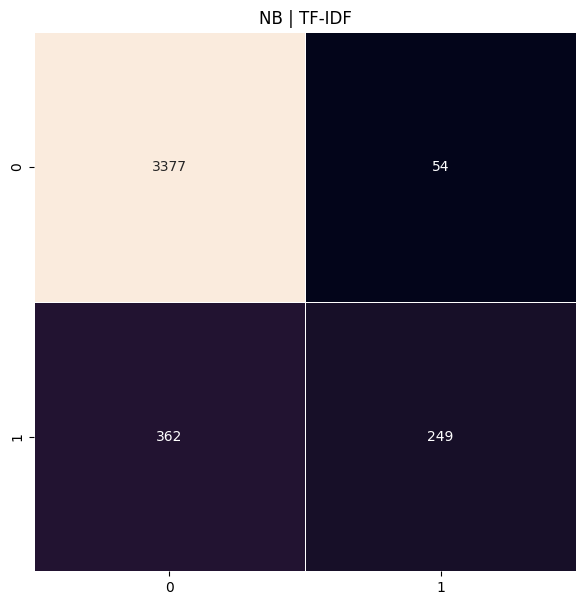

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predicted_NB)
plt.figure(figsize=(7,7))
plt.title("NB | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

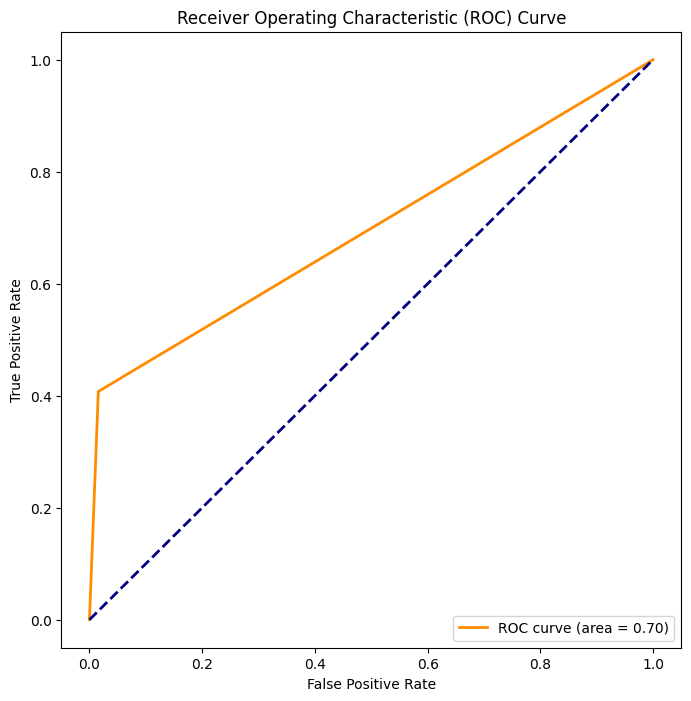

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

predicted_NB= predicted_NB.astype(int)
y_test = y_test.astype(int)
# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predicted_NB)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


<a id="svm"></a>
###### SVM  

In [ ]:
from sklearn.svm import LinearSVC
l2_norm = 2
l2_norm_inverse = 1/l2_norm
maximum_iterations=4000 #maximum number of iterations
svm = LinearSVC(C=l2_norm_inverse,max_iter=maximum_iterations) #create support vector machine model

SVM=svm.fit(train_vectors,y_train)
import numpy as np
#y_true = np.array(y_true).astype(int)

# predict the labels on validation dataset
predictions_SVM = SVM.predict(test_vectors)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  92.47897080653142


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_SVM))

              precision    recall  f1-score   support

           0       0.95      0.96      0.96      3431
           1       0.78      0.70      0.74       611

    accuracy                           0.92      4042
   macro avg       0.86      0.83      0.85      4042
weighted avg       0.92      0.92      0.92      4042



In [ ]:
y_test.head(500)

,score
4464,0
3290,0
8420,0
7608,0
6867,0
...,...
6428,0
1635,0
9594,0
10913,0


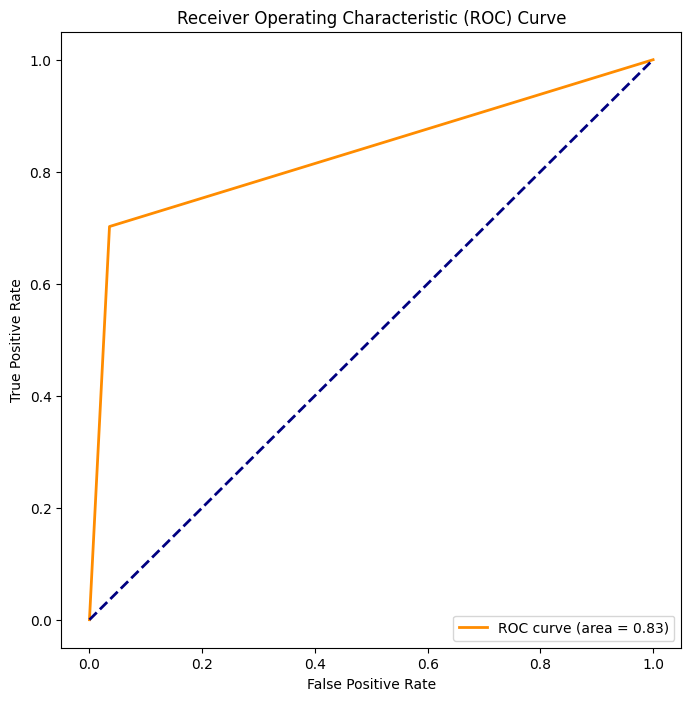

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

predictions_SVM= predictions_SVM.astype(int)
y_test = y_test.astype(int)
# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_SVM)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


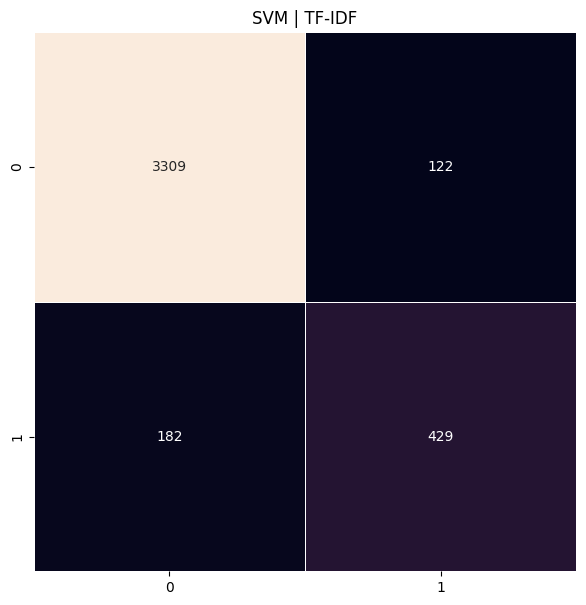

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_SVM)
plt.figure(figsize=(7,7))
plt.title("SVM | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


<a id="log"></a>
###### Log Reg

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
log_reg = linear_model.LogisticRegression()

y_train = [int(val) for val in y_train]
y_test = [int(val) for val in y_test]
log_reg.fit(train_vectors,y_train)
predictions_log = log_reg.predict(test_vectors)
print("Logistic Regression Accuracy Score -> ",accuracy_score(predictions_log, y_test)*100)

Logistic Regression Accuracy Score ->  91.16773874319644


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_log))

              precision    recall  f1-score   support

           0       0.93      0.97      0.95      3431
           1       0.79      0.56      0.66       611

    accuracy                           0.91      4042
   macro avg       0.86      0.77      0.80      4042
weighted avg       0.91      0.91      0.91      4042



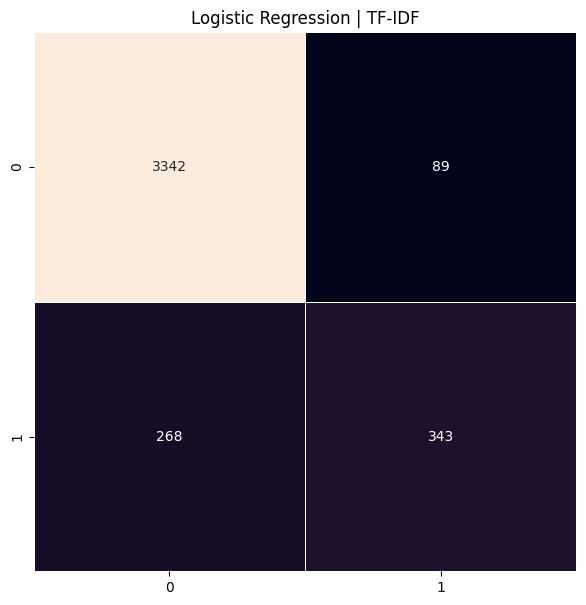

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_log)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

In [ ]:
y_test

[0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,


In [ ]:
predictions_log

array([0, 0, 0, ..., 0, 0, 0])

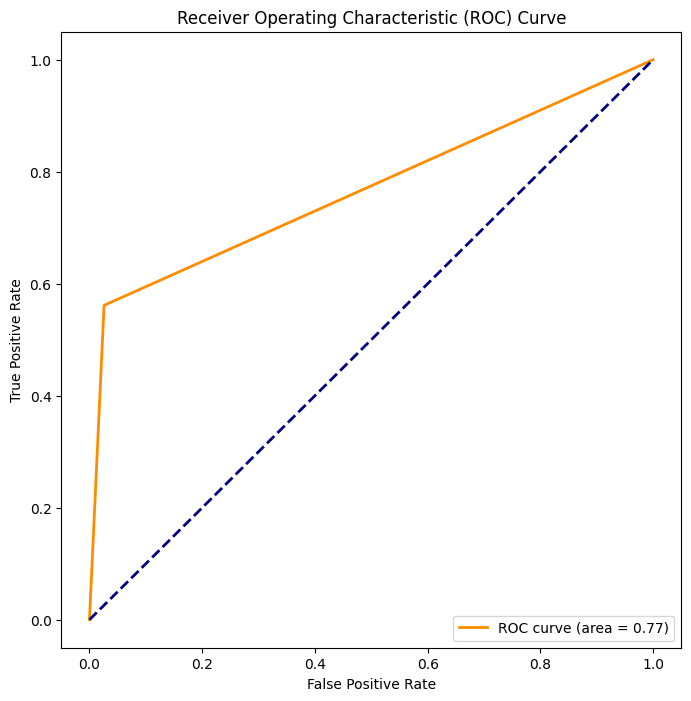

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

predictions_log= predictions_log.astype(int)
y_train = [int(val) for val in y_train]
y_test = [int(val) for val in y_test]
# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_log)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


<a id="knn"></a>
###### KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
number_of_neigbors = 5
minkowski_power = 2 # Manhattan Distance = 1, Euclidean Distance = 2
knn = KNeighborsClassifier(n_neighbors=number_of_neigbors, p =minkowski_power)
model_knn=knn.fit(train_vectors, y_train)
predictions_knn = model_knn.predict(test_vectors)
predictions_knn= predictions_knn.astype(int)
y_train = [int(val) for val in y_train]
y_test = [int(val) for val in y_test]
# Use accuracy_score function to get the accuracy
print("KNN Accuracy Score -> ",accuracy_score(predictions_knn, y_test)*100)





KNN Accuracy Score ->  85.30430479960415


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_knn))

              precision    recall  f1-score   support

           0       0.86      1.00      0.92      3431
           1       0.68      0.05      0.10       611

    accuracy                           0.85      4042
   macro avg       0.77      0.52      0.51      4042
weighted avg       0.83      0.85      0.80      4042



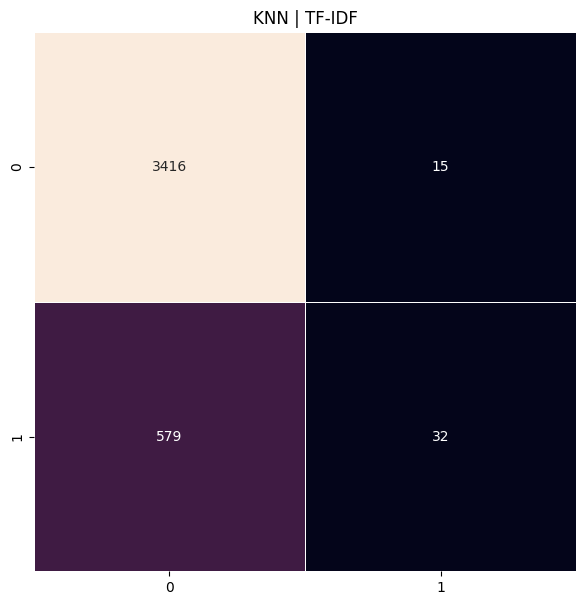

In [ ]:

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_knn)
plt.figure(figsize=(7,7))
plt.title("KNN | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

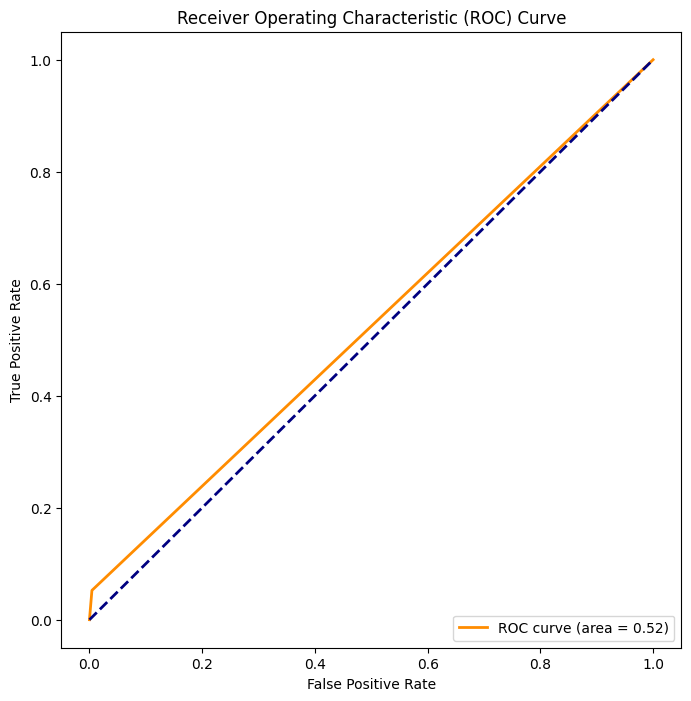

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_knn)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


###### Decision tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

# Decision Tree sınıflandırıcısını tanımla
tree_clf = DecisionTreeClassifier()

# Modeli eğit
tree_clf.fit(train_vectors, y_train)

# Test verileri üzerinde tahmin yap
predictions_tree = tree_clf.predict(test_vectors)

predictions_tree= predictions_tree.astype(int)
y_train = [int(val) for val in y_train]
y_test = [int(val) for val in y_test]
# Doğruluk skorunu hesapla ve yazdır
print("Decision Tree Accuracy Score -> ", accuracy_score(predictions_tree, y_test) * 100)


Decision Tree Accuracy Score ->  90.524492825334


In [ ]:
from sklearn.metrics import classification_report

# Sınıflandırma raporunu yazdır
print(classification_report(y_test, predictions_tree))


              precision    recall  f1-score   support

           0       0.95      0.94      0.94      3431
           1       0.68      0.70      0.69       611

    accuracy                           0.91      4042
   macro avg       0.81      0.82      0.82      4042
weighted avg       0.91      0.91      0.91      4042



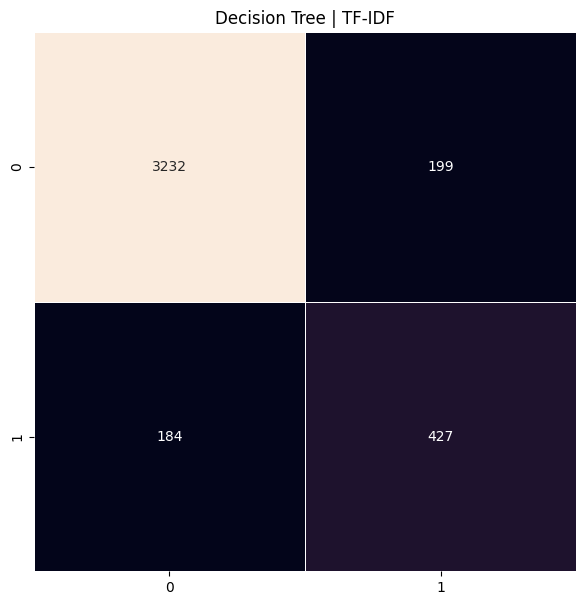

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Karar ağacı modeli için confusion matrix oluştur
cm_tree = confusion_matrix(y_test, predictions_tree)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Decision Tree | TF-IDF")
sns.heatmap(cm_tree, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


######Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Random Forest sınıflandırıcısını tanımla
rf_clf = RandomForestClassifier()

# Modeli eğit
rf_clf.fit(train_vectors, y_train)

# Test verileri üzerinde tahmin yap
predictions_rf = rf_clf.predict(test_vectors)
predictions_rf = predictions_rf.astype(int)
y_train = [int(val) for val in y_train]
y_test = [int(val) for val in y_test]

# Doğruluk skorunu hesapla ve yazdır
print("Random Forest Accuracy Score -> ", accuracy_score(predictions_rf, y_test) * 100)


Random Forest Accuracy Score ->  92.75111331024245


In [ ]:
from sklearn.metrics import classification_report

# Sınıflandırma raporunu yazdır
print(classification_report(y_test, predictions_rf))


              precision    recall  f1-score   support

           0       0.95      0.97      0.96      3431
           1       0.79      0.72      0.75       611

    accuracy                           0.93      4042
   macro avg       0.87      0.84      0.85      4042
weighted avg       0.93      0.93      0.93      4042



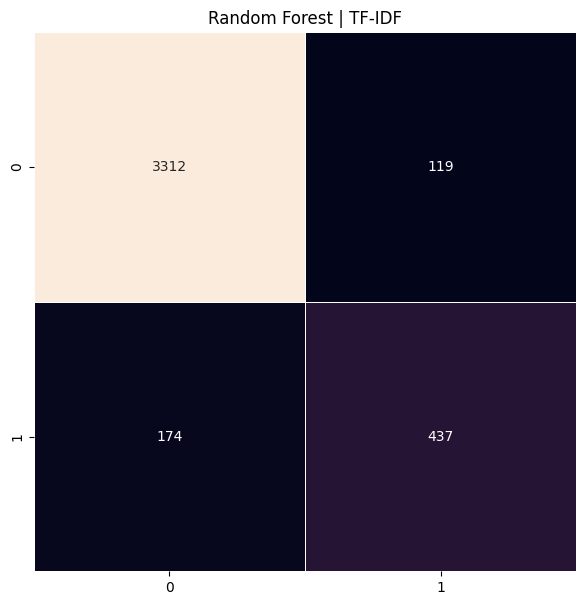

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Random Forest modeli için confusion matrix oluştur
cm_rf = confusion_matrix(y_test, predictions_rf)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Random Forest | TF-IDF")
sns.heatmap(cm_rf, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


* ## [BOW](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [LOGISTIC REG](#log)
    * #### [Decission Tree](#log)
    * #### [Random Forest](#log)
    
    

#####[Dosya en başta yüklenmişse](#b2)

######[Kütüphanelerin yüklenmesi ve test setinin oluşturulması](#b2)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.stem.porter import *
nltk.download('gutenberg')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

from nltk.tokenize import TweetTokenizer
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import datetime

from scipy import stats
from scipy.sparse import hstack, csr_matrix
from sklearn.model_selection import train_test_split, cross_val_score

from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams

import string
import gensim
from gensim.models.phrases import Phraser, Phrases
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
pd.set_option('max_colwidth',400)
from bs4 import BeautifulSoup
import re

from tqdm import tqdm
from bokeh.io import output_notebook, output_file
from bokeh.plotting import show, figure
%matplotlib inline
from collections import defaultdict

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Package gutenberg is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [ ]:
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")

In [ ]:
altta hata oluştu

In [ ]:
from keras.utils import to_categorical
import random
from sklearn.model_selection import train_test_split
from keras.preprocessing import sequence
from keras.preprocessing.text import Tokenizer
from keras.layers import Dense,Dropout,Embedding,LSTM
from keras.callbacks import EarlyStopping
from keras.losses import categorical_crossentropy
from keras.optimizers import Adam
from keras.models import Sequential

ModuleNotFoundError: No module named 'keras.preprocessing.text'

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM
from tensorflow.keras.callbacks import EarlyStopping


In [ ]:
import tensorflow as tf
print(tf.__version__)


2.18.0


In [ ]:
!pip install --upgrade tensorflow keras


In [ ]:
!pip uninstall keras -y
!pip install keras tensorflow


Found existing installation: keras 3.6.0
Uninstalling keras-3.6.0:
  Successfully uninstalled keras-3.6.0
  Using cached keras-3.6.0-py3-none-any.whl.metadata (5.8 kB)
Using cached keras-3.6.0-py3-none-any.whl (1.2 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-keras 2.17.0 requires tensorflow<2.18,>=2.17, but you have tensorflow 2.18.0 which is incompatible.


In [ ]:
!pip install nltk
from nltk.tokenize import word_tokenize


###### [Dosyanın yüklenmesi](#b2)

In [ ]:
warnings.filterwarnings('ignore')
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Eski/Bil482/
df=pd.read_csv("Loan.csv",index_col=0)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/Bil482


In [ ]:
df=pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

In [ ]:
df.isnull().values.any()

df.head()

,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,NumberOfDependents,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,LoanApproved,RiskScore
ApplicationDate,,,,,,,,,,,,,,,,,,,,,
2018-01-01,45,39948,617,Employed,Master,22,13152,48,Married,2,...,3329.000000,0.724972,11,126928,0.199652,0.227590,419.805992,0.181077,0,49.0
2018-01-02,38,39709,628,Employed,Associate,15,26045,48,Single,1,...,3309.083333,0.935132,3,43609,0.207045,0.201077,794.054238,0.389852,0,52.0
2018-01-03,47,40724,570,Employed,Bachelor,26,17627,36,Married,2,...,3393.666667,0.872241,6,5205,0.217627,0.212548,666.406688,0.462157,0,52.0
2018-01-04,58,69084,545,Employed,High School,34,37898,96,Single,1,...,5757.000000,0.896155,5,99452,0.300398,0.300911,1047.506980,0.313098,0,54.0
2018-01-05,37,103264,594,Employed,Associate,17,9184,36,Married,1,...,8605.333333,0.941369,5,227019,0.197184,0.175990,330.179140,0.070210,1,36.0


In [ ]:
df.shape

(20000, 35)

In [ ]:
print(len(df))

20000


In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in df.Text)
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

AttributeError: 'DataFrame' object has no attribute 'Text'

#####[Dosya en başta yüklemişse](#b2)

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
#secilen_kolon_adi="hibrit"

In [ ]:
#secilen_sentiment_kolon_adi="score2"

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(9741, 1)

In [ ]:
print(len(df))

9741


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data

,Text,score
1,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc,1
2,#NULL!,0
3,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.,1
4,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR",0
5,@carolinesinders @herecomesfran *hugs*,0
...,...,...
13467,#mkr NOOOOO!!! I wanted Kat and Andre to lose!!!,0
13468,RT @MumtazCeltik: @WhiteHouse @VP \n\n#Kobane \n\n#JeSuisCharlie \n\n'Turkish military says MIT shipped weapons to al-Qaeda'\n@fehimtastekinÃ¢ÂÂºÃ¢ÂÂºhttpÃ¢ÂÂ¦,0
13469,Glad the proper competition is starting and even happier that Colin is back. #mkr,0
13470,"No worries Pete and Manu, take all the time off you need. In fact, feel free to fuck right off - I prefer Colin #mkr",0


###### [Veri ön işleme](#b2)

In [ ]:
def preprocess_text(sen):
    # Removing html tags
    sentence = remove_tags(sen)

    # Remove punctuations and numbers
    sentence = re.sub('[^a-zA-Z]', ' ', sentence)

    # Single character removal
    sentence = re.sub(r"\s+[a-zA-Z]\s+", ' ', sentence)

    # Removing multiple spaces
    sentence = re.sub(r'\s+', ' ', sentence)

    return sentence

In [ ]:
TAG_RE = re.compile(r'<[^>]+>')

def remove_tags(text):
    return TAG_RE.sub('', text)

In [ ]:
df['Comment']=df['Text'].apply(str)

In [ ]:
X = []
sentences = list(df['Comment'])
for sen in sentences:
    X.append(preprocess_text(sen))

In [ ]:
X

[' AAlwuhaib Muslim mob violence against Hindus in Bangladesh continues in Islam http co JBWJwuRc',
 ' NULL ',
 ' jncatron isra jourisra AMPalestine Islamophobia is like the idea of Naziphobia Islam is religion of hate and it must be outlawed ',
 'Finally m all caught up and that sudden death cook off looks like it gonna be intense MKR',
 ' carolinesinders herecomesfran hugs ',
 'Please PLEASE start using is your discernment blunted by steroids to mean are you on DRUGS from now on DEAD',
 ' aymannathem As soon as ISIS chased all the minorities out of Mosul the Sunni Arabs were happy to steal their property So fuck them ',
 ' Ali Gharib MaxBlumenthal Glad you like it http co ME Nrk xZ',
 ' HuffPostRelig Islam invaded and conquered of Christiandom before any Christian crusades in response The writer is liar ',
 ' semzyxx Do you approve of your pedophile prophet raping year old girl like it says in hadith ',
 ' watan geeky zekey Problem with vile Muslims is that they try to rationalize am

In [ ]:
y = df['oh_label']

KeyError: 'oh_label'

###### %30-70

In [ ]:
x

,hibrit
1,aalwuhaib muslim mob violence hindus bangladesh continues islam http co jbwjwurc
2,null
3,jncatron isra jourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed
4,finally caught sudden death cook looks like gonna intense mkr
5,carolinesinders herecomesfran hugs
...,...
13467,mkr nooooo wanted kat andre lose
13468,rt mumtazceltik whitehouse vp kobane jesuischarlie turkish military says mit shipped weapons al qaeda fehimtastekin http
13469,glad proper competition starting even happier colin back mkr
13470,worries pete manu take time need fact feel free fuck right prefer colin mkr


In [ ]:
y

,score2
1,0
2,0
3,0
4,0
5,0
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x_liste, y_liste, test_size=0.30, random_state=42)

In [ ]:
from sklearn import  preprocessing

In [ ]:
encoder = preprocessing.LabelEncoder()
y_train = encoder.fit_transform(y_train)
y_test = encoder.fit_transform(y_test)

NameError: name 'preprocessing' is not defined

###### BOW

In [ ]:
#feature extraction with Tf-idf vectorizer

#feature extraction with BOW
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(max_features=10000)
vectorizer.fit(X_train)

train_vectors = vectorizer.transform(X_train)
test_vectors = vectorizer.transform(X_test)
print(train_vectors.shape, test_vectors.shape)

(9429, 10000) (4042, 10000)


###### NB

In [ ]:
#use ML algorithms classifier
#use a Naive Bayes Classifier and train the model on the training set.
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(train_vectors, y_train)

In [ ]:
#test the performance of our model on the test set to predict the sentiment labels
from  sklearn.metrics  import accuracy_score
predicted = clf.predict(test_vectors)
print("Naive Bayes Accuracy Score -> ", accuracy_score(y_test,predicted)*100)


Naive Bayes Accuracy Score ->  90.4997525977239


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predicted))

              precision    recall  f1-score   support

         0.0       0.97      0.91      0.94      3431
         1.0       0.64      0.86      0.73       611

    accuracy                           0.90      4042
   macro avg       0.81      0.89      0.84      4042
weighted avg       0.92      0.90      0.91      4042



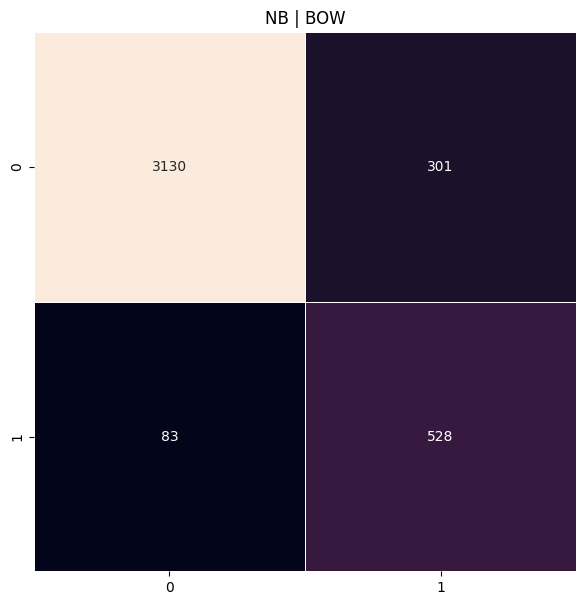

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predicted)
plt.figure(figsize=(7,7))
plt.title("NB | BOW")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### SVM

In [ ]:
from sklearn.svm import LinearSVC
l2_norm = 2
l2_norm_inverse = 1/l2_norm
maximum_iterations=4000
svm = LinearSVC(C=l2_norm_inverse,max_iter=maximum_iterations)
SVM=svm.fit(train_vectors,y_train)

# predict the labels on validation dataset
predictions_SVM = SVM.predict(test_vectors)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  91.63780306778823


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_SVM))

              precision    recall  f1-score   support

         0.0       0.95      0.95      0.95      3431
         1.0       0.73      0.70      0.72       611

    accuracy                           0.92      4042
   macro avg       0.84      0.83      0.83      4042
weighted avg       0.91      0.92      0.92      4042



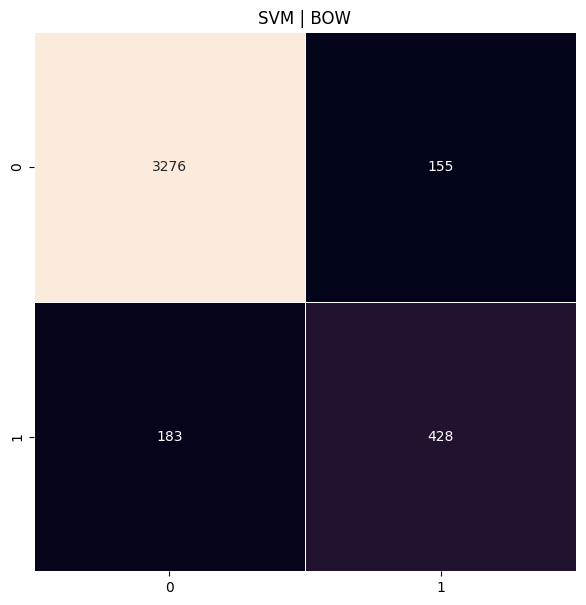

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_SVM)
plt.figure(figsize=(7,7))
plt.title("SVM | BOW")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### LOG REG

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
log_reg = linear_model.LogisticRegression()
log_reg.fit(train_vectors,y_train)
predictions_log = log_reg.predict(test_vectors)
print("Logistic Regression Accuracy Score -> ",accuracy_score(predictions_log, y_test)*100)

Logistic Regression Accuracy Score ->  92.42949035131123


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_log))

              precision    recall  f1-score   support

         0.0       0.94      0.97      0.96      3431
         1.0       0.80      0.67      0.73       611

    accuracy                           0.92      4042
   macro avg       0.87      0.82      0.84      4042
weighted avg       0.92      0.92      0.92      4042



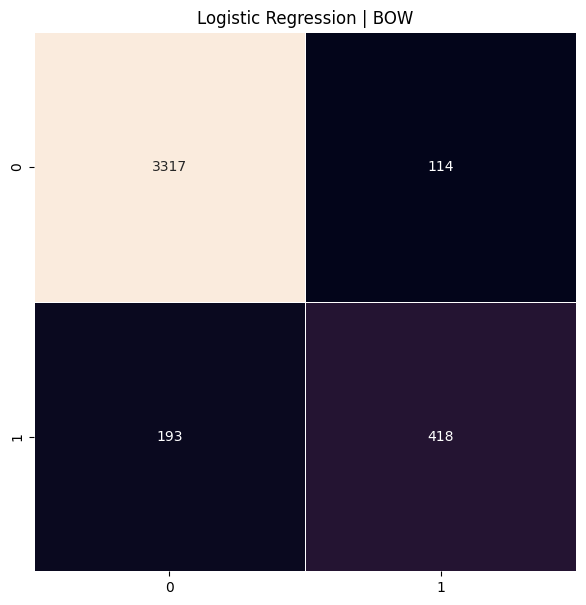

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_log)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | BOW")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### Decission Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
tree_clf = DecisionTreeClassifier()
tree_clf.fit(train_vectors, y_train)
predictions_tree = tree_clf.predict(test_vectors)
print("Decision Tree Accuracy Score -> ", accuracy_score(predictions_tree, y_test) * 100)

Decision Tree Accuracy Score ->  91.46462147451756


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_tree))

              precision    recall  f1-score   support

         0.0       0.95      0.95      0.95      3431
         1.0       0.72      0.72      0.72       611

    accuracy                           0.91      4042
   macro avg       0.83      0.84      0.83      4042
weighted avg       0.91      0.91      0.91      4042



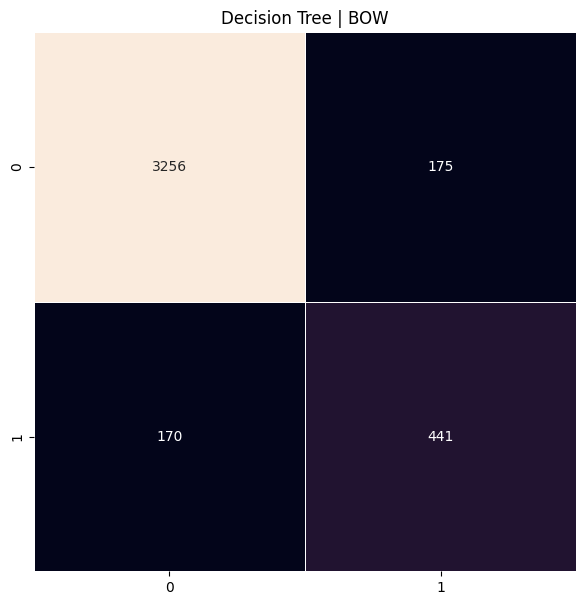

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Karar ağacı modeli için confusion matrix oluştur
cm_tree = confusion_matrix(y_test, predictions_tree)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Decision Tree | BOW")
sns.heatmap(cm_tree, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### Random forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Random Forest sınıflandırıcısını tanımla
rf_clf = RandomForestClassifier()

# Modeli eğit
rf_clf.fit(train_vectors, y_train)

# Test verileri üzerinde tahmin yap
predictions_rf = rf_clf.predict(test_vectors)

# Doğruluk skorunu hesapla ve yazdır
print("Random Forest Accuracy Score -> ", accuracy_score(predictions_rf, y_test) * 100)


Random Forest Accuracy Score ->  92.38000989609104


In [ ]:
from sklearn.metrics import classification_report

# Sınıflandırma raporunu yazdır
print(classification_report(y_test, predictions_rf))

              precision    recall  f1-score   support

         0.0       0.94      0.97      0.96      3431
         1.0       0.80      0.67      0.73       611

    accuracy                           0.92      4042
   macro avg       0.87      0.82      0.84      4042
weighted avg       0.92      0.92      0.92      4042



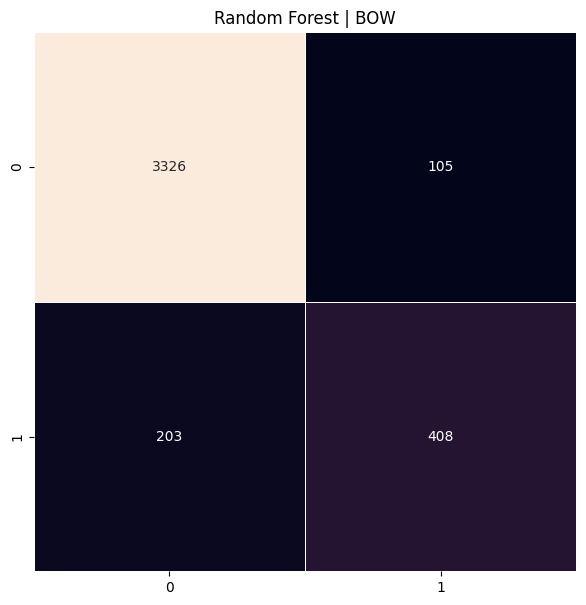

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Random Forest modeli için confusion matrix oluştur
cm_rf = confusion_matrix(y_test, predictions_rf)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Random Forest | BOW")
sns.heatmap(cm_rf, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


* ## [W2V](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [LOGISTIC REG](#log)


#####[Dosya en başta yüklenmemişse](#b2)

###### [Kütüphanelerin eklenmesi](#b2)

> Blok alıntı ekle



In [ ]:
# importing required libraries
import pandas as pd
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import string
import nltk
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

%matplotlib inline

In [ ]:
#dirve da kullanacaksanız buras şart yoksa yorum satırına alınız
warnings.filterwarnings('ignore')

from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Bil482/  #çalışılacak drve dizinni


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[Errno 2] No such file or directory: '/content/drive/My Drive/Bil482/ #çalışılacak drve dizinni'
/content/drive/My Drive/Bil482


'\n\ndata = pd.read_csv("db.csv",index_col=0)\ndata.isnull().values.any()\n\ndata.head()'

In [ ]:
data = pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

In [ ]:
data['Text'].isnull().values.any()

False

In [ ]:
data.head()

,Text,score
1,"At Wipro, growth remains a mirage",-1
2,Why Chinese stocks leave US investors vulnerable,-1
3,US stocks finish mixed amid more tech selling,-1
4,Opec reduces estimate on oil demand growth,-1
5,Immediate support for rupee is placed at 55.10: Bonanza,-1


In [ ]:
data.head()

,Text,score
0,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc,1
1,#NULL!,0
2,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.,1
3,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR",0
4,@carolinesinders @herecomesfran *hugs*,0


In [ ]:
data.shape

(9741, 2)

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
import gensim

In [ ]:
data['Text'] = data['Text'].values.astype('U')
"""data['Text'] = data['Comment'].values.astype('U')"""

"data['Text'] = data['Comment'].values.astype('U')"

In [ ]:
data['Text'].head()

,Text
1,"At Wipro, growth remains a mirage"
2,Why Chinese stocks leave US investors vulnerable
3,US stocks finish mixed amid more tech selling
4,Opec reduces estimate on oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza


#####[Dosya en başta yüklenmemişse](#b2)

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
#secilen_kolon_adi="hibrit"
#secilen_sentiment_kolon_adi="score2"

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(13471, 1)

In [ ]:
print(len(df))

13471


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data

,hibrit,score
1,aalwuhaib muslim mob violence hindus bangladesh continues islam http co jbwjwurc,1.0
2,null,0.0
3,jncatron isra jourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed,1.0
4,finally caught sudden death cook looks like gonna intense mkr,0.0
5,carolinesinders herecomesfran hugs,0.0
...,...,...
13467,mkr nooooo wanted kat andre lose,0.0
13468,rt mumtazceltik whitehouse vp kobane jesuischarlie turkish military says mit shipped weapons al qaeda fehimtastekin http,0.0
13469,glad proper competition starting even happier colin back mkr,0.0
13470,worries pete manu take time need fact feel free fuck right prefer colin mkr,0.0


In [ ]:
data_size=data.shape[0]
data_size

13471

###### [**Word Embeddings**](#b2)
1. Word2Vec Embeddings

- 100 dim,
- cbow

In [ ]:
tokenized_tweet = data[secilen_kolon_adi].head(data_size).apply(lambda x: x.split()) # tokenizing

model_w2v = gensim.models.Word2Vec(
            tokenized_tweet,
            vector_size=100,
            window=5, # context window size
            min_count=2,
            sg = 0, # 1 for skip-gram model
            hs = 0,
            negative = 10, # for negative sampling
            workers= 2, # no.of cores
            seed = 34)

model_w2v.train(tokenized_tweet, total_examples= len(data[secilen_kolon_adi]), epochs=20)

(2055054, 2509120)

In [ ]:
tokenized_tweet


,hibrit
1,"[aalwuhaib, muslim, mob, violence, hindus, bangladesh, continues, islam, http, co, jbwjwurc]"
2,[null]
3,"[jncatron, isra, jourisra, ampalestine, islamophobia, like, idea, naziphobia, islam, religion, hate, must, outlawed]"
4,"[finally, caught, sudden, death, cook, looks, like, gonna, intense, mkr]"
5,"[carolinesinders, herecomesfran, hugs]"
...,...
13467,"[mkr, nooooo, wanted, kat, andre, lose]"
13468,"[rt, mumtazceltik, whitehouse, vp, kobane, jesuischarlie, turkish, military, says, mit, shipped, weapons, al, qaeda, fehimtastekin, http]"
13469,"[glad, proper, competition, starting, even, happier, colin, back, mkr]"
13470,"[worries, pete, manu, take, time, need, fact, feel, free, fuck, right, prefer, colin, mkr]"


In [ ]:
tokenized_tweet.shape

(13471,)

In [ ]:
null_count = 0
from contextlib import nullcontext

# Örnek bir tokenized_tweet listesi oluşturalım
tokenized_tweet = [{"Text": "#NULL!"}, {"Text": "some_text"}, {"Text": "#NULL!"}]

# Sözlük olup olmadığını kontrol edelim ve "Text" anahtarının varlığını kontrol edelim
for tweet in tokenized_tweet:
    if isinstance(tweet, dict) and "Text" in tweet:
        if tweet["Text"] == '#NULL!':
            null_count += 1

print(null_count)


2


In [ ]:
def word_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v[word].reshape((1, size))
            count += 1.
        except KeyError: # handling the case where the token is not in vocabulary

            continue
    if count != 0:
        vec /= count
    return vec

In [ ]:
# Assuming 'model_w2v' is the Word2Vec model you trained earlier
def get_tweet_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v.wv[word].reshape((1, size))
            count += 1.
        except KeyError:  # handling the case where the word is not in the vocabulary
            continue
    if count != 0:
        vec /= count
    return vec

#wordvec_arrays = np.zeros((len(tokenized_tweet), 100))

In [ ]:
"""for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape"""

(3, 100)

In [ ]:
# Assuming 'model_w2v' is the Word2Vec model you trained earlier
def get_tweet_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v.wv[word].reshape((1, size))
            count += 1.
        except KeyError:  # handling the case where the word is not in the vocabulary
            continue
    if count != 0:
        vec /= count
    return vec

wordvec_arrays = np.zeros((len(tokenized_tweet), 100))

"""for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape
"""

'for i in range(len(tokenized_tweet)):\n    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)\n\nwordvec_df = pd.DataFrame(wordvec_arrays)\nwordvec_df.shape\n'

In [ ]:
for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape

(3, 100)

In [ ]:
print("tokenized_tweet:", len(tokenized_tweet))
print("wordvec_df:", wordvec_df.shape)
print("data['score']:", len(data[secilen_sentiment_kolon_adi]))

tokenized_tweet: 3
wordvec_df: (3, 100)
data['score']: 13471


In [ ]:
# 1. Tüm veriyi tokenize et (buradaki 'text' sütunun adı sana bağlı)
tokenized_tweet = [str(text).split() for text in data[secilen_kolon_adi]]  # veya kendi tokenizer'ın varsa kullan

# 2. Word2Vec modelini oluştur
from gensim.models import Word2Vec
model_w2v = Word2Vec(sentences=tokenized_tweet, vector_size=100, window=5, min_count=2)

# 3. Ortalama vektör fonksiyonu (seninkini aynen kullanıyoruz)
def get_tweet_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v.wv[word].reshape((1, size))
            count += 1.
        except KeyError:
            continue
    if count != 0:
        vec /= count
    return vec

# 4. Tüm tweet'leri vektöre çevir
wordvec_arrays = np.zeros((len(tokenized_tweet), 100))
for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)

# 5. Etiketlerle aynı uzunlukta mı kontrol et
print(wordvec_df.shape)         # (13471, 100) olmalı
print(len(data[secilen_kolon_adi]))       # 13471 olmalı


(13471, 100)
13471


In [ ]:
wordvec_df

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,-0.514656,0.523737,0.279881,-0.054914,0.097864,-0.540184,0.024569,1.019069,-0.211784,-0.338460,...,0.403461,0.112059,0.327659,-0.071203,0.941801,0.449456,0.369473,-0.342778,0.394561,0.282726
1,-0.005538,0.006621,0.008388,-0.001298,-0.003260,-0.016821,-0.000768,0.026657,-0.007791,-0.004361,...,0.018751,0.013183,-0.006623,0.013993,0.024883,0.013015,0.014461,-0.002020,0.016143,0.014501
2,-0.306183,0.452290,0.259097,-0.013679,-0.016700,-0.503556,0.119442,0.858057,-0.244734,-0.311210,...,0.423227,0.097103,0.116936,0.086350,0.848740,0.323102,0.307701,-0.302402,0.302842,0.203799
3,-0.168876,0.457169,0.255497,0.107352,-0.088178,-0.555804,0.274749,0.857107,-0.398833,-0.333704,...,0.470460,0.064927,-0.025394,0.134531,0.915373,0.274049,0.291003,-0.345642,0.235703,0.105463
4,-0.010674,0.032283,0.014397,0.002202,0.007621,-0.026110,0.010448,0.045487,-0.006549,-0.012802,...,0.023099,0.001638,0.009167,0.011599,0.049810,0.018127,0.018188,-0.023469,0.011534,0.015633
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13466,0.126256,0.431632,0.215825,0.348725,-0.188270,-0.597695,0.551699,0.785247,-0.712226,-0.367427,...,0.514031,-0.007606,-0.283115,0.210100,1.013505,0.151999,0.254255,-0.427505,0.089051,-0.067848
13467,-0.296287,0.394842,0.205023,-0.020733,0.010412,-0.423666,0.090742,0.774752,-0.218843,-0.266879,...,0.346777,0.090019,0.148372,0.031648,0.761090,0.314166,0.285468,-0.261481,0.295631,0.163072
13468,-0.164467,0.441987,0.249156,0.102574,-0.085248,-0.540042,0.263353,0.843494,-0.386461,-0.326547,...,0.460001,0.064745,-0.024405,0.136083,0.897777,0.263156,0.281268,-0.341781,0.235267,0.105949
13469,-0.250014,0.555425,0.315561,0.083170,-0.086424,-0.667688,0.284241,1.058089,-0.426568,-0.407530,...,0.568609,0.094768,0.014367,0.167532,1.104197,0.344070,0.363572,-0.408870,0.313640,0.169195


**2. Doc2Vec Embedding**

- 100 dim,


###### [Train test split](#b2)

In [ ]:

from sklearn.model_selection import train_test_split

train_w2v = wordvec_df.iloc[:150000, :]
test_w2v = wordvec_df.iloc[150000:, :]
#xtrain_w2v, xvalid_w2v, ytrain, yvalid = train_test_split(train_w2v, data['score'],random_state=42,test_size=0.3)
"""
# Splitting data into training and validation set
xtrain_w2v, xvalid_w2v, ytrain, yvalid = train_test_split(train_w2v, data['BinaryNumTarget'],random_state=42,test_size=0.2)
"""
xtrain_w2v, xvalid_w2v, ytrain, yvalid = train_test_split(train_w2v, data[secilen_sentiment_kolon_adi],random_state=42,test_size=0.3)


In [ ]:
test_w2v.shape

(0, 100)

In [ ]:
print(type(ytrain))
print(ytrain.head())

<class 'pandas.core.series.Series'>
6351    1.0
5174    0.0
2466    0.0
5397    1.0
2287    0.0
Name: score, dtype: float64


In [ ]:
yvalid.head()

,score
4464,0.0
3290,0.0
8420,0.0
7608,0.0
6867,0.0


In [ ]:
yvalid.shape

(4042,)

In [ ]:
ytrain

,score
6351,1.0
5174,0.0
2466,0.0
5397,1.0
2287,0.0
...,...
5192,0.0
13419,1.0
5391,0.0
861,0.0


In [ ]:
ytrain.shape

(9429,)

In [ ]:
y_train = [int(val) for val in y_train]
y_test = [int(val) for val in y_test]

###### [**1. Logistic Regression**](#b2)
xtrain_w2v, xvalid_w2v, ytrain, yvalid

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
log_reg = linear_model.LogisticRegression()
log_reg.fit(xtrain_w2v,y_train)
predictions_log = log_reg.predict(xvalid_w2v)
print("Logistic Regression Accuracy Score -> ",accuracy_score(predictions_log, y_test)*100)

Logistic Regression Accuracy Score ->  87.5804057397328


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
lreg = linear_model.LogisticRegression()

In [ ]:
lreg.fit(xtrain_w2v, ytrain)

LogisticRegression()

In [ ]:
from sklearn.metrics import f1_score

# Olasılık tahmini
prediction = lreg.predict_proba(xvalid_w2v)

# Eşik değeri uygulayarak ikili sınıflandırma
prediction_LR_int = (prediction[:, 1] >= 0.3).astype(int)

# Etiketleri integer'a dönüştür (örneğin: "0" -> 0, "1" -> 1)
yvalid_int = [int(label) for label in yvalid]

# F1 skoru hesapla
f1_score_result = f1_score(yvalid_int, prediction_LR_int)
print("F1 Score:", f1_score_result)


F1 Score: 0.6188118811881188


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_LR_int))

              precision    recall  f1-score   support

           0       0.93      0.93      0.93      3431
           1       0.62      0.61      0.62       611

    accuracy                           0.89      4042
   macro avg       0.78      0.77      0.78      4042
weighted avg       0.88      0.89      0.89      4042



In [ ]:
f1_score(yvalid_int, prediction_LR_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, prediction_LR_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.8853117778545595

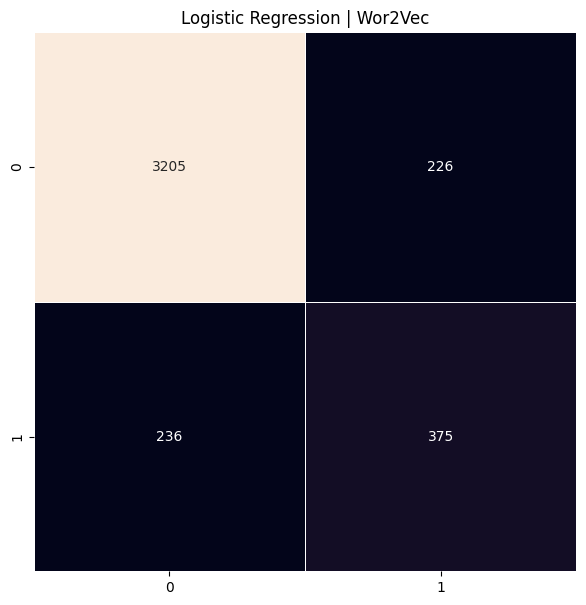

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, prediction_LR_int)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | Wor2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### [**2. Support Vector Machine**](#b2)

In [ ]:
from sklearn import svm


In [ ]:
from sklearn.svm import LinearSVC
l2_norm = 2
l2_norm_inverse = 1/l2_norm
maximum_iterations=4000
svm = LinearSVC(C=l2_norm_inverse,max_iter=maximum_iterations)
SVM=svm.fit(xtrain_w2v,y_train)

# predict the labels on validation dataset
predictions_SVM = SVM.predict(xvalid_w2v)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  88.37209302325581


In [ ]:
import numpy as np
from sklearn import svm
from sklearn.metrics import f1_score

svc = svm.SVC(kernel='linear', C=1, probability=True).fit(xtrain_w2v, ytrain)

prediction = svc.predict_proba(xvalid_w2v)
prediction_int = prediction[:, 1] >= 0.3
prediction_SVM_int = prediction_int.astype(int)
f1_score(yvalid_int, prediction_SVM_int)


0.6530291109362707

In [ ]:
f1_score(yvalid_int, prediction_SVM_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, prediction_SVM_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.8754414437120097

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_SVM_int))

              precision    recall  f1-score   support

           0       0.94      0.93      0.94      3431
           1       0.63      0.68      0.65       611

    accuracy                           0.89      4042
   macro avg       0.79      0.80      0.79      4042
weighted avg       0.89      0.89      0.89      4042



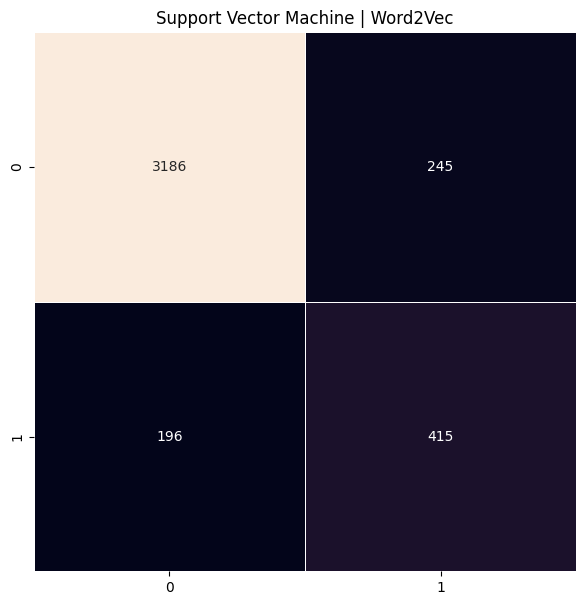

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, prediction_SVM_int)
plt.figure(figsize=(7,7))
plt.title("Support Vector Machine | Word2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### [**3. Decission tree**]($b2)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
tree_clf = DecisionTreeClassifier()
tree_clf.fit(xtrain_w2v, ytrain)
predictions_tree = tree_clf.predict(xvalid_w2v)
predictions_tree_int = [int(label) for label in predictions_tree]
yvalid_int = [int(label) for label in yvalid]
print("Decision Tree Accuracy Score -> ", accuracy_score(predictions_tree_int, yvalid_int) * 100)

Decision Tree Accuracy Score ->  84.61157842652153


In [ ]:
from sklearn.tree import DecisionTreeClassifier


In [ ]:
dt = DecisionTreeClassifier().fit(xtrain_w2v, ytrain)
yvalid_int = [int(label) for label in yvalid]
prediction_DT=  dt.predict(xvalid_w2v)
prediction_DT_int = [int(label) for label in prediction_DT]
f1_score(yvalid_int, prediction_DT_int)


0.5159781761496492

In [ ]:
f1_score(yvalid_int, prediction_DT_int, average='macro')       # Sınıflar eşit ağırlıklı
#f1_score(yvalid_int, prediction_DT_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.7123340373469904

In [ ]:
f1_score(yvalid_int, prediction_DT_int, average='weighted')

0.849326498647461

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_DT_int))

              precision    recall  f1-score   support

           0       0.92      0.90      0.91      3431
           1       0.49      0.54      0.52       611

    accuracy                           0.85      4042
   macro avg       0.70      0.72      0.71      4042
weighted avg       0.85      0.85      0.85      4042



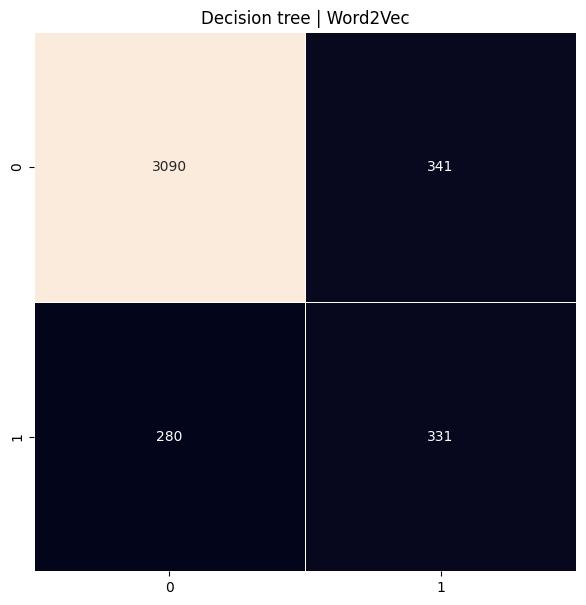

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, prediction_DT_int)
plt.figure(figsize=(7,7))
plt.title("Decision tree | Word2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### [NB](#b2)
Navie Bayes wordvec deki negatif değerlerden dolayı hata verdi

In [ ]:
#use ML algorithms classifier
#use a Naive Bayes Classifier and train the model on the training set.
"""from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(xtrain_w2v, ytrain)"""

'from sklearn.naive_bayes import MultinomialNB\nclf = MultinomialNB().fit(xtrain_w2v, ytrain)'

###### [Random Forest](#b2)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Random Forest sınıflandırıcısını tanımla
rf_clf = RandomForestClassifier()

# Modeli eğit
rf_clf.fit(xtrain_w2v, ytrain)

# Test verileri üzerinde tahmin yap
predictions_rf = rf_clf.predict(xvalid_w2v)
predictions_rf_int = [int(label) for label in predictions_rf]
yvalid_int = [int(label) for label in yvalid]
# Doğruluk skorunu hesapla ve yazdır
print("Random Forest Accuracy Score -> ", accuracy_score(predictions_rf_int, yvalid_int) * 100)


Random Forest Accuracy Score ->  90.35131123206334


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score

RF = RandomForestClassifier().fit(xtrain_w2v, ytrain)
yvalid_int = [int(label) for label in yvalid]
prediction_RF = RF.predict(xvalid_w2v)

# Bu satırda yanlışlık var — prediction_DT yanlış değişken
prediction_RF_int = [int(label) for label in prediction_RF]  # Doğrusu bu olmalı

f1_score(yvalid_int, prediction_RF_int)

0.6358595194085028

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_RF_int))

              precision    recall  f1-score   support

           0       0.93      0.96      0.94      3431
           1       0.73      0.56      0.64       611

    accuracy                           0.90      4042
   macro avg       0.83      0.76      0.79      4042
weighted avg       0.90      0.90      0.90      4042



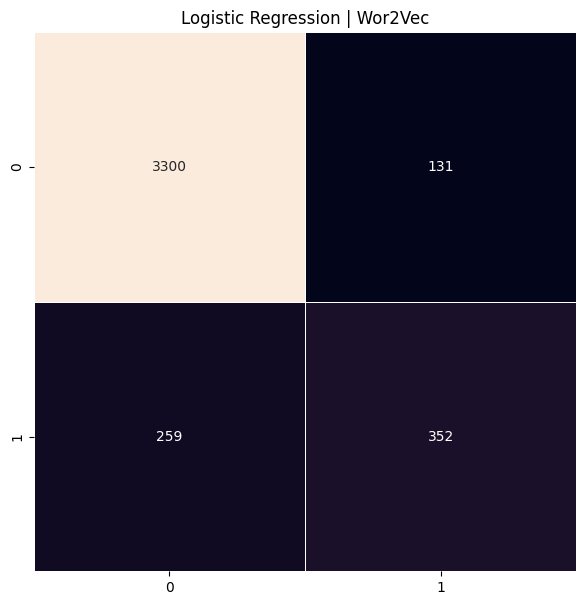

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, predictions_rf_int)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | Wor2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

In [ ]:
f1_score(yvalid_int, predictions_rf_int, average='macro')       # Sınıflar eşit ağırlıklı
  # Gerçek örnek sayısına göre ağırlıklı


0.793858031714149

In [ ]:
f1_score(yvalid_int, predictions_rf_int, average='weighted')

0.8987519690649922

* ## [LSTM](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [LOGISTIC REG](#log)


#####[Dosya en başta yüklenmemişse](#b2)

###### [Kütüphanelerin yüklenmesi](#p2)

In [ ]:
# importing required libraries
import pandas as pd
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import string
import nltk
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

%matplotlib inline

###### [Dosyanın yüklenmesin](#p2)

In [ ]:
import numpy as np
import pandas as pd
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

/kaggle/input/amazon-product-reviews/amazon.csv

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/BİL482/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[Errno 2] No such file or directory: '/content/drive/My Drive/BİL482/'
/content/drive/My Drive/Bil482


In [ ]:
train_df = pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

###### [Veri Setinin incelenmesi](#p2)

In [ ]:
train_df=df

In [ ]:
train_df.isnull().values.any()

False

In [ ]:
train_df.head()

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2,Comment
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0,"At Wipro, growth remains a mirage"
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0,Why Chinese stocks leave US investors vulnerable
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0,US stocks finish mixed amid more tech selling
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0,Opec reduces estimate on oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0,Immediate support for rupee is placed at 55.10: Bonanza


In [ ]:
train_df

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2,Text_prepro
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1.0,0,0.0,"wipro , growth remain mirag"
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1.0,0,0.0,chines stock leav us investor vulner
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1.0,0,0.0,us stock finish mix amid tech sell
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1.0,0,0.0,opec reduc estim oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1.0,0,0.0,immedi support rupe place bonanza
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","[""['negotiation', 'carry', 'constructive', 'manner', '', 'patch', 'tire', 'fund', 'solution', 'situation', '']""]",121,negotiations carried constructive manner parties tried find solution situation,negoti carri construct manner parti tri find solut situat,negotiation carried constructive manner party tried find solution situation,The negotiations were carried out in constructive manner and all parties tried to find solution to the situation,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","negoti carri construct manner , parti tri find solut situat",1.0,2,1.0,"negoti carri construct manner , parti tri find solut situat"
9738,Wockhardt story is really intriguing: Deven Choksey,"[""['hardtack', 'story', 'really', 'intrigue', 'seven', 'choke']""]",51,wockhardt story really intriguing deven choksey,wockhardt stori realli intrigu deven choksey,wockhardt story really intriguing deven choksey,Wockhardt story is really intriguing Deven Choksey,Wockhardt story is really intriguing: Deven Choksey,wockhardt stori realli intrigu deven choksey,1.0,2,1.0,wockhardt stori realli intrigu deven choksey
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .,"[""['Finnish', 'robe', 'own', 'get', 'family', 'frown', 'recently', 'acquisition', 'small', 'shipping', 'company', '']""]",123,finnish bore owned rettig family grown recently acquisition smaller shipping companies,finnish bore own rettig famili grown recent acquisit smaller ship compani,finnish bore owned rettig family grown recently acquisition smaller shipping company,Finnish Bore that is o

In [ ]:
train_df

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2,Text_prepro
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0,"wipro , growth remain mirag"
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0,chines stock leav us investor vulner
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0,us stock finish mix amid tech sell
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0,opec reduc estim oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0,immedi support rupe place bonanza
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","[""['negotiation', 'carry', 'constructive', 'manner', '', 'patch', 'tire', 'fund', 'solution', 'situation', '']""]",121,negotiations carried constructive manner parties tried find solution situation,negoti carri construct manner parti tri find solut situat,negotiation carried constructive manner party tried find solution situation,The negotiations were carried out in constructive manner and all parties tried to find solution to the situation,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","negoti carri construct manner , parti tri find solut situat",1,2,1,"negoti carri construct manner , parti tri find solut situat"
9738,Wockhardt story is really intriguing: Deven Choksey,"[""['hardtack', 'story', 'really', 'intrigue', 'seven', 'choke']""]",51,wockhardt story really intriguing deven choksey,wockhardt stori realli intrigu deven choksey,wockhardt story really intriguing deven choksey,Wockhardt story is really intriguing Deven Choksey,Wockhardt story is really intriguing: Deven Choksey,wockhardt stori realli intrigu deven choksey,1,2,1,wockhardt stori realli intrigu deven choksey
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .,"[""['Finnish', 'robe', 'own', 'get', 'family', 'frown', 'recently', 'acquisition', 'small', 'shipping', 'company', '']""]",123,finnish bore owned rettig family grown recently acquisition smaller shipping companies,finnish bore own rettig famili grown recent acquisit smaller ship compani,finnish bore owned rettig family grown recently acquisition smaller shipping company,Finnish Bore that is owned by the Rettig family ha

#####[Dosya en başta yüklenmişse burdan başla](#b2)

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
#ecilen_kolon_adi="hibrit"
#secilen_sentiment_kolon_adi="score2"

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(9741, 1)

In [ ]:
print(len(df))

9741


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data

,USAirPrePro2,score2
1,wipro growth remains mirage,0
2,chinese stock leave u investor vulnerable,0
3,u stock finish mixed amid tech selling,0
4,opec reduces estimate oil demand growth,0
5,immediate support rupee placed bonanza,0
...,...,...
9737,negotiation carried constructive manner party tried find solution situation,1
9738,wockhardt story really intriguing deven choksey,1
9739,finnish bore owned rettig family grown recently acquisition smaller shipping company,1
9740,operating profit eur mn eur mn,1


###### [Tokanize işlemleri](#p2)

In [ ]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
nltk.download('stopwords')
nltk.download('punkt')
stemmer = PorterStemmer()
def preprocess_text(text):
    text = text.lower()
    text = re.sub(r'[^\x00-\x7F]+', ' ', text)
    text = re.sub(r'(.)\1{2,}', '', text)
    text = re.sub(r'\.{2,}', ' ', text)
    text = re.sub(r'\b(\w+)\s+(\1\s+){2,}', r'\1 ', text)
    text = re.sub(r'[^a-zA-Z\s,\']', '', text)
    tokens = word_tokenize(text)
    stopwords_set = set(stopwords.words('english'))
    tokens = [stemmer.stem(word) for word in tokens if word not in stopwords_set]
    preprocessed_text = ' '.join(tokens)
    return preprocessed_text

def preprocess_text2(text):
    text = text.lower()
    text = re.sub(r'[^\x00-\x7F]+', ' ', text)
    text = re.sub(r'\.{2,}', ' ', text)
    text = re.sub(r'[^a-zA-Z\s,\']', '', text)
    tokens = word_tokenize(text)
    stopwords_set = set(stopwords.words('english'))
    tokens = [stemmer.stem(word) for word in tokens if word not in stopwords_set]
    return tokens
def preprocess_text3(text):

    tokens = word_tokenize(text)

    return tokens

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
preprocess_data=lambda text:preprocess_text(text)
data["Text_prepro"]=data[secilen_kolon_adi].apply(preprocess_data)

In [ ]:
tokenized_documents=[preprocess_text2(doc) for doc in X_df[secilen_kolon_adi]]

In [ ]:
X_df

,Text
1,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc
2,#NULL!
3,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.
4,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR"
5,@carolinesinders @herecomesfran *hugs*
...,...
13467,#mkr NOOOOO!!! I wanted Kat and Andre to lose!!!
13468,RT @MumtazCeltik: @WhiteHouse @VP \n\n#Kobane \n\n#JeSuisCharlie \n\n'Turkish military says MIT shipped weapons to al-Qaeda'\n@fehimtastekinÃ¢ÂÂºÃ¢ÂÂºhttpÃ¢ÂÂ¦
13469,Glad the proper competition is starting and even happier that Colin is back. #mkr
13470,"No worries Pete and Manu, take all the time off you need. In fact, feel free to fuck right off - I prefer Colin #mkr"


In [ ]:
#Ön işleme yapmayacaksak
tokenized_documents=[preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]

In [ ]:
len(tokenized_documents)

13471

In [ ]:
tokenized_documents[0]

['aalwuhaib',
 'muslim',
 'mob',
 'violence',
 'hindus',
 'bangladesh',
 'continues',
 'islam',
 'http',
 'co',
 'jbwjwurc']

In [ ]:
from gensim.models import Word2Vec
ukuran_vektor=100
word2vec_model = Word2Vec(sentences=tokenized_documents,
                          min_count=1, vector_size=ukuran_vektor,sg=1)

In [ ]:
print(word2vec_model)

Word2Vec<vocab=20711, vector_size=100, alpha=0.025>


In [ ]:
all_words =word2vec_model.wv.index_to_key
print("50 kata pertama dalam model Word2Vec:")
for index, word in enumerate(all_words):
    if index < 50:
        print(f"{word} : {index}")
    else:
        break

50 kata pertama dalam model Word2Vec:
mkr : 0
co : 1
http : 2
rt : 3
islam : 4
like : 5
kat : 6
people : 7
amp : 8
get : 9
one : 10
andre : 11
isis : 12
muslims : 13
women : 14
would : 15
think : 16
time : 17
know : 18
go : 19
muslim : 20
good : 21
going : 22
want : 23
really : 24
see : 25
make : 26
oh : 27
maxblumenthal : 28
mohammed : 29
even : 30
still : 31
way : 32
mykitchenrules : 33
https : 34
well : 35
never : 36
daesh : 37
love : 38
back : 39
need : 40
got : 41
quran : 42
freebsdgirl : 43
say : 44
much : 45
girls : 46
twitter : 47
us : 48
religion : 49


In [ ]:
max_length = X_df[secilen_kolon_adi].apply(lambda x: len(x.split())).max()

In [ ]:
max_length

24

In [ ]:
max_length_index = X_df[secilen_kolon_adi].apply(len).idxmax()
print("Index baris dengan max_length adalah :", max_length_index)

Index baris dengan max_length adalah : 500


In [ ]:
X_df.at[max_length_index, secilen_kolon_adi]

'rt fergusonlibrary healing kits ferguson area kids caretakers borrow wk read healing books amp keep stuffed animal amp info sheet htt '

In [ ]:
X_df.at[max_length_index, secilen_kolon_adi]

'rt fergusonlibrary healing kits ferguson area kids caretakers borrow wk read healing books amp keep stuffed animal amp info sheet htt '

In [ ]:
sequences = [[word2vec_model.wv.key_to_index[word] for word in text]
             for text in [preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]]

In [ ]:
sequences = [
    [word2vec_model.wv.key_to_index[word] if word in word2vec_model.wv.key_to_index else None for word in text]
    for text in [preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]
]


In [ ]:
sequences = [
    [word2vec_model.wv.key_to_index[word] for word in text if word in word2vec_model.wv.key_to_index]
    for text in [preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]
]

# Pad sequences after removing None values
padded_sequences = pad_sequences(sequences, maxlen=max_length, padding='post')


NameError: name 'pad_sequences' is not defined

In [ ]:
len(sequences)

13471

In [ ]:
sequences[0]

[654, 20, 1932, 398, 522, 3639, 1082, 4, 2, 1, 9252]

In [ ]:
from keras.preprocessing.sequence import pad_sequences
padded_sequences = pad_sequences(sequences, maxlen=max_length, padding='post')

In [ ]:
padded_sequences.shape

(13471, 24)

In [ ]:
y = np.asarray(df[secilen_sentiment_kolon_adi])

In [ ]:
jumlah_kelas=len(df[secilen_sentiment_kolon_adi].unique())

In [ ]:
jumlah_kelas

2

In [ ]:
y

array([1., 0., 1., ..., 0., 0., 0.])

In [ ]:
padded_sequences

array([[ 654,   20, 1932, ...,    0,    0,    0],
       [8335,    0,    0, ...,    0,    0,    0],
       [1121,  998,  986, ...,    0,    0,    0],
       ...,
       [ 532, 3724,  229, ...,    0,    0,    0],
       [2541,  176,  309, ...,    0,    0,    0],
       [  33,    0,  126, ...,    0,    0,    0]], dtype=int32)

###### [Test_train ayrımı ve embeding yapma](#p2)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(padded_sequences, y,
                                            test_size=0.3,
                                            random_state=42, stratify=y)

In [ ]:
embedding_matrix = np.zeros((len(word2vec_model.wv.key_to_index) + 1, word2vec_model.vector_size))
for word, i in word2vec_model.wv.key_to_index.items():
    embedding_vector = word2vec_model.wv[word]
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

###### [Model Oluşturma ve çalıştırma](#p2)

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input,Embedding,GlobalMaxPooling1D
model = Sequential()
model.add(Input(shape=(max_length,)))
model.add(Embedding(input_dim=embedding_matrix.shape[0], output_dim=embedding_matrix.shape[1],
                  trainable=False))
model.add(LSTM(ukuran_vektor, return_sequences=True))
model.add(GlobalMaxPooling1D())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(jumlah_kelas, activation='softmax'))

In [ ]:
# 0 ve 1 output varsa
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input, Embedding, GlobalMaxPooling1D

model = Sequential()
model.add(Input(shape=(max_length,)))  # Giriş katmanı
model.add(Embedding(input_dim=embedding_matrix.shape[0], output_dim=embedding_matrix.shape[1], trainable=False))  # Embedding katmanı
model.add(LSTM(ukuran_vektor, return_sequences=True))  # LSTM katmanı
model.add(GlobalMaxPooling1D())  # GlobalMaxPooling1D katmanı
model.add(Dense(128, activation='relu'))  # Dense katmanı
model.add(Dropout(0.2))  # Dropout katmanı
model.add(Dense(1, activation='sigmoid'))  # Çıkış katmanı: 1 nöron, sigmoid aktivasyon

# Modelin derlenmesi
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
y_train_int=[int(label) for label in y_train]
y_val_int=[int(label) for label in y_val]

In [ ]:
from keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0001)
model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
from keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

In [ ]:
history = model.fit(X_train, y_train, epochs=500, batch_size=256,
                    validation_data=(X_val, y_val), callbacks=[early_stopping])

Epoch 1/500


InvalidArgumentError: Graph execution error:

Detected at node compile_loss/sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/SparseSoftmaxCrossEntropyWithLogits defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "/usr/local/lib/python3.11/dist-packages/colab_kernel_launcher.py", line 37, in <module>

  File "/usr/local/lib/python3.11/dist-packages/traitlets/config/application.py", line 992, in launch_instance

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelapp.py", line 712, in start

  File "/usr/local/lib/python3.11/dist-packages/tornado/platform/asyncio.py", line 205, in start

  File "/usr/lib/python3.11/asyncio/base_events.py", line 608, in run_forever

  File "/usr/lib/python3.11/asyncio/base_events.py", line 1936, in _run_once

  File "/usr/lib/python3.11/asyncio/events.py", line 84, in _run

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 510, in dispatch_queue

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 499, in process_one

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 406, in dispatch_shell

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 730, in execute_request

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py", line 383, in do_execute

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/zmqshell.py", line 528, in run_cell

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 2975, in run_cell

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3030, in _run_cell

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/async_helpers.py", line 78, in _pseudo_sync_runner

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3257, in run_cell_async

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3473, in run_ast_nodes

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code

  File "<ipython-input-178-5073228405bd>", line 1, in <cell line: 0>

  File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 371, in fit

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 219, in function

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 132, in multi_step_on_iterator

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 113, in one_step_on_data

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 60, in train_step

  File "/usr/local/lib/python3.11/dist-packages/keras/src/trainers/trainer.py", line 383, in _compute_loss

  File "/usr/local/lib/python3.11/dist-packages/keras/src/trainers/trainer.py", line 351, in compute_loss

  File "/usr/local/lib/python3.11/dist-packages/keras/src/trainers/compile_utils.py", line 691, in __call__

  File "/usr/local/lib/python3.11/dist-packages/keras/src/trainers/compile_utils.py", line 700, in call

  File "/usr/local/lib/python3.11/dist-packages/keras/src/losses/loss.py", line 67, in __call__

  File "/usr/local/lib/python3.11/dist-packages/keras/src/losses/losses.py", line 33, in call

  File "/usr/local/lib/python3.11/dist-packages/keras/src/losses/losses.py", line 2246, in sparse_categorical_crossentropy

  File "/usr/local/lib/python3.11/dist-packages/keras/src/ops/nn.py", line 1963, in sparse_categorical_crossentropy

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/nn.py", line 744, in sparse_categorical_crossentropy

Received a label value of 1 which is outside the valid range of [0, 1).  Label values: 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 1 1 1 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
	 [[{{node compile_loss/sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/SparseSoftmaxCrossEntropyWithLogits}}]] [Op:__inference_multi_step_on_iterator_2872]

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input, Embedding, GlobalMaxPooling1D

model = Sequential()
model.add(Input(shape=(max_length,)))  # Giriş katmanı
model.add(Embedding(input_dim=embedding_matrix.shape[0], output_dim=embedding_matrix.shape[1], trainable=False))  # Embedding katmanı
model.add(LSTM(ukuran_vektor, return_sequences=True))  # LSTM katmanı
model.add(GlobalMaxPooling1D())  # GlobalMaxPooling1D katmanı
model.add(Dense(128, activation='relu'))  # Dense katmanı
model.add(Dropout(0.2))  # Dropout katmanı
model.add(Dense(1, activation='sigmoid'))  # Çıkış katmanı: 1 nöron, sigmoid aktivasyon

# Modelin derlenmesi
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

# Etiketlerinizi sayısal değerlere dönüştürün
y_train = label_encoder.fit_transform(y_train)
y_val = label_encoder.transform(y_val)


In [ ]:
y_val.shape

(4042,)

In [ ]:
y_train.shape

(9429,)

In [ ]:
history = model.fit(X_train, y_train, epochs=100, batch_size=256,
                    validation_data=(X_val, y_val), callbacks=[early_stopping])


Epoch 1/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 8s 122ms/step - accuracy: 0.8450 - loss: 0.5449 - val_accuracy: 0.8538 - val_loss: 0.3903
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.8594 - loss: 0.3716 - val_accuracy: 0.8538 - val_loss: 0.3435
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 7s 106ms/step - accuracy: 0.8579 - loss: 0.3329 - val_accuracy: 0.8691 - val_loss: 0.3167
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - accuracy: 0.8749 - loss: 0.3044 - val_accuracy: 0.8770 - val_loss: 0.2980
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - accuracy: 0.8693 - loss: 0.3098 - val_accuracy: 0.8746 - val_loss: 0.3055
Epoch 6/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 4s 109ms/step - accuracy: 0.8780 - loss: 0.2949 - val_accuracy: 0.8758 - val_loss: 0.2988
Epoch 7/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - accuracy: 0.8794 - loss: 0.2987 - val_accuracy: 0.8780 - val_loss: 0.3015
Epoch 8/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 5s 138ms/step - accuracy: 0.8785 - loss: 0.2937 - val_accu

In [ ]:
loss, accuracy = model.evaluate(X_val, y_val, verbose=0)
print(f'Test Accuracy: {accuracy*100:.2f}%')

Test Accuracy: 91.17%


In [ ]:
from sklearn.metrics import classification_report
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
report = classification_report(y_val, y_pred_classes)
print("Classification Report:")
print(report)

127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.85      1.00      0.92      3451
           1       0.00      0.00      0.00       591

    accuracy                           0.85      4042
   macro avg       0.43      0.50      0.46      4042
weighted avg       0.73      0.85      0.79      4042



In [ ]:
print("Konfigurasi Lapisan Embedding:")
print(model.layers[0].get_config())

Konfigurasi Lapisan Embedding:
{'name': 'embedding_2', 'trainable': False, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None}, 'input_dim': 20712, 'output_dim': 100, 'embeddings_initializer': {'module': 'keras.initializers', 'class_name': 'RandomUniform', 'config': {'seed': None, 'minval': -0.05, 'maxval': 0.05}, 'registered_name': None}, 'embeddings_regularizer': None, 'activity_regularizer': None, 'embeddings_constraint': None, 'mask_zero': False}


In [ ]:
print("Bobot Lapisan Embedding:")
print(model.layers[0].get_weights()[0])

Bobot Lapisan Embedding:
[[-0.0426699   0.03924309 -0.03933297 ...  0.04375697  0.00963772
  -0.00226344]
 [ 0.01530347 -0.00547073  0.03835872 ...  0.01027033 -0.01226155
   0.04796625]
 [ 0.03721324 -0.00991992 -0.02093611 ...  0.00305151  0.02659455
  -0.00335083]
 ...
 [-0.00515114 -0.04451593  0.00154712 ... -0.03545786 -0.03011515
  -0.03289616]
 [ 0.04791672  0.01901264 -0.03893155 ... -0.01300709 -0.02975547
  -0.04486139]
 [-0.02153931  0.02175901 -0.02773262 ...  0.02679687 -0.03603427
   0.01888033]]


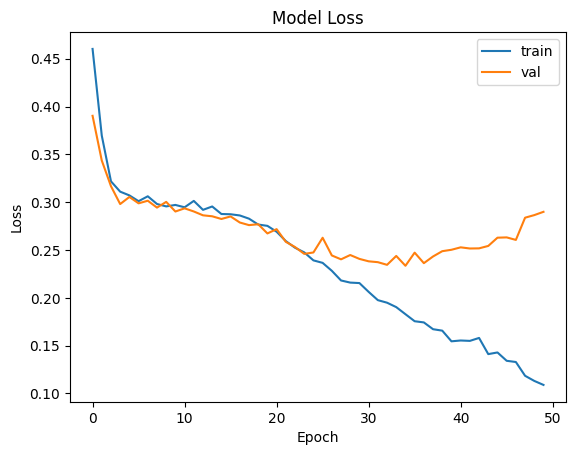

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

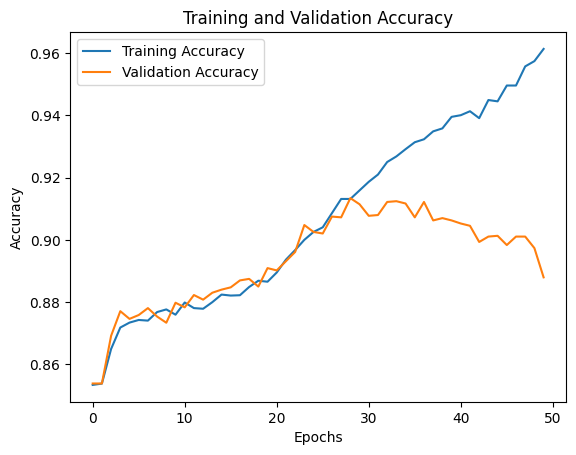

In [ ]:
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
plt.plot(accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_2 (Embedding)         │ (None, 24, 100)        │     2,071,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 24, 100)        │        80,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling1d_2          │ (None, 100)            │             0 │
│ (GlobalMaxPooling1D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        12,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,351,573 (8.97 MB)

 Trainable params: 93,457 (365.07 KB)

 Non-trainable params: 2,071,200 (7.90 MB)

 Optimizer params: 186,916 (730.14 KB)

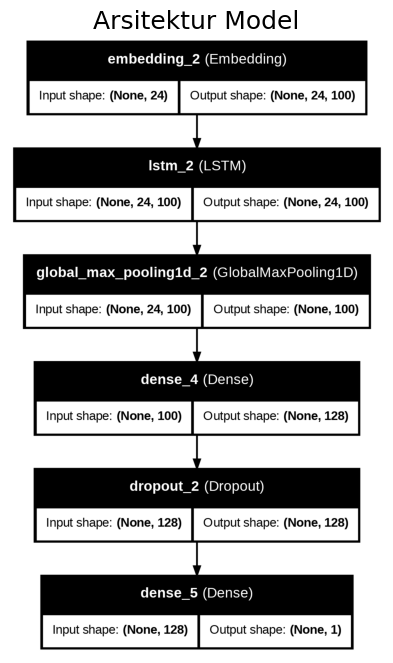

In [ ]:
from keras.utils import plot_model
file_name = 'arsitektur_model.png'
plot_model(model, to_file=file_name, show_shapes=True, show_layer_names=True)
plt.figure(figsize=(8,8))
img = plt.imread(file_name)
plt.imshow(img)
plt.title('Arsitektur Model', fontsize=18)
plt.axis('off')
plt.savefig(file_name)
plt.show()

In [ ]:
from sklearn.metrics import classification_report
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
report = classification_report(y_val, y_pred_classes)
print("Classification Report:")
print(report)

127/127 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.85      1.00      0.92      3451
           1       0.00      0.00      0.00       591

    accuracy                           0.85      4042
   macro avg       0.43      0.50      0.46      4042
weighted avg       0.73      0.85      0.79      4042



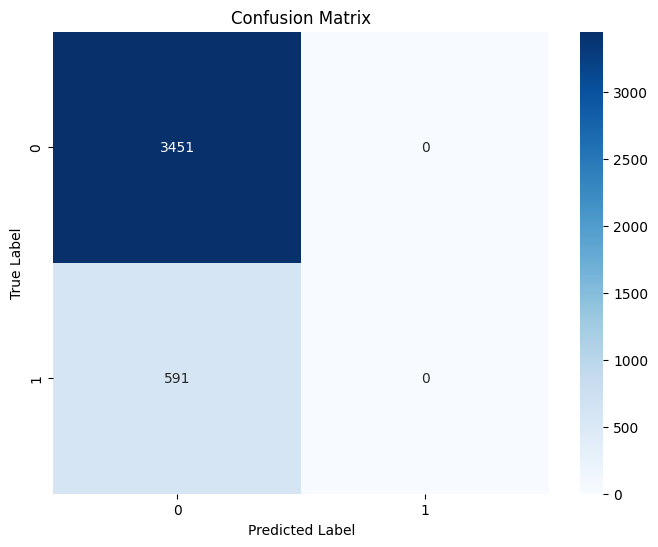

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
cm = confusion_matrix(y_val, y_pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
model.save("model_Amazon_Product_Reviews.h5")
word2vec_model.save("word2vec_model.model")
train_df.to_csv("train_data.csv", index=False)

NameError: name 'train_df' is not defined

###### [Denemeler 0 ın öğrenmesi o geldiği için yapıldı](#b2)

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weights_dict = {i : class_weights[i] for i in range(len(class_weights))}

model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=50, class_weight=class_weights_dict)


Epoch 1/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - accuracy: 0.8543 - loss: 0.3336 - val_accuracy: 0.7756 - val_loss: 0.4651
Epoch 2/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - accuracy: 0.8863 - loss: 0.2743 - val_accuracy: 0.7680 - val_loss: 0.5310
Epoch 3/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step - accuracy: 0.9294 - loss: 0.2049 - val_accuracy: 0.7889 - val_loss: 0.4667
Epoch 4/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step - accuracy: 0.9353 - loss: 0.1925 - val_accuracy: 0.7886 - val_loss: 0.5145
Epoch 5/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step - accuracy: 0.9554 - loss: 0.1389 - val_accuracy: 0.7927 - val_loss: 0.5285
Epoch 6/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step - accuracy: 0.9706 - loss: 0.1073 - val_accuracy: 0.8050 - val_loss: 0.5483
Epoch 7/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9819 - loss: 0.0785 - val_accuracy: 0.7978 - val_loss: 0.5897
Epoch 8/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step - accuracy: 0.9856 - loss: 0.0622 - 

In [ ]:
loss, accuracy = model.evaluate(X_val, y_val, verbose=0)
print(f'Test Accuracy: {accuracy*100:.2f}%')


Test Accuracy: 80.19%


In [ ]:
from sklearn.metrics import classification_report
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
report = classification_report(y_val, y_pred_classes)
print("Classification Report:")
print(report)

92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.49      1.00      0.65      1423
           1       0.00      0.00      0.00      1500

    accuracy                           0.49      2923
   macro avg       0.24      0.50      0.33      2923
weighted avg       0.24      0.49      0.32      2923



In [ ]:
import numpy as np

y_pred_probs = model.predict(X_val)
print("Tahmin ortalaması:", np.mean(y_pred_probs))
print("0.5'ten büyük kaç tane tahmin var:", np.sum(y_pred_probs > 0.5))


92/92 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step
Tahmin ortalaması: 0.5227914
0.5'ten büyük kaç tane tahmin var: 1535


In [ ]:
print(np.unique(y_train))  # [0 1] olmalı
print(y_train[:10])        # Sayılar olmalı, liste değil


[0 1]
[0 1 0 1 1 1 1 1 1 0]


In [ ]:
print(embedding_matrix.shape)
# input_dim=embedding_matrix.shape[0] ile tokenizer.num_words eşleşiyor mu?


(10791, 100)


In [ ]:
print(X_train.shape, y_train.shape)


(6818, 53) (6818,)


In [ ]:
print("Etiket tipi:", y_train.dtype)
print("Eşsiz etiketler:", np.unique(y_train))


Etiket tipi: int64
Eşsiz etiketler: [0 1]


In [ ]:
y_pred_probs = model.predict(X_val)
print("Tahmin ortalaması:", np.mean(y_pred_probs))
print("0.5 üstü kaç tane:", np.sum(y_pred_probs > 0.5))


92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step
Tahmin ortalaması: 0.5227914
0.5 üstü kaç tane: 1535


# [3. USAirPrePro3 sütununa göre](#b1)

* ## [Kütüphanelerin Yüklenmesi ve Veri Seti İşlemleri](#b1)

###### [1.Kütüphaneler yüklenmesi](#b1)

In [ ]:
# Gerekli kütüphaneleri belirtilen versiyonlarda kur
!pip install --upgrade --no-cache-dir numpy==1.26.4 scipy==1.13.1 gensim==4.3.3 pandas==2.2.2 tensorflow==2.18.0 tensorflow-text==2.18.1 tf-keras==2.18.0 tensorflow-decision-forests==1.11.0


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.stem.porter import *
nltk.download('gutenberg')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
nltk.download('punkt_tab')

from nltk.tokenize import TweetTokenizer
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import datetime

from scipy import stats
from scipy.sparse import hstack, csr_matrix
from sklearn.model_selection import train_test_split, cross_val_score

from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams

import string
import gensim
from gensim.models.phrases import Phraser, Phrases
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
pd.set_option('max_colwidth',400)
from bs4 import BeautifulSoup
import re

from tqdm import tqdm
from bokeh.io import output_notebook, output_file
from bokeh.plotting import show, figure
%matplotlib inline
from collections import defaultdict

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Unzipping corpora/gutenberg.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


In [ ]:
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")

In [ ]:
# Gerekli kütüphaneler
from keras.utils import to_categorical
import random
from sklearn.model_selection import train_test_split
from keras.preprocessing import sequence
from tensorflow.keras.preprocessing.text import Tokenizer

#from keras.preprocessing.text import Tokenizer
from keras.layers import Dense, Dropout, Embedding, LSTM
from keras.callbacks import EarlyStopping
from keras.losses import categorical_crossentropy
from keras.optimizers import Adam
from keras.models import Sequential


In [ ]:
"""from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM
from tensorflow.keras.callbacks import EarlyStopping"""


'from tensorflow.keras.preprocessing.text import Tokenizer\nfrom tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM\nfrom tensorflow.keras.callbacks import EarlyStopping'

In [ ]:
import tensorflow as tf
print(tf.__version__)


2.18.0


######[Dosyanın Yüklenmesi ve veri setinin incelenmesi](#b1)

In [ ]:
warnings.filterwarnings('ignore')
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Bitirme/Datasets/
#df=pd.read_csv("Loan.csv",index_col=0)


""" # Yeni Bir dosya kaydetme koddunu buraya yazıyoruz
PreprocessedSon2_df_file_path = '/content/drive/My Drive/Bitirme/Datasets/PreprocessedSon2_df.csv'
df.to_csv(PreprocessedSon2_df_file_path, index=False)"""


Mounted at /content/drive
/content/drive/My Drive/Bitirme/Datasets


" # Yeni Bir dosya kaydetme koddunu buraya yazıyoruz\nPreprocessedSon2_df_file_path = '/content/drive/My Drive/Bitirme/Datasets/PreprocessedSon2_df.csv'\ndf.to_csv(PreprocessedSon2_df_file_path, index=False)"

In [ ]:
"""
Kaggle API ile yükleme
import numpy as np
import pandas as pd
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'"""

"\nKaggle API ile yükleme\nimport numpy as np\nimport pandas as pd\nimport os\nfor dirname, _, filenames in os.walk('/kaggle/input'):\n    for filename in filenames:\n        print(os.path.join(dirname, filename))\nos.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'"

In [ ]:
# Veri setini yükle
file_path = '/content/drive/My Drive/Bert/USAir_df.csv'
file_path2 = '/content/drive/My Drive/Bert/USAir_balanced_df.csv'
file_path3 = '/content/drive/My Drive/Bitirme/Datasets/twitter_racism_parsed_dataset.csv'
file_path4 = '/content/drive/My Drive/Bitirme/Datasets/PreprocessedSon3_2output_df.csv'
file_path5 = '/content/drive/My Drive/Bitirme/Datasets/Racism_PreprocessedSon_df.csv'

df = pd.read_csv(file_path5, encoding='latin1', header=None)
#df = pd.read_csv(file_path5, index_col=0)
#df = pd.read_csv(file_path4, index_col=0)

# Sütun isimlerini belirle
#df.columns = ['index', 'id','Text','label','score']
df.columns=['Text','label','score', 'hibrit', 'USAirPrePro', 'USAirPrePro2', 'USAirPrePro3','MuammerNLPPrePRro', 'MuammerNLPPrePRro2', 'MuammerNLPPrePRro3', 'MuammerNLPLSTMPrePRro']

# İlk sütunu kontrol edelim
print("Sütun isimleri:", df.columns)

Sütun isimleri: Index(['Text', 'label', 'score', 'hibrit', 'USAirPrePro', 'USAirPrePro2',
       'USAirPrePro3', 'MuammerNLPPrePRro', 'MuammerNLPPrePRro2',
       'MuammerNLPPrePRro3', 'MuammerNLPLSTMPrePRro'],
      dtype='object')


In [ ]:
#df4=pd.read_csv("PreprocessedSon3_df.csv",index_col=0)

In [ ]:
#df3=pd.read_csv("IMDB_df.csv",index_col=0)

In [ ]:
#df2=pd.read_csv("USAir_balanced_df.csv",index_col=0)

In [ ]:
df

,Text,label,score,hibrit,USAirPrePro,USAirPrePro2,USAirPrePro3,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPPrePRro3,MuammerNLPLSTMPrePRro
0,Text,label,score,hibrit,USAirPrePro,USAirPrePro2,USAirPrePro3,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPPrePRro3,MuammerNLPLSTMPrePRro
1,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc,racism,1,aalwuhaib muslim mob violence hindus bangladesh continues islam http co jbwjwurc,aalwuhaib muslim mob violenc hindu bangladesh continu islam,aalwuhaib muslim mob violence hindu bangladesh continues islam,aalwuhaib muslim mob violenc hindu bangladesh continu islam,AAlwuhaib Muslim mob violence against Hindus in Bangladesh continues in Islam http co JBWJwuRc,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc,AAlwuhaib Muslim mob violence against Hindus in Bangladesh continues in Islam http co JBWJwuRc,aalwuhaib muslim mob violenc hindu bangladesh continu islam httptcocjbwjwurc
2,#NULL!,none,0,null,NaN,NaN,NaN,NULL,#NULL!,NULL,NaN
3,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.,racism,1,jncatron isra jourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed,jncatron israjourisra ampalestin islamophobia like idea naziphobia islam religion hate must outlaw,jncatron israjourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed,jncatron israjourisra ampalestin islamophobia like idea naziphobia islam religion hate must outlaw,jncatron isra jourisra AMPalestine Islamophobia is like the idea of Naziphobia Islam is religion of hate and it must be outlawed,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.,jncatron isra jourisra AMPalestine Islamophobia is like the idea of Naziphobia Islam is religion of hate and it must be outlawed,jncatron israjourisra ampalestin islamophobia like idea naziphobia islam religion hate must outlaw
4,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR",none,0,finally caught sudden death cook looks like gonna intense mkr,final im caught sudden death cook look like gon na intens mkr,finally caught sudden death cook look like going intense mkr,final caught sudden death cook look like gon na intens mkr,Finally m all caught up and that sudden death cook off looks like it gonna be intense MKR,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR",Finally m all caught up and that sudden death cook off looks like it gonna be intense MKR,"final 'm caught , sudden death cook look like 's gon na intens mkr"
...,...,...,...,...,...,...,...,...,...,...,...
13467,#mkr NOOOOO!!! I wanted Kat and Andre to lose!!!,none,0,mkr nooooo wanted kat andre lose,mkr nooooo want kat andr lose,mkr nooooo wanted kat andre lose,mkr nooooo want kat andr lose,mkr NOOOOO wanted Kat and Andre to lose,#mkr NOOOOO!!! I wanted Kat and Andre to lose!!!,mkr NOOOOO wanted Kat and Andre to lose,mkr n want kat andr lose
13468,RT @MumtazCeltik: @WhiteHouse @VP \n\n#Kobane \n\n#JeSuisCharlie \n\n'Turkish military says MIT shipped weapons to al-Qaeda'\n@fehimtastekinÃ¢ÂÂºÃ¢ÂÂºhttpÃ¢ÂÂ¦,none,0,rt mumtazceltik whitehouse vp kobane jesuischarlie turkish military says mit shipped weapons al qaeda fehimtastekin http,rt mumtazceltik whitehous vp koban jesuischarli turkish militari say mit ship weapon alqaeda fehimtastekinhttp,rt mumtazceltik whitehouse vp kobane jesuischarlie turkish military say mit shipped weapon alqaeda fehimtastekinhttp,rt mumtazceltik whitehous vp koban jesuischarli turkish militari say mit ship weapon alqaeda fehimtastekinhttp,RT MumtazCeltik WhiteHouse VP Kobane JeSuisCharlie Turkish military says MIT shipped weapons to al Qaeda fehimtastekin http,RT @

In [ ]:
df['score'] = pd.to_numeric(df['score'], errors='coerce')


In [ ]:
#Burda -1 olanlar 0 yapıldı 1 olanlar kaldı
df['score2'] = df['score'].apply(lambda x: x + 1 if x == -1 else x)

In [ ]:
df['score']

,score
1,1.0
2,0.0
3,1.0
4,0.0
5,0.0
...,...
13467,0.0
13468,0.0
13469,0.0
13470,0.0


In [ ]:
df['score2']

KeyError: 'score2'

In [ ]:
#df = df.drop(df.index[0])
df.head()

,Text,label,score,hibrit,USAirPrePro,USAirPrePro2,USAirPrePro3,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPPrePRro3,MuammerNLPLSTMPrePRro,text_length
1,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc,racism,1.0,aalwuhaib muslim mob violence hindus bangladesh continues islam http co jbwjwurc,aalwuhaib muslim mob violenc hindu bangladesh continu islam,aalwuhaib muslim mob violence hindu bangladesh continues islam,aalwuhaib muslim mob violenc hindu bangladesh continu islam,AAlwuhaib Muslim mob violence against Hindus in Bangladesh continues in Islam http co JBWJwuRc,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc,AAlwuhaib Muslim mob violence against Hindus in Bangladesh continues in Islam http co JBWJwuRc,aalwuhaib muslim mob violenc hindu bangladesh continu islam httptcocjbwjwurc,112
2,#NULL!,none,0.0,null,NaN,NaN,NaN,NULL,#NULL!,NULL,NaN,6
3,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.,racism,1.0,jncatron isra jourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed,jncatron israjourisra ampalestin islamophobia like idea naziphobia islam religion hate must outlaw,jncatron israjourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed,jncatron israjourisra ampalestin islamophobia like idea naziphobia islam religion hate must outlaw,jncatron isra jourisra AMPalestine Islamophobia is like the idea of Naziphobia Islam is religion of hate and it must be outlawed,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.,jncatron isra jourisra AMPalestine Islamophobia is like the idea of Naziphobia Islam is religion of hate and it must be outlawed,jncatron israjourisra ampalestin islamophobia like idea naziphobia islam religion hate must outlaw,135
4,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR",none,0.0,finally caught sudden death cook looks like gonna intense mkr,final im caught sudden death cook look like gon na intens mkr,finally caught sudden death cook look like going intense mkr,final caught sudden death cook look like gon na intens mkr,Finally m all caught up and that sudden death cook off looks like it gonna be intense MKR,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR",Finally m all caught up and that sudden death cook off looks like it gonna be intense MKR,"final 'm caught , sudden death cook look like 's gon na intens mkr",95
5,@carolinesinders @herecomesfran *hugs*,none,0.0,carolinesinders herecomesfran hugs,carolinesind herecomesfran hug,carolinesinders herecomesfran hug,carolinesind herecomesfran hug,carolinesinders herecomesfran hugs,@carolinesinders @herecomesfran *hugs*,carolinesinders herecomesfran hugs,carolinesind herecomesfran hug,38


In [ ]:
#df2 = df2.reset_index()

In [ ]:
#gerekmezse çalıştırma
"""df = df.reset_index()
df.isnull().values.any()

df.head()"""

,index,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label
0,1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0
1,2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0
2,3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0
3,4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0
4,5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0


In [ ]:
df.columns

Index(['Text', 'label', 'score', 'hibrit', 'USAirPrePro', 'USAirPrePro2',
       'USAirPrePro3', 'MuammerNLPPrePRro', 'MuammerNLPPrePRro2',
       'MuammerNLPPrePRro3', 'MuammerNLPLSTMPrePRro'],
      dtype='object')

In [ ]:
#df = df.drop(columns=['index'])


In [ ]:
df.shape

(13471, 11)

In [ ]:
print(len(df))

13471


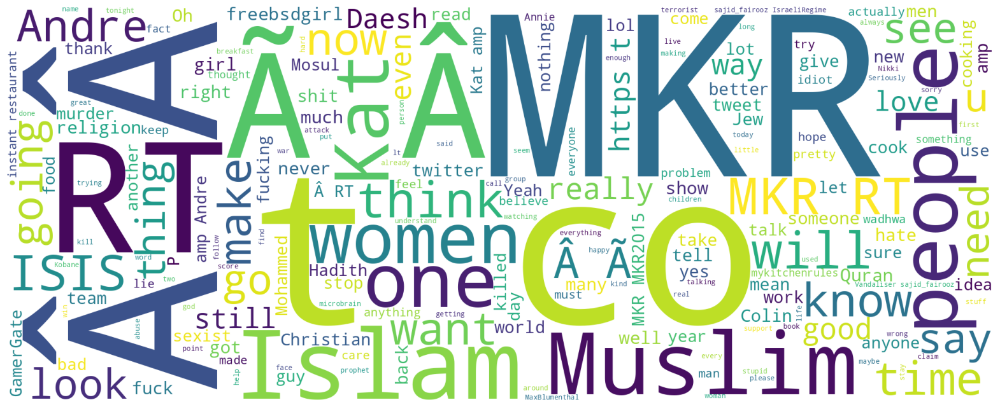

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in df.Text)
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

###### [Veri setinden kullanılacak sütun seçilmesi](#b1)

In [ ]:
df.columns

Index(['Text', 'label', 'score', 'hibrit', 'USAirPrePro', 'USAirPrePro2',
       'USAirPrePro3', 'MuammerNLPPrePRro', 'MuammerNLPPrePRro2',
       'MuammerNLPPrePRro3', 'MuammerNLPLSTMPrePRro'],
      dtype='object')

In [ ]:
#Kullanıacak kolon adi girin sonra çalıştırın. Yukarıdaki kolon isimlerinden seç
secilen_kolon_adi='USAirPrePro2'
secilen_sentiment_kolon_adi='score'
#secilen_kolon_adi='hibrit'
#secilen_kolon_adi='hibrit'

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(13471, 1)

In [ ]:
print(len(df))

13471


In [ ]:
data=df[[secilen_kolon_adi,secilen_sentiment_kolon_adi]]
data=data.reset_index(drop=True)

In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data.head()

,USAirPrePro2,score
1,aalwuhaib muslim mob violence hindu bangladesh continues islam,1.0
2,NaN,0.0
3,jncatron israjourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed,1.0
4,finally caught sudden death cook look like going intense mkr,0.0
5,carolinesinders herecomesfran hug,0.0


In [ ]:
X_df.head()

,USAirPrePro2
1,aalwuhaib muslim mob violence hindu bangladesh continues islam
2,NaN
3,jncatron israjourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed
4,finally caught sudden death cook look like going intense mkr
5,carolinesinders herecomesfran hug


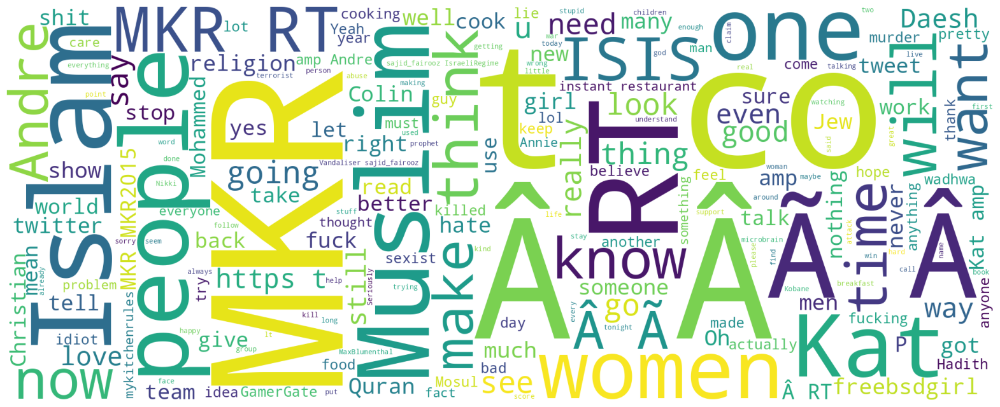

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in df['Text'])
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in x_liste)
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

TypeError: sequence item 1: expected str instance, float found

###### [x ve y değerlerinin belirlenmesi ve train tesst ayrımı](#b1)

In [ ]:
"""secilen_kolon_adi='USAirPrePro2'
secilen_sentiment_kolon_adi='score2'"""

In [ ]:
x = df[secilen_kolon_adi]
x

,USAirPrePro2
1,aalwuhaib muslim mob violence hindu bangladesh continues islam
2,NaN
3,jncatron israjourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed
4,finally caught sudden death cook look like going intense mkr
5,carolinesinders herecomesfran hug
...,...
13467,mkr nooooo wanted kat andre lose
13468,rt mumtazceltik whitehouse vp kobane jesuischarlie turkish military say mit shipped weapon alqaeda fehimtastekinhttp
13469,glad proper competition starting even happier colin back mkr
13470,worry pete manu take time need fact feel free fuck right prefer colin mkr


In [ ]:
y = df[secilen_sentiment_kolon_adi]
y

,score
1,1.0
2,0.0
3,1.0
4,0.0
5,0.0
...,...
13467,0.0
13468,0.0
13469,0.0
13470,0.0


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
x

,USAirPrePro2
1,aalwuhaib muslim mob violence hindu bangladesh continues islam
2,NaN
3,jncatron israjourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed
4,finally caught sudden death cook look like going intense mkr
5,carolinesinders herecomesfran hug
...,...
13467,mkr nooooo wanted kat andre lose
13468,rt mumtazceltik whitehouse vp kobane jesuischarlie turkish military say mit shipped weapon alqaeda fehimtastekinhttp
13469,glad proper competition starting even happier colin back mkr
13470,worry pete manu take time need fact feel free fuck right prefer colin mkr


####  [keşifsel veri analizi için deneme](#b1)


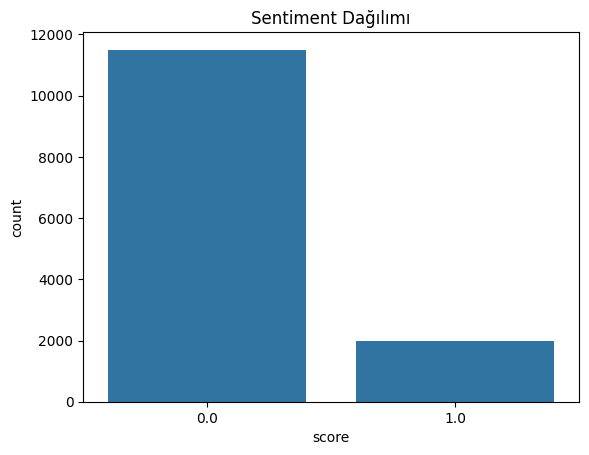

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.countplot(x='score', data=df)
plt.title("Sentiment Dağılımı")
plt.show()

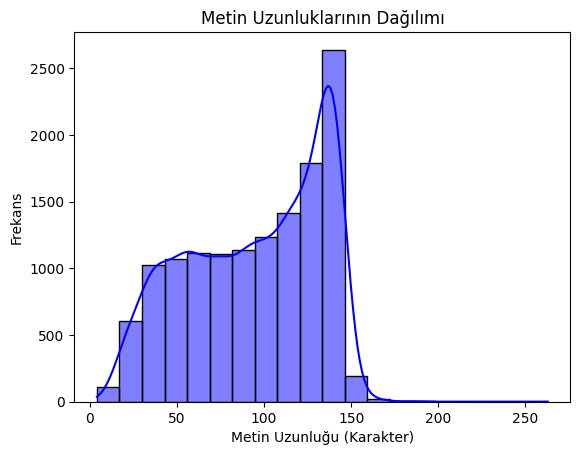

In [ ]:
df['text_length'] = df['Text'].apply(len)
sns.histplot(df['text_length'], bins=20, kde=True, color='blue')
plt.title("Metin Uzunluklarının Dağılımı")
plt.xlabel("Metin Uzunluğu (Karakter)")
plt.ylabel("Frekans")
plt.show()

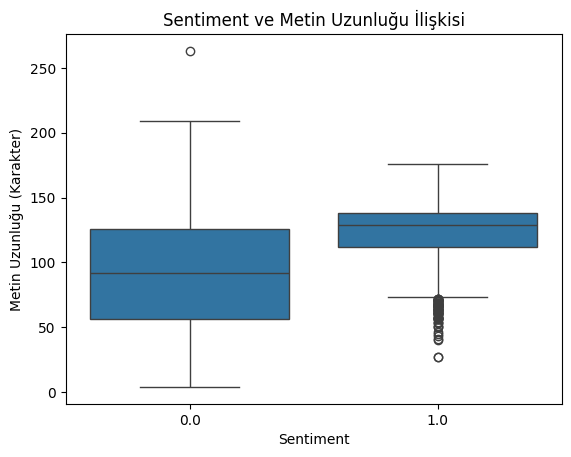

In [ ]:
# Sentiment bazında metin uzunluklarının dağılımı
sns.boxplot(x='score', y='text_length', data=df)
plt.title("Sentiment ve Metin Uzunluğu İlişkisi")
plt.xlabel("Sentiment")
plt.ylabel("Metin Uzunluğu (Karakter)")
plt.show()

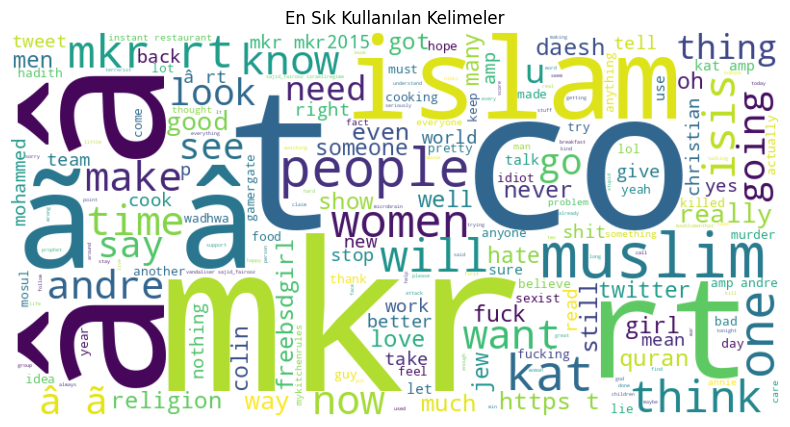

In [ ]:
from collections import Counter
from wordcloud import WordCloud

# Tüm metinleri birleştirerek kelimeleri say
all_words = " ".join(df['Text']).lower().split()
word_counts = Counter(all_words)

# En sık kullanılan kelimeleri görselleştirme
wordcloud = WordCloud(width=800, height=400, background_color="white").generate(" ".join(all_words))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("En Sık Kullanılan Kelimeler")
plt.show()

In [ ]:
# Pozitif, negatif ve nötr metinleri ayırma
positive_text = " ".join(df[df['score'] == '1']['Text']).lower()
negative_text = " ".join(df[df['score'] == '-1']['Text']).lower()
neutral_text = " ".join(df[df['score'] == '0']['Text']).lower()

In [ ]:
# Pozitif, negatif ve nötr metinleri ayırma
positive_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 1][secilen_kolon_adi]).lower()
negative_text = " ".join(df[df[secilen_sentiment_kolon_adi] == -1][secilen_kolon_adi]).lower()
neutral_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 0][secilen_kolon_adi]).lower()

TypeError: sequence item 0: expected str instance, float found

In [ ]:
positive_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 1.0][secilen_kolon_adi].astype(str)).lower()
negative_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 0.0][secilen_kolon_adi].astype(str)).lower()


In [ ]:
# Pozitif, negatif metinleri ayırma
positive_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 1.0][secilen_kolon_adi]).lower()
negative_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 0.0][secilen_kolon_adi]).lower()


TypeError: sequence item 0: expected str instance, float found

In [ ]:
positive_text

'aalwuhaib muslim mob violence hindu bangladesh continues islam jncatron israjourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed huffpostrelig islam invaded conquered christiandom christian crusade response writer liar semzyxx approve pedophile prophet raping year old girl like say hadith watan geekyzekey problem vile muslim try rationalize excuse crime islam rather get rid ammaawah jmt following religion ignorance illiterate prophet want talk spelling lol hahellyer true stoning beheading much mohammed taste abunaseeha told tribe yet daughter would become whore sexual jihad madasahatter buttercupashby furthermore telling people tolerant wholly intolerant religion idiotic ummsuhaym logicalmind quran would good example terrorism rt iammgraham called islamophobe saying islam need theological reformation head egypt agrees rezarahman basically claiming religion teach hatred murder nothing hatred murder dumb nndabbour better problem hinduism christianity 

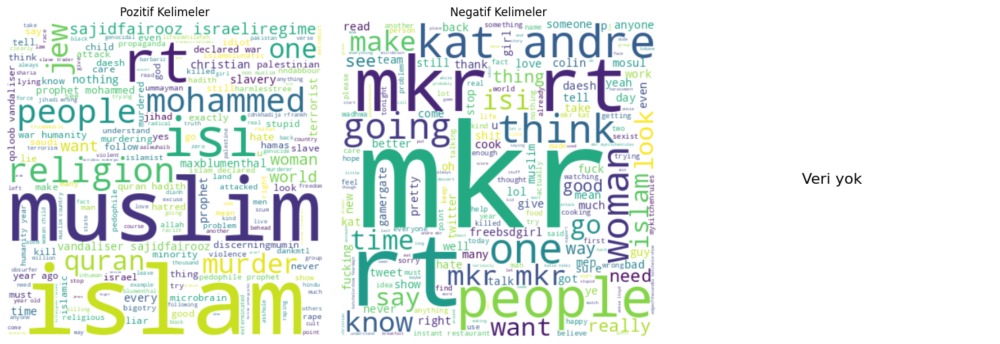

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Pozitif kelimeler
if positive_text.strip():
    axes[0].imshow(WordCloud(width=400, height=400, background_color="white").generate(positive_text), interpolation="bilinear")
    axes[0].set_title("Pozitif Kelimeler")
else:
    axes[0].text(0.5, 0.5, 'Veri yok', horizontalalignment='center', verticalalignment='center', fontsize=16)
axes[0].axis("off")

# Negatif kelimeler
if negative_text.strip():
    axes[1].imshow(WordCloud(width=400, height=400, background_color="white").generate(negative_text), interpolation="bilinear")
    axes[1].set_title("Negatif Kelimeler")
else:
    axes[1].text(0.5, 0.5, 'Veri yok', horizontalalignment='center', verticalalignment='center', fontsize=16)
axes[1].axis("off")

# Nötr kelimeler (örnek)
if neutral_text.strip():
    axes[2].imshow(WordCloud(width=400, height=400, background_color="white").generate(neutral_text), interpolation="bilinear")
    axes[2].set_title("Nötr Kelimeler")
else:
    axes[2].text(0.5, 0.5, 'Veri yok', horizontalalignment='center', verticalalignment='center', fontsize=16)
axes[2].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

# Bigram oluşturma
vectorizer = CountVectorizer(ngram_range=(2, 2), max_features=20, stop_words='english')
bigrams = vectorizer.fit_transform(df[secilen_kolon_adi])
bigram_df = pd.DataFrame(bigrams.toarray(), columns=vectorizer.get_feature_names_out())

# En sık kullanılan bigramları görselleştirme
bigram_counts = bigram_df.sum().sort_values(ascending=False)
sns.barplot(x=bigram_counts.values, y=bigram_counts.index)
plt.title("En Sık Kullanılan Bigramlar")
plt.xlabel("Frekans")
plt.show()

ValueError: np.nan is an invalid document, expected byte or unicode string.

* ## [TF_IDF](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [KNN](#svm)
    * #### [LOGISTIC REG](#log)


#####[Dosya en başta yüklenmişse](#b2)

######Kütüphanelerin Yüklenmesi

In [ ]:
pip install keras

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.stem.porter import *
nltk.download('gutenberg')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

from nltk.tokenize import TweetTokenizer
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import datetime

from scipy import stats
from scipy.sparse import hstack, csr_matrix
from sklearn.model_selection import train_test_split, cross_val_score

from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams

import string
import gensim
from gensim.models.phrases import Phraser, Phrases
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
pd.set_option('max_colwidth',400)
from bs4 import BeautifulSoup
import re

from tqdm import tqdm
from bokeh.io import output_notebook, output_file
from bokeh.plotting import show, figure
%matplotlib inline
from collections import defaultdict

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Package gutenberg is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [ ]:
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from tensorflow.keras.utils import to_categorical
import random
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.losses import categorical_crossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential


###### [Dosyanın yüklenmesi](#p2)

In [ ]:
#dirve da kullanacaksanız buras şart yoksa yorum satırına alınız
warnings.filterwarnings('ignore')

from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Bil482/
"""da db .csv nini yüklü olduğu klasör"""


Mounted at /content/drive
/content/drive/My Drive/Bil482


'da db .csv nini yüklü olduğu klasör'

In [ ]:
df=pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

###### [Veri setinin incelenmesi](#p2)

In [ ]:
df.isnull().values.any()

df.head(10)

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0
6,"SREI Infra is moving sideways: Ashwani Gujral, Market Strategist","[""['sir', 'infra', 'move', 'sideways', 'washwoman', 'inaugural', 'marker', 'strategist']""]",64,srei infra moving sideways ashwani gujral market strategist,srei infra move sideway ashwani gujral market strategist,srei infra moving sideways ashwani gujral market strategist,SREI Infra is moving sideways Ashwani Gujral Market Strategist,"SREI Infra is moving sideways: Ashwani Gujral, Market Strategist","srei infra move sideway ashwani gujral , market strategist",-1,0,0
7,Sweet sugar turns bitter for mill owners in 2014,"[""['sweet', 'sugar', 'turn', 'bitter', 'mill', 'owner', '2014']""]",48,sweet sugar turns bitter mill owners,sweet sugar turn bitter mill owner,sweet sugar turn bitter mill owner,Sweet sugar turns bitter for mill owners in,Sweet sugar turns bitter for mill owners in 2014,sweet sugar turn bitter mill owner,-1,0,0
8,Foreign investors navigate turmoil in Chinese markets with new playbook,"[""['fo reign', 'investor', 'navigable', 'turmoil', 'Chinese', 'market', 'no', 'playbook']""]",71,foreign investors navigate turmoil chinese markets new playbook,foreign investor navig turmoil chines market new playbook,foreign investor navigate turmoil chinese market new playbook,Foreign investors navigate turmoil in Chinese markets with new playbook,Foreign investors navigate turmoil in Chinese markets with new playbook,foreign investor navig turmoil chines market new playbook,-1,0,0
9,NIF may turn co-plaintiff in Modern India suit against NSEL,"[""['nigh', 'be', 'ten', 'co plaintiff', 'modern', 'India', 'soot', 'noel']""]",59,nif may turn co plaintiff modern india suit nsel,nif may turn coplaintiff modern india suit nsel,nif may turn coplaintiff modern india suit nsel,NIF may turn co plaintiff in Modern India suit against NSEL,NIF may turn co-plaintiff in Modern India suit against NSEL,nif may turn coplaintiff modern india suit nsel,-1,0,0
10,NIF may turn co-plaintiff in Modern India suit against NSEL,"[""['nigh', 'be', 'ten', 'co plaintiff', 'modern', 'India', 'soot', 'noel']""]",59,ni

<Axes: xlabel='score', ylabel='count'>

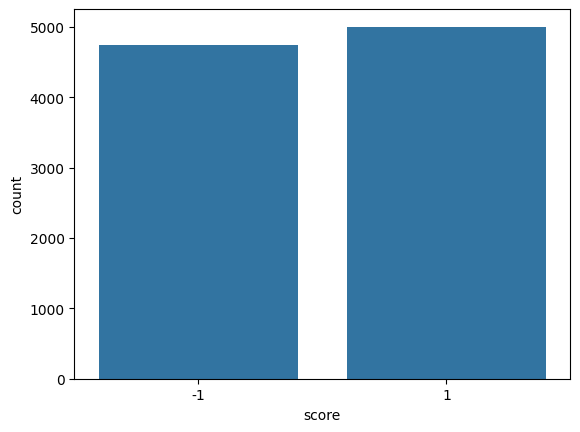

In [ ]:
import seaborn as sns
sns.countplot(x='score', data=df)

In [ ]:
df.shape

(9741, 12)

In [ ]:
print(len(df))

9741


#####[Dosya en başta yüklenmişse](#b2)

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
df.columns

Index(['Text', 'label', 'score', 'hibrit', 'USAirPrePro', 'USAirPrePro2',
       'USAirPrePro3', 'MuammerNLPPrePRro', 'MuammerNLPPrePRro2',
       'MuammerNLPPrePRro3', 'MuammerNLPLSTMPrePRro', 'text_length'],
      dtype='object')

In [ ]:
#secilen_kolon_adi="hibrit"
#secilen_sentiment_kolon_adi="score"

In [ ]:
# NaN içeren satırları sil
df = df.dropna(subset=[secilen_kolon_adi])

# Eğitim ve test setlerine ayır
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    df["TEXT"], df["label"], test_size=0.2, random_state=42
)


In [ ]:
df = df.dropna(subset=[secilen_kolon_adi])

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(13437, 1)

In [ ]:
print(len(df))

13471


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data

,USAirPrePro2,score
1,aalwuhaib muslim mob violence hindu bangladesh continues islam,1.0
3,jncatron israjourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed,1.0
4,finally caught sudden death cook look like going intense mkr,0.0
5,carolinesinders herecomesfran hug,0.0
6,please please start using discernment blunted steroid mean drug dead,0.0
...,...,...
13467,mkr nooooo wanted kat andre lose,0.0
13468,rt mumtazceltik whitehouse vp kobane jesuischarlie turkish military say mit shipped weapon alqaeda fehimtastekinhttp,0.0
13469,glad proper competition starting even happier colin back mkr,0.0
13470,worry pete manu take time need fact feel free fuck right prefer colin mkr,0.0


###### [Veri Ön işleme ](#b2)

In [ ]:
def preprocess_text(sen):
    # Removing html tags
    sentence = remove_tags(sen)

    # Remove punctuations and numbers
    sentence = re.sub('[^a-zA-Z]', ' ', sentence)

    # Single character removal
    sentence = re.sub(r"\s+[a-zA-Z]\s+", ' ', sentence)

    # Removing multiple spaces
    sentence = re.sub(r'\s+', ' ', sentence)

    return sentence

In [ ]:
TAG_RE = re.compile(r'<[^>]+>')

def remove_tags(text):
    return TAG_RE.sub('', text)

In [ ]:
df['Comment']=df['Text'].apply(str)

In [ ]:
X = []
sentences = list(df['Comment'])
for sen in sentences:
    X.append(preprocess_text(sen))

In [ ]:
y = df['score2']

In [ ]:
y.shape

(9741,)

In [ ]:
y_liste

,score2
1,0
2,0
3,0
4,0
5,0
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
x

,Text
1,"At Wipro, growth remains a mirage"
2,Why Chinese stocks leave US investors vulnerable
3,US stocks finish mixed amid more tech selling
4,Opec reduces estimate on oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza
...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation ."
9738,Wockhardt story is really intriguing: Deven Choksey
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .
9740,"Operating profit was EUR 24.5 mn , up from EUR 23.0 mn ."


In [ ]:
X #Büyük X

['At Wipro growth remains mirage',
 'Why Chinese stocks leave US investors vulnerable',
 'US stocks finish mixed amid more tech selling',
 'Opec reduces estimate on oil demand growth',
 'Immediate support for rupee is placed at Bonanza',
 'SREI Infra is moving sideways Ashwani Gujral Market Strategist',
 'Sweet sugar turns bitter for mill owners in ',
 'Foreign investors navigate turmoil in Chinese markets with new playbook',
 'NIF may turn co plaintiff in Modern India suit against NSEL',
 'NIF may turn co plaintiff in Modern India suit against NSEL',
 'Stock Buzz Sun Pharma may face resistance at current levels',
 'Investors should be wary of cyclicals even if Narendra Modi wins',
 'Markets will move sideways before next upside starts Ashwani Gujral',
 'Stock markets to see cautious trading amid elections IIP data Report',
 'Be cautious on amount of stock you buy into BEML Devang Visaria',
 'Immediate resistance for Reliance is around levels Mileen Vasudeo Angel Broking',
 ' Sahara in

###### %30-70

In [ ]:
  #X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
#df['score'] = df['score'].astype(int)
y = [int(val) for val in y]

In [ ]:
  X_train, X_test, y_train, y_test = train_test_split(x_liste, y_liste, test_size=0.30, random_state=42)

In [ ]:
df

,Text,label,score,hibrit,USAirPrePro,USAirPrePro2,USAirPrePro3,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPPrePRro3,MuammerNLPLSTMPrePRro,text_length
1,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc,racism,1.0,aalwuhaib muslim mob violence hindus bangladesh continues islam http co jbwjwurc,aalwuhaib muslim mob violenc hindu bangladesh continu islam,aalwuhaib muslim mob violence hindu bangladesh continues islam,aalwuhaib muslim mob violenc hindu bangladesh continu islam,AAlwuhaib Muslim mob violence against Hindus in Bangladesh continues in Islam http co JBWJwuRc,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc,AAlwuhaib Muslim mob violence against Hindus in Bangladesh continues in Islam http co JBWJwuRc,aalwuhaib muslim mob violenc hindu bangladesh continu islam httptcocjbwjwurc,112
3,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.,racism,1.0,jncatron isra jourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed,jncatron israjourisra ampalestin islamophobia like idea naziphobia islam religion hate must outlaw,jncatron israjourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed,jncatron israjourisra ampalestin islamophobia like idea naziphobia islam religion hate must outlaw,jncatron isra jourisra AMPalestine Islamophobia is like the idea of Naziphobia Islam is religion of hate and it must be outlawed,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.,jncatron isra jourisra AMPalestine Islamophobia is like the idea of Naziphobia Islam is religion of hate and it must be outlawed,jncatron israjourisra ampalestin islamophobia like idea naziphobia islam religion hate must outlaw,135
4,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR",none,0.0,finally caught sudden death cook looks like gonna intense mkr,final im caught sudden death cook look like gon na intens mkr,finally caught sudden death cook look like going intense mkr,final caught sudden death cook look like gon na intens mkr,Finally m all caught up and that sudden death cook off looks like it gonna be intense MKR,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR",Finally m all caught up and that sudden death cook off looks like it gonna be intense MKR,"final 'm caught , sudden death cook look like 's gon na intens mkr",95
5,@carolinesinders @herecomesfran *hugs*,none,0.0,carolinesinders herecomesfran hugs,carolinesind herecomesfran hug,carolinesinders herecomesfran hug,carolinesind herecomesfran hug,carolinesinders herecomesfran hugs,@carolinesinders @herecomesfran *hugs*,carolinesinders herecomesfran hugs,carolinesind herecomesfran hug,38
6,"Please, PLEASE start using ""is your discernment blunted by steroids"" to mean ""are you on DRUGS?"" from now on. DEAD",none,0.0,please please start using discernment blunted steroids mean drugs dead,pleas pleas start use discern blunt steroid mean drug dead,please please start using discernment blunted steroid mean drug dead,plea plea start use discern blunt steroid mean drug dead,Please PLEASE start using is your discernment blunted by steroids to mean are you on DRUGS from now on DEAD,"Please, PLEASE start using ""is your discernment blunted by steroids"" to mean ""are you on DRUGS?"" from now on. DEAD",Please PLEASE start using is your discernment blunted by steroids to mean are you on DRUGS from now on DEAD,"pleas , pleas start use discern blunt steroid mean drug dead",114
...,...,...,...,...,...,...,...,...,...,...,...,...
13467,#mkr NOOOOO!!! I wanted Kat and Andre to lose!!!,none,0.0,mkr nooooo wanted kat andre lose,mkr nooooo want kat andr lose,mkr nooooo wanted kat andr

In [ ]:
x_liste

,USAirPrePro2
1,aalwuhaib muslim mob violence hindu bangladesh continues islam
3,jncatron israjourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed
4,finally caught sudden death cook look like going intense mkr
5,carolinesinders herecomesfran hug
6,please please start using discernment blunted steroid mean drug dead
...,...
13467,mkr nooooo wanted kat andre lose
13468,rt mumtazceltik whitehouse vp kobane jesuischarlie turkish military say mit shipped weapon alqaeda fehimtastekinhttp
13469,glad proper competition starting even happier colin back mkr
13470,worry pete manu take time need fact feel free fuck right prefer colin mkr


---
<a id="p1"></a>
###### TF-IDF

In [ ]:
#feature extraction with Tf-idf vectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(max_features=10000)
train_vectors = vectorizer.fit_transform(X_train)
test_vectors = vectorizer.transform(X_test)
print(train_vectors.shape, test_vectors.shape)

(9405, 10000) (4032, 10000)


In [ ]:
print(test_vectors)

  (0, 4102)	0.27636878256069364
  (0, 4162)	0.5846440137105214
  (0, 7165)	0.5846440137105214
  (0, 8149)	0.392906568116549
  (0, 9753)	0.29262173402141367
  (1, 23)	0.37430322581814024
  (1, 1500)	0.3673992262305419
  (1, 1856)	0.24785238220067274
  (1, 2653)	0.35142470267593184
  (1, 3911)	0.19676696543337496
  (1, 4416)	0.40534744731682903
  (1, 4974)	0.19257565080356284
  (1, 8292)	0.42350715275764345
  (1, 9746)	0.34715601282778863
  (2, 147)	0.35997817070372196
  (2, 1221)	0.35997817070372196
  (2, 3243)	0.3103284875521186
  (2, 7100)	0.3678313575162565
  (2, 7194)	0.38983429080953363
  (2, 7996)	0.31265733991898365
  (2, 8431)	0.27040981038628714
  (2, 8543)	0.19522238753436358
  (2, 8624)	0.24529178924614206
  (2, 9520)	0.29681822881932424
  (3, 440)	0.48583251400201344
  :	:
  (4028, 5447)	0.36974927687351666
  (4028, 5469)	0.4028374389310501
  (4028, 6945)	0.46399859499361923
  (4028, 9653)	0.387688146534673
  (4028, 9951)	0.41297156327492945
  (4029, 945)	0.3162288520415897


In [ ]:
y_train = [int(val) for val in y_train]
y_test = [int(val) for val in y_test]


<a id="nb"></a>
###### NB

In [ ]:
#use ML algorithms classifier
#use a Naive Bayes Classifier and train the model on the training set.
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(train_vectors, y_train)

In [ ]:
#test the performance of our model on the test set to predict the sentiment labels
from  sklearn.metrics  import accuracy_score
predicted_NB = clf.predict(test_vectors)
print("Naive Bayes Accuracy Score -> ", accuracy_score(y_test,predicted_NB)*100)


Naive Bayes Accuracy Score ->  89.88095238095238


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predicted_NB))

              precision    recall  f1-score   support

         0.0       0.90      0.98      0.94      3443
         1.0       0.82      0.40      0.53       589

    accuracy                           0.90      4032
   macro avg       0.86      0.69      0.74      4032
weighted avg       0.89      0.90      0.88      4032



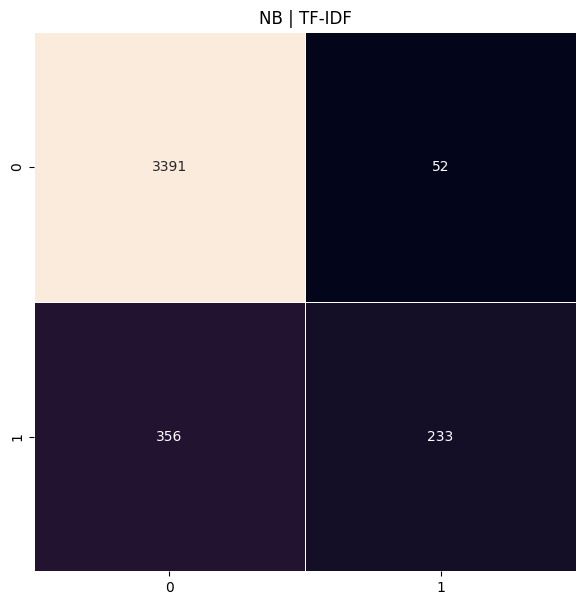

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predicted_NB)
plt.figure(figsize=(7,7))
plt.title("NB | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

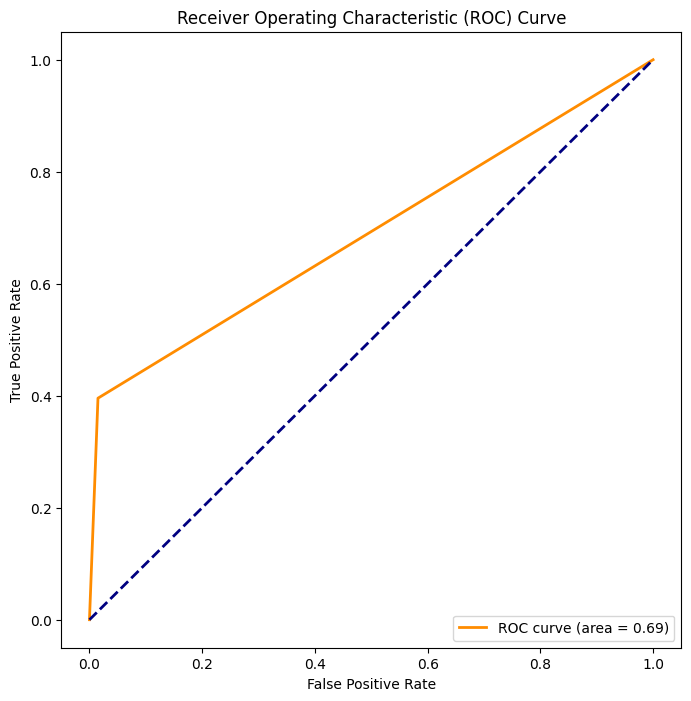

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

predicted_NB= predicted_NB.astype(int)
y_test = y_test.astype(int)
# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predicted_NB)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


<a id="svm"></a>
###### SVM  

In [ ]:
from sklearn.svm import LinearSVC
l2_norm = 2
l2_norm_inverse = 1/l2_norm
maximum_iterations=4000 #maximum number of iterations
svm = LinearSVC(C=l2_norm_inverse,max_iter=maximum_iterations) #create support vector machine model

SVM=svm.fit(train_vectors,y_train)
import numpy as np
#y_true = np.array(y_true).astype(int)

# predict the labels on validation dataset
predictions_SVM = SVM.predict(test_vectors)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  92.48511904761905


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_SVM))

              precision    recall  f1-score   support

           0       0.95      0.97      0.96      3443
           1       0.78      0.67      0.72       589

    accuracy                           0.92      4032
   macro avg       0.86      0.82      0.84      4032
weighted avg       0.92      0.92      0.92      4032



In [ ]:
y_test.head(500)

,score
9059,0
13004,1
3833,0
11039,0
1502,0
...,...
1620,0
9708,0
11156,1
6868,0


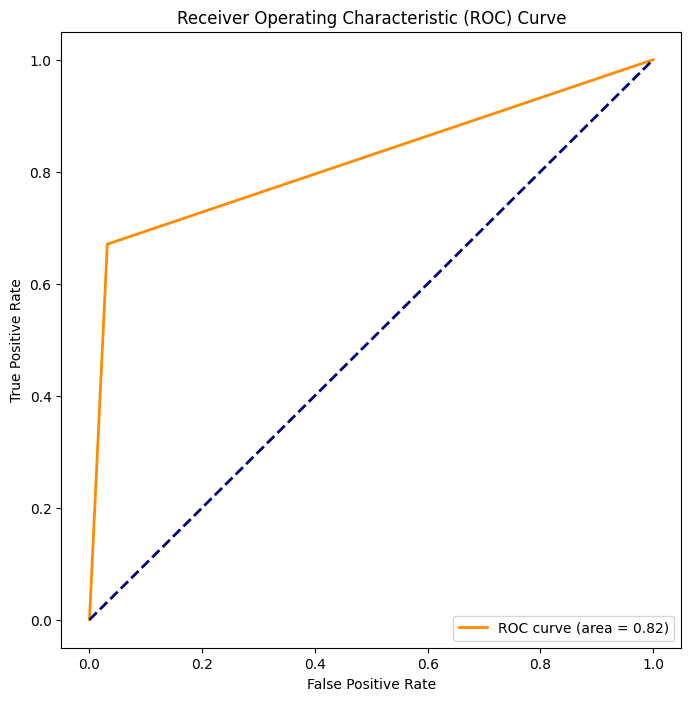

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

predictions_SVM= predictions_SVM.astype(int)
y_test = y_test.astype(int)
# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_SVM)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


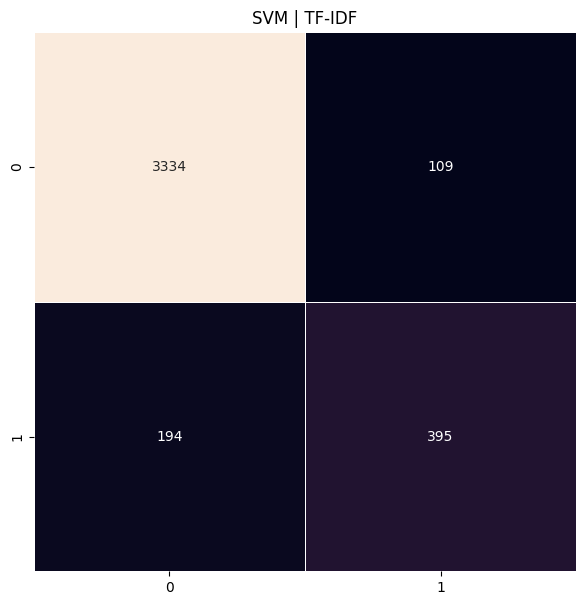

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_SVM)
plt.figure(figsize=(7,7))
plt.title("SVM | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


<a id="log"></a>
###### Log Reg

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
log_reg = linear_model.LogisticRegression()

y_train = [int(val) for val in y_train]
y_test = [int(val) for val in y_test]
log_reg.fit(train_vectors,y_train)
predictions_log = log_reg.predict(test_vectors)
print("Logistic Regression Accuracy Score -> ",accuracy_score(predictions_log, y_test)*100)

Logistic Regression Accuracy Score ->  91.26984126984127


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_log))

              precision    recall  f1-score   support

           0       0.93      0.98      0.95      3443
           1       0.79      0.55      0.65       589

    accuracy                           0.91      4032
   macro avg       0.86      0.76      0.80      4032
weighted avg       0.91      0.91      0.91      4032



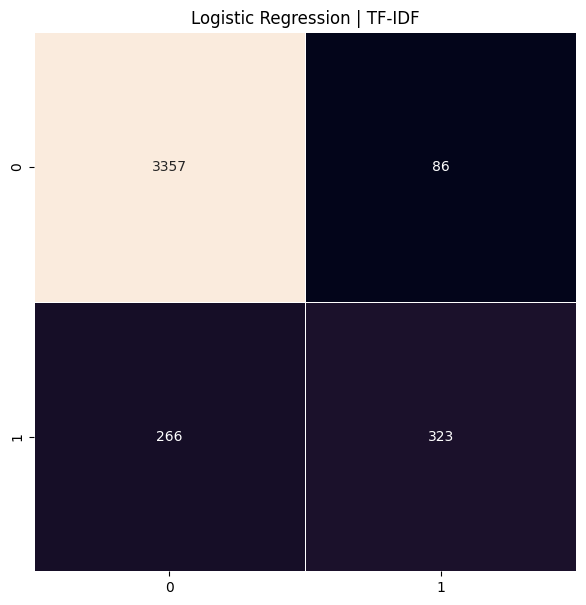

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_log)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

In [ ]:
y_test

[0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,


In [ ]:
predictions_log

array([0, 0, 0, ..., 0, 0, 0])

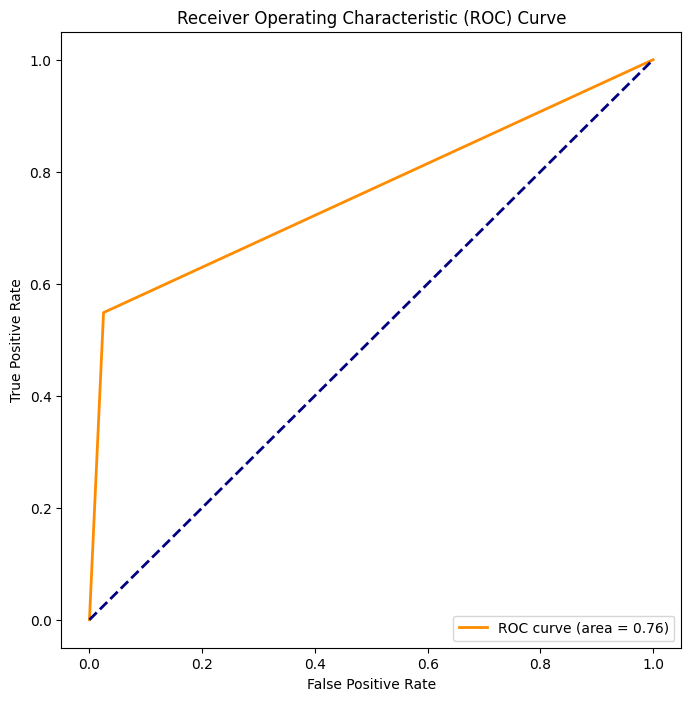

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

predictions_log= predictions_log.astype(int)
y_train = [int(val) for val in y_train]
y_test = [int(val) for val in y_test]
# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_log)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


<a id="knn"></a>
###### KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
number_of_neigbors = 5
minkowski_power = 2 # Manhattan Distance = 1, Euclidean Distance = 2
knn = KNeighborsClassifier(n_neighbors=number_of_neigbors, p =minkowski_power)
model_knn=knn.fit(train_vectors, y_train)
predictions_knn = model_knn.predict(test_vectors)
predictions_knn= predictions_knn.astype(int)
y_train = [int(val) for val in y_train]
y_test = [int(val) for val in y_test]
# Use accuracy_score function to get the accuracy
print("KNN Accuracy Score -> ",accuracy_score(predictions_knn, y_test)*100)





KNN Accuracy Score ->  85.68948412698413


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_knn))

              precision    recall  f1-score   support

           0       0.86      1.00      0.92      3443
           1       0.69      0.04      0.07       589

    accuracy                           0.86      4032
   macro avg       0.77      0.52      0.50      4032
weighted avg       0.83      0.86      0.80      4032



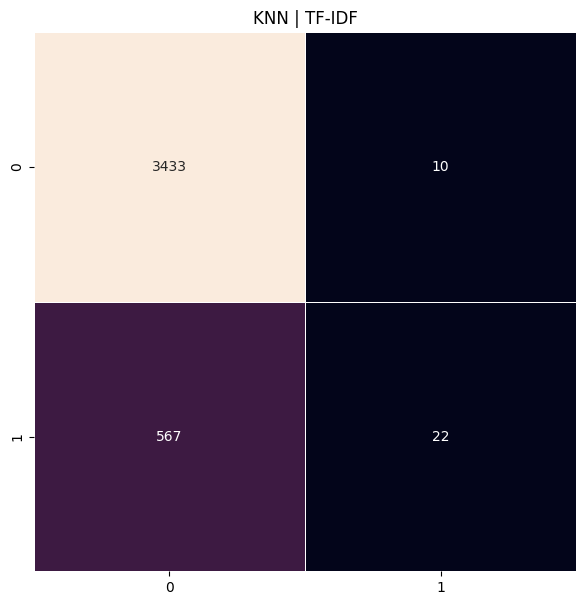

In [ ]:

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_knn)
plt.figure(figsize=(7,7))
plt.title("KNN | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

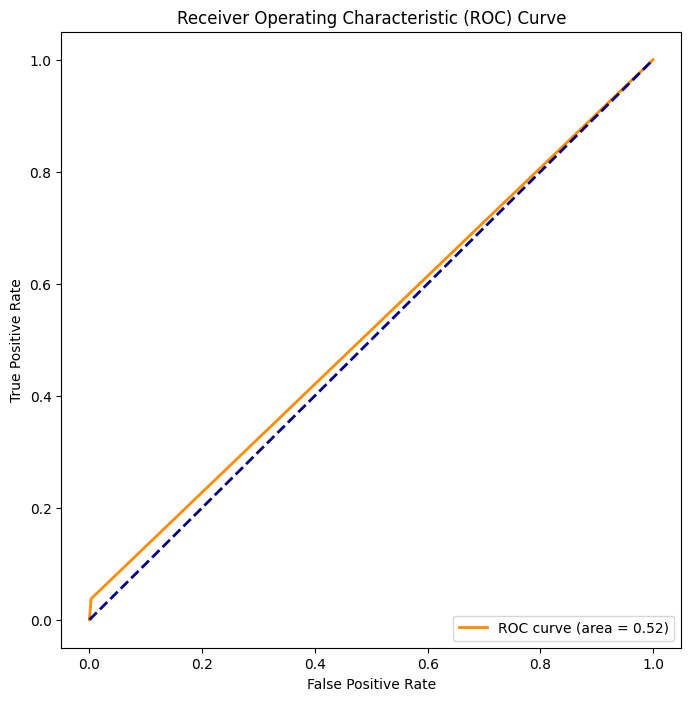

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_knn)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


###### Decision tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

# Decision Tree sınıflandırıcısını tanımla
tree_clf = DecisionTreeClassifier()

# Modeli eğit
tree_clf.fit(train_vectors, y_train)

# Test verileri üzerinde tahmin yap
predictions_tree = tree_clf.predict(test_vectors)

predictions_tree= predictions_tree.astype(int)
y_train = [int(val) for val in y_train]
y_test = [int(val) for val in y_test]
# Doğruluk skorunu hesapla ve yazdır
print("Decision Tree Accuracy Score -> ", accuracy_score(predictions_tree, y_test) * 100)


Decision Tree Accuracy Score ->  91.17063492063492


In [ ]:
from sklearn.metrics import classification_report

# Sınıflandırma raporunu yazdır
print(classification_report(y_test, predictions_tree))


              precision    recall  f1-score   support

           0       0.95      0.95      0.95      3443
           1       0.70      0.69      0.70       589

    accuracy                           0.91      4032
   macro avg       0.82      0.82      0.82      4032
weighted avg       0.91      0.91      0.91      4032



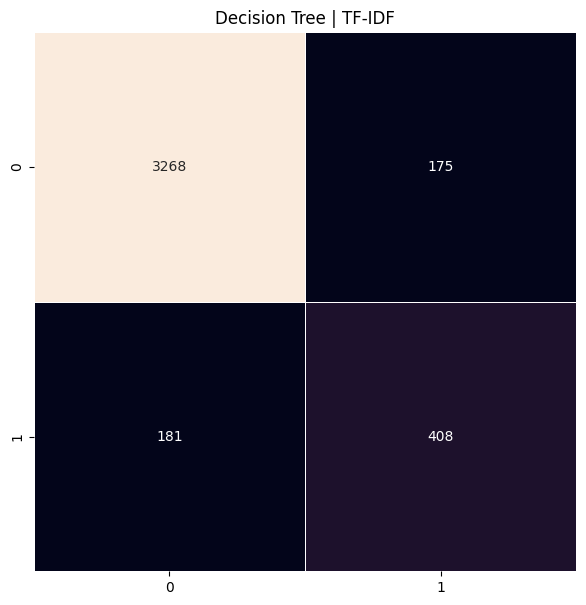

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Karar ağacı modeli için confusion matrix oluştur
cm_tree = confusion_matrix(y_test, predictions_tree)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Decision Tree | TF-IDF")
sns.heatmap(cm_tree, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


######Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Random Forest sınıflandırıcısını tanımla
rf_clf = RandomForestClassifier()

# Modeli eğit
rf_clf.fit(train_vectors, y_train)

# Test verileri üzerinde tahmin yap
predictions_rf = rf_clf.predict(test_vectors)
predictions_rf = predictions_rf.astype(int)
y_train = [int(val) for val in y_train]
y_test = [int(val) for val in y_test]

# Doğruluk skorunu hesapla ve yazdır
print("Random Forest Accuracy Score -> ", accuracy_score(predictions_rf, y_test) * 100)


Random Forest Accuracy Score ->  92.3859126984127


In [ ]:
from sklearn.metrics import classification_report

# Sınıflandırma raporunu yazdır
print(classification_report(y_test, predictions_rf))


              precision    recall  f1-score   support

           0       0.95      0.96      0.96      3443
           1       0.77      0.69      0.73       589

    accuracy                           0.92      4032
   macro avg       0.86      0.83      0.84      4032
weighted avg       0.92      0.92      0.92      4032



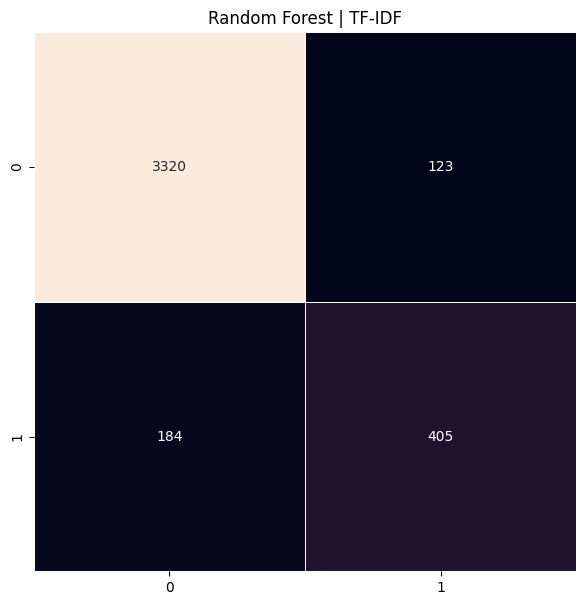

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Random Forest modeli için confusion matrix oluştur
cm_rf = confusion_matrix(y_test, predictions_rf)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Random Forest | TF-IDF")
sns.heatmap(cm_rf, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


* ## [BOW](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [LOGISTIC REG](#log)
    * #### [Decission Tree](#log)
    * #### [Random Forest](#log)
    
    

#####[Dosya en başta yüklenmişse](#b2)

######[Kütüphanelerin yüklenmesi ve test setinin oluşturulması](#b2)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.stem.porter import *
nltk.download('gutenberg')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

from nltk.tokenize import TweetTokenizer
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import datetime

from scipy import stats
from scipy.sparse import hstack, csr_matrix
from sklearn.model_selection import train_test_split, cross_val_score

from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams

import string
import gensim
from gensim.models.phrases import Phraser, Phrases
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
pd.set_option('max_colwidth',400)
from bs4 import BeautifulSoup
import re

from tqdm import tqdm
from bokeh.io import output_notebook, output_file
from bokeh.plotting import show, figure
%matplotlib inline
from collections import defaultdict

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Package gutenberg is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [ ]:
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")

In [ ]:
altta hata oluştu

In [ ]:
from keras.utils import to_categorical
import random
from sklearn.model_selection import train_test_split
from keras.preprocessing import sequence
from keras.preprocessing.text import Tokenizer
from keras.layers import Dense,Dropout,Embedding,LSTM
from keras.callbacks import EarlyStopping
from keras.losses import categorical_crossentropy
from keras.optimizers import Adam
from keras.models import Sequential

ModuleNotFoundError: No module named 'keras.preprocessing.text'

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM
from tensorflow.keras.callbacks import EarlyStopping


In [ ]:
import tensorflow as tf
print(tf.__version__)


2.18.0


In [ ]:
!pip install --upgrade tensorflow keras


In [ ]:
!pip uninstall keras -y
!pip install keras tensorflow


Found existing installation: keras 3.6.0
Uninstalling keras-3.6.0:
  Successfully uninstalled keras-3.6.0
  Using cached keras-3.6.0-py3-none-any.whl.metadata (5.8 kB)
Using cached keras-3.6.0-py3-none-any.whl (1.2 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-keras 2.17.0 requires tensorflow<2.18,>=2.17, but you have tensorflow 2.18.0 which is incompatible.


In [ ]:
!pip install nltk
from nltk.tokenize import word_tokenize


###### [Dosyanın yüklenmesi](#b2)

In [ ]:
warnings.filterwarnings('ignore')
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Eski/Bil482/
df=pd.read_csv("Loan.csv",index_col=0)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/Bil482


In [ ]:
df=pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

In [ ]:
df.isnull().values.any()

df.head()

,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,NumberOfDependents,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,LoanApproved,RiskScore
ApplicationDate,,,,,,,,,,,,,,,,,,,,,
2018-01-01,45,39948,617,Employed,Master,22,13152,48,Married,2,...,3329.000000,0.724972,11,126928,0.199652,0.227590,419.805992,0.181077,0,49.0
2018-01-02,38,39709,628,Employed,Associate,15,26045,48,Single,1,...,3309.083333,0.935132,3,43609,0.207045,0.201077,794.054238,0.389852,0,52.0
2018-01-03,47,40724,570,Employed,Bachelor,26,17627,36,Married,2,...,3393.666667,0.872241,6,5205,0.217627,0.212548,666.406688,0.462157,0,52.0
2018-01-04,58,69084,545,Employed,High School,34,37898,96,Single,1,...,5757.000000,0.896155,5,99452,0.300398,0.300911,1047.506980,0.313098,0,54.0
2018-01-05,37,103264,594,Employed,Associate,17,9184,36,Married,1,...,8605.333333,0.941369,5,227019,0.197184,0.175990,330.179140,0.070210,1,36.0


In [ ]:
df.shape

(20000, 35)

In [ ]:
print(len(df))

20000


In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in df.Text)
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

AttributeError: 'DataFrame' object has no attribute 'Text'

#####[Dosya en başta yüklemişse](#b2)

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
#secilen_kolon_adi="hibrit"

In [ ]:
#secilen_sentiment_kolon_adi="score2"

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(9741, 1)

In [ ]:
print(len(df))

9741


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data

,Text,score
1,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc,1
2,#NULL!,0
3,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.,1
4,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR",0
5,@carolinesinders @herecomesfran *hugs*,0
...,...,...
13467,#mkr NOOOOO!!! I wanted Kat and Andre to lose!!!,0
13468,RT @MumtazCeltik: @WhiteHouse @VP \n\n#Kobane \n\n#JeSuisCharlie \n\n'Turkish military says MIT shipped weapons to al-Qaeda'\n@fehimtastekinÃ¢ÂÂºÃ¢ÂÂºhttpÃ¢ÂÂ¦,0
13469,Glad the proper competition is starting and even happier that Colin is back. #mkr,0
13470,"No worries Pete and Manu, take all the time off you need. In fact, feel free to fuck right off - I prefer Colin #mkr",0


###### [Veri ön işleme](#b2)

In [ ]:
def preprocess_text(sen):
    # Removing html tags
    sentence = remove_tags(sen)

    # Remove punctuations and numbers
    sentence = re.sub('[^a-zA-Z]', ' ', sentence)

    # Single character removal
    sentence = re.sub(r"\s+[a-zA-Z]\s+", ' ', sentence)

    # Removing multiple spaces
    sentence = re.sub(r'\s+', ' ', sentence)

    return sentence

In [ ]:
TAG_RE = re.compile(r'<[^>]+>')

def remove_tags(text):
    return TAG_RE.sub('', text)

In [ ]:
df['Comment']=df['Text'].apply(str)

In [ ]:
X = []
sentences = list(df['Comment'])
for sen in sentences:
    X.append(preprocess_text(sen))

In [ ]:
X

[' AAlwuhaib Muslim mob violence against Hindus in Bangladesh continues in Islam http co JBWJwuRc',
 ' NULL ',
 ' jncatron isra jourisra AMPalestine Islamophobia is like the idea of Naziphobia Islam is religion of hate and it must be outlawed ',
 'Finally m all caught up and that sudden death cook off looks like it gonna be intense MKR',
 ' carolinesinders herecomesfran hugs ',
 'Please PLEASE start using is your discernment blunted by steroids to mean are you on DRUGS from now on DEAD',
 ' aymannathem As soon as ISIS chased all the minorities out of Mosul the Sunni Arabs were happy to steal their property So fuck them ',
 ' Ali Gharib MaxBlumenthal Glad you like it http co ME Nrk xZ',
 ' HuffPostRelig Islam invaded and conquered of Christiandom before any Christian crusades in response The writer is liar ',
 ' semzyxx Do you approve of your pedophile prophet raping year old girl like it says in hadith ',
 ' watan geeky zekey Problem with vile Muslims is that they try to rationalize am

In [ ]:
y = df['oh_label']

KeyError: 'oh_label'

###### %30-70

In [ ]:
x

,USAirPrePro2
1,aalwuhaib muslim mob violence hindu bangladesh continues islam
2,NaN
3,jncatron israjourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed
4,finally caught sudden death cook look like going intense mkr
5,carolinesinders herecomesfran hug
...,...
13467,mkr nooooo wanted kat andre lose
13468,rt mumtazceltik whitehouse vp kobane jesuischarlie turkish military say mit shipped weapon alqaeda fehimtastekinhttp
13469,glad proper competition starting even happier colin back mkr
13470,worry pete manu take time need fact feel free fuck right prefer colin mkr


In [ ]:
y

,score2
1,0
2,0
3,0
4,0
5,0
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x_liste, y_liste, test_size=0.30, random_state=42)

In [ ]:
from sklearn import  preprocessing

In [ ]:
encoder = preprocessing.LabelEncoder()
y_train = encoder.fit_transform(y_train)
y_test = encoder.fit_transform(y_test)

###### BOW

In [ ]:
#feature extraction with Tf-idf vectorizer

#feature extraction with BOW
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(max_features=10000)
vectorizer.fit(X_train)

train_vectors = vectorizer.transform(X_train)
test_vectors = vectorizer.transform(X_test)
print(train_vectors.shape, test_vectors.shape)

(9405, 10000) (4032, 10000)


###### NB

In [ ]:
#use ML algorithms classifier
#use a Naive Bayes Classifier and train the model on the training set.
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(train_vectors, y_train)

In [ ]:
#test the performance of our model on the test set to predict the sentiment labels
from  sklearn.metrics  import accuracy_score
predicted = clf.predict(test_vectors)
print("Naive Bayes Accuracy Score -> ", accuracy_score(y_test,predicted)*100)


Naive Bayes Accuracy Score ->  90.45138888888889


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predicted))

              precision    recall  f1-score   support

           0       0.97      0.92      0.94      3443
           1       0.63      0.84      0.72       589

    accuracy                           0.90      4032
   macro avg       0.80      0.88      0.83      4032
weighted avg       0.92      0.90      0.91      4032



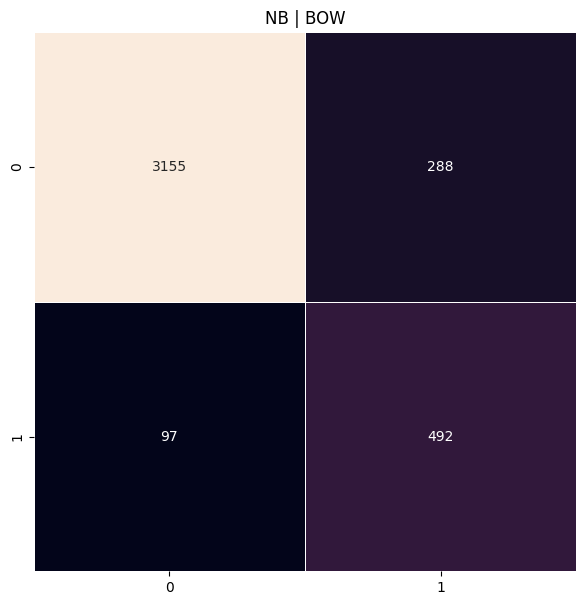

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predicted)
plt.figure(figsize=(7,7))
plt.title("NB | BOW")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### SVM

In [ ]:
from sklearn.svm import LinearSVC
l2_norm = 2
l2_norm_inverse = 1/l2_norm
maximum_iterations=4000
svm = LinearSVC(C=l2_norm_inverse,max_iter=maximum_iterations)
SVM=svm.fit(train_vectors,y_train)

# predict the labels on validation dataset
predictions_SVM = SVM.predict(test_vectors)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  92.33630952380952


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_SVM))

              precision    recall  f1-score   support

           0       0.95      0.96      0.96      3443
           1       0.77      0.68      0.72       589

    accuracy                           0.92      4032
   macro avg       0.86      0.82      0.84      4032
weighted avg       0.92      0.92      0.92      4032



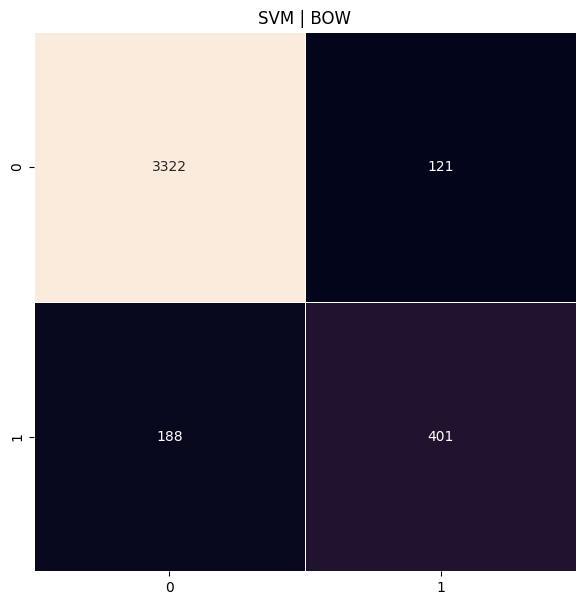

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_SVM)
plt.figure(figsize=(7,7))
plt.title("SVM | BOW")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### LOG REG

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
log_reg = linear_model.LogisticRegression()
log_reg.fit(train_vectors,y_train)
predictions_log = log_reg.predict(test_vectors)
print("Logistic Regression Accuracy Score -> ",accuracy_score(predictions_log, y_test)*100)

Logistic Regression Accuracy Score ->  92.53472222222221


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_log))

              precision    recall  f1-score   support

           0       0.94      0.97      0.96      3443
           1       0.80      0.65      0.72       589

    accuracy                           0.93      4032
   macro avg       0.87      0.81      0.84      4032
weighted avg       0.92      0.93      0.92      4032



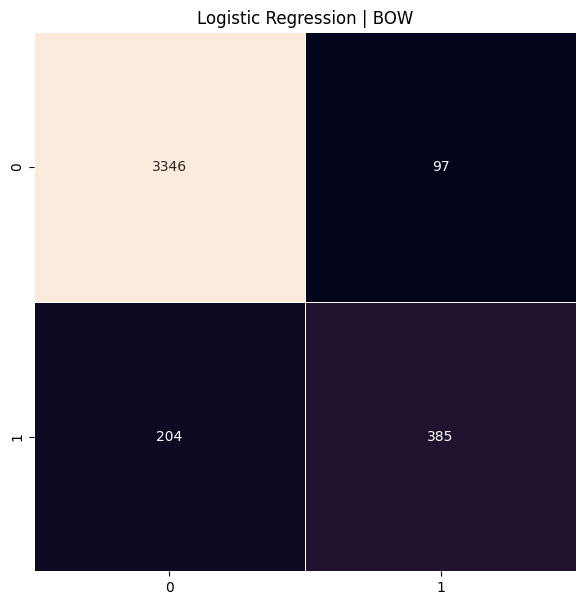

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_log)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | BOW")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### Decission Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
tree_clf = DecisionTreeClassifier()
tree_clf.fit(train_vectors, y_train)
predictions_tree = tree_clf.predict(test_vectors)
print("Decision Tree Accuracy Score -> ", accuracy_score(predictions_tree, y_test) * 100)

Decision Tree Accuracy Score ->  90.8234126984127


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_tree))

              precision    recall  f1-score   support

           0       0.94      0.95      0.95      3443
           1       0.70      0.65      0.67       589

    accuracy                           0.91      4032
   macro avg       0.82      0.80      0.81      4032
weighted avg       0.91      0.91      0.91      4032



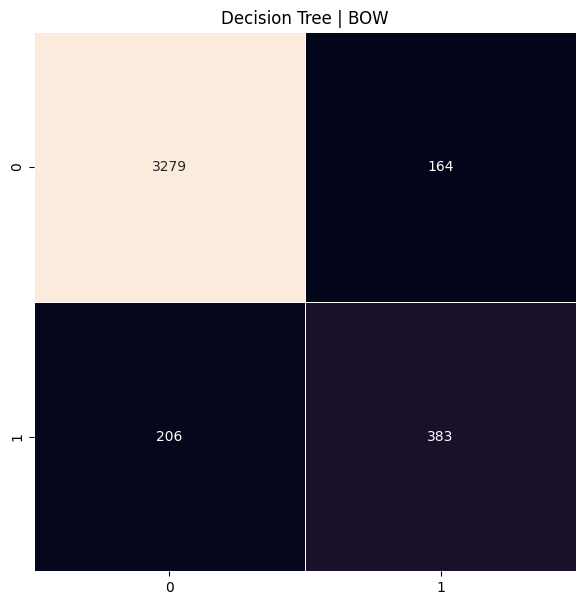

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Karar ağacı modeli için confusion matrix oluştur
cm_tree = confusion_matrix(y_test, predictions_tree)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Decision Tree | BOW")
sns.heatmap(cm_tree, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### Random forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Random Forest sınıflandırıcısını tanımla
rf_clf = RandomForestClassifier()

# Modeli eğit
rf_clf.fit(train_vectors, y_train)

# Test verileri üzerinde tahmin yap
predictions_rf = rf_clf.predict(test_vectors)

# Doğruluk skorunu hesapla ve yazdır
print("Random Forest Accuracy Score -> ", accuracy_score(predictions_rf, y_test) * 100)


Random Forest Accuracy Score ->  92.03869047619048


In [ ]:
from sklearn.metrics import classification_report

# Sınıflandırma raporunu yazdır
print(classification_report(y_test, predictions_rf))

              precision    recall  f1-score   support

           0       0.94      0.97      0.95      3443
           1       0.79      0.62      0.70       589

    accuracy                           0.92      4032
   macro avg       0.86      0.80      0.83      4032
weighted avg       0.92      0.92      0.92      4032



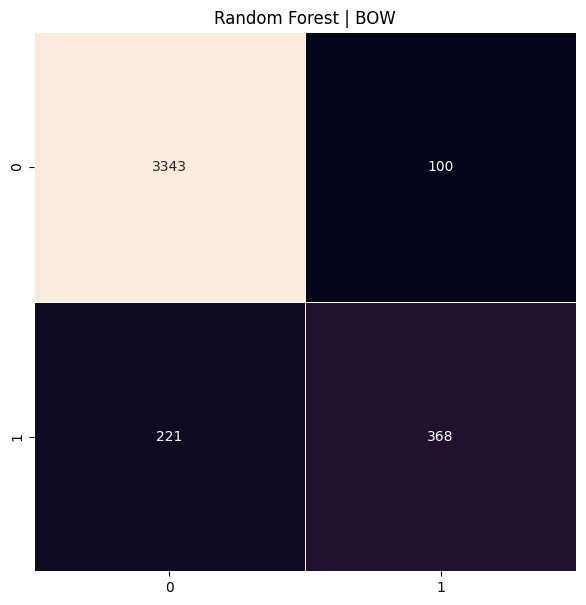

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Random Forest modeli için confusion matrix oluştur
cm_rf = confusion_matrix(y_test, predictions_rf)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Random Forest | BOW")
sns.heatmap(cm_rf, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


* ## [W2V](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [LOGISTIC REG](#log)


#####[Dosya en başta yüklenmemişse](#b2)

###### [Kütüphanelerin eklenmesi](#b2)

> Blok alıntı ekle



In [ ]:
# importing required libraries
import pandas as pd
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import string
import nltk
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

%matplotlib inline

In [ ]:
#dirve da kullanacaksanız buras şart yoksa yorum satırına alınız
warnings.filterwarnings('ignore')

from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Bil482/  #çalışılacak drve dizinni


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[Errno 2] No such file or directory: '/content/drive/My Drive/Bil482/ #çalışılacak drve dizinni'
/content/drive/My Drive/Bil482


'\n\ndata = pd.read_csv("db.csv",index_col=0)\ndata.isnull().values.any()\n\ndata.head()'

In [ ]:
data = pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

In [ ]:
data['Text'].isnull().values.any()

False

In [ ]:
data.head()

,Text,score
1,"At Wipro, growth remains a mirage",-1
2,Why Chinese stocks leave US investors vulnerable,-1
3,US stocks finish mixed amid more tech selling,-1
4,Opec reduces estimate on oil demand growth,-1
5,Immediate support for rupee is placed at 55.10: Bonanza,-1


In [ ]:
data.head()

,Text,score
0,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc,1
1,#NULL!,0
2,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.,1
3,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR",0
4,@carolinesinders @herecomesfran *hugs*,0


In [ ]:
data.shape

(9741, 2)

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
import gensim

In [ ]:
data['Text'] = data['Text'].values.astype('U')
"""data['Text'] = data['Comment'].values.astype('U')"""

"data['Text'] = data['Comment'].values.astype('U')"

In [ ]:
data['Text'].head()

,Text
1,"At Wipro, growth remains a mirage"
2,Why Chinese stocks leave US investors vulnerable
3,US stocks finish mixed amid more tech selling
4,Opec reduces estimate on oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza


#####[Dosya en başta yüklenmemişse](#b2)

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
#secilen_kolon_adi="hibrit"
#secilen_sentiment_kolon_adi="score2"

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(13471, 1)

In [ ]:
print(len(df))

13471


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data

,hibrit,score
1,aalwuhaib muslim mob violence hindus bangladesh continues islam http co jbwjwurc,1.0
2,null,0.0
3,jncatron isra jourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed,1.0
4,finally caught sudden death cook looks like gonna intense mkr,0.0
5,carolinesinders herecomesfran hugs,0.0
...,...,...
13467,mkr nooooo wanted kat andre lose,0.0
13468,rt mumtazceltik whitehouse vp kobane jesuischarlie turkish military says mit shipped weapons al qaeda fehimtastekin http,0.0
13469,glad proper competition starting even happier colin back mkr,0.0
13470,worries pete manu take time need fact feel free fuck right prefer colin mkr,0.0


In [ ]:
data_size=data.shape[0]
data_size

13437

###### [**Word Embeddings**](#b2)
1. Word2Vec Embeddings

- 100 dim,
- cbow

In [ ]:
tokenized_tweet = data[secilen_kolon_adi].head(data_size).apply(lambda x: x.split()) # tokenizing

model_w2v = gensim.models.Word2Vec(
            tokenized_tweet,
            vector_size=100,
            window=5, # context window size
            min_count=2,
            sg = 0, # 1 for skip-gram model
            hs = 0,
            negative = 10, # for negative sampling
            workers= 2, # no.of cores
            seed = 34)

model_w2v.train(tokenized_tweet, total_examples= len(data[secilen_kolon_adi]), epochs=20)

(1936752, 2283560)

In [ ]:
tokenized_tweet


,USAirPrePro2
1,"[aalwuhaib, muslim, mob, violence, hindu, bangladesh, continues, islam]"
3,"[jncatron, israjourisra, ampalestine, islamophobia, like, idea, naziphobia, islam, religion, hate, must, outlawed]"
4,"[finally, caught, sudden, death, cook, look, like, going, intense, mkr]"
5,"[carolinesinders, herecomesfran, hug]"
6,"[please, please, start, using, discernment, blunted, steroid, mean, drug, dead]"
...,...
13467,"[mkr, nooooo, wanted, kat, andre, lose]"
13468,"[rt, mumtazceltik, whitehouse, vp, kobane, jesuischarlie, turkish, military, say, mit, shipped, weapon, alqaeda, fehimtastekinhttp]"
13469,"[glad, proper, competition, starting, even, happier, colin, back, mkr]"
13470,"[worry, pete, manu, take, time, need, fact, feel, free, fuck, right, prefer, colin, mkr]"


In [ ]:
tokenized_tweet.shape

(13437,)

In [ ]:
null_count = 0
from contextlib import nullcontext

# Örnek bir tokenized_tweet listesi oluşturalım
tokenized_tweet = [{"Text": "#NULL!"}, {"Text": "some_text"}, {"Text": "#NULL!"}]

# Sözlük olup olmadığını kontrol edelim ve "Text" anahtarının varlığını kontrol edelim
for tweet in tokenized_tweet:
    if isinstance(tweet, dict) and "Text" in tweet:
        if tweet["Text"] == '#NULL!':
            null_count += 1

print(null_count)


2


In [ ]:
def word_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v[word].reshape((1, size))
            count += 1.
        except KeyError: # handling the case where the token is not in vocabulary

            continue
    if count != 0:
        vec /= count
    return vec

In [ ]:
# Assuming 'model_w2v' is the Word2Vec model you trained earlier
def get_tweet_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v.wv[word].reshape((1, size))
            count += 1.
        except KeyError:  # handling the case where the word is not in the vocabulary
            continue
    if count != 0:
        vec /= count
    return vec

#wordvec_arrays = np.zeros((len(tokenized_tweet), 100))

In [ ]:
"""for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape"""

(3, 100)

In [ ]:
# Assuming 'model_w2v' is the Word2Vec model you trained earlier
def get_tweet_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v.wv[word].reshape((1, size))
            count += 1.
        except KeyError:  # handling the case where the word is not in the vocabulary
            continue
    if count != 0:
        vec /= count
    return vec

wordvec_arrays = np.zeros((len(tokenized_tweet), 100))

"""for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape
"""

'for i in range(len(tokenized_tweet)):\n    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)\n\nwordvec_df = pd.DataFrame(wordvec_arrays)\nwordvec_df.shape\n'

In [ ]:
for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape

(3, 100)

In [ ]:
print("tokenized_tweet:", len(tokenized_tweet))
print("wordvec_df:", wordvec_df.shape)
print("data['score']:", len(data[secilen_sentiment_kolon_adi]))

tokenized_tweet: 3
wordvec_df: (3, 100)
data['score']: 13437


In [ ]:
# 1. Tüm veriyi tokenize et (buradaki 'text' sütunun adı sana bağlı)
tokenized_tweet = [str(text).split() for text in data[secilen_kolon_adi]]  # veya kendi tokenizer'ın varsa kullan

# 2. Word2Vec modelini oluştur
from gensim.models import Word2Vec
model_w2v = Word2Vec(sentences=tokenized_tweet, vector_size=100, window=5, min_count=2)

# 3. Ortalama vektör fonksiyonu (seninkini aynen kullanıyoruz)
def get_tweet_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v.wv[word].reshape((1, size))
            count += 1.
        except KeyError:
            continue
    if count != 0:
        vec /= count
    return vec

# 4. Tüm tweet'leri vektöre çevir
wordvec_arrays = np.zeros((len(tokenized_tweet), 100))
for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)

# 5. Etiketlerle aynı uzunlukta mı kontrol et
print(wordvec_df.shape)         # (13471, 100) olmalı
print(len(data[secilen_kolon_adi]))       # 13471 olmalı


(13437, 100)
13437


In [ ]:
wordvec_df

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,-0.258918,0.405671,-0.009492,0.193506,0.207155,-0.530386,0.056077,0.697169,-0.214184,-0.217117,...,0.335026,0.286903,0.052812,0.174081,0.483243,0.136511,0.159579,-0.567001,0.203760,-0.032813
1,-0.306829,0.451242,0.015324,0.211119,0.221998,-0.622556,0.081779,0.825445,-0.239005,-0.279134,...,0.416306,0.341972,0.057785,0.204545,0.570065,0.175704,0.201946,-0.645547,0.255122,0.000940
2,-0.364961,0.450310,0.084005,0.213472,0.222560,-0.715541,0.130348,0.988616,-0.252099,-0.382184,...,0.510860,0.405569,0.060508,0.230418,0.686967,0.245847,0.249186,-0.706013,0.320921,0.083451
3,-0.027028,0.038986,0.010965,0.014884,0.017425,-0.043440,-0.000291,0.063864,-0.022071,-0.030331,...,0.035729,0.025908,-0.002194,0.015324,0.041446,0.011804,0.019299,-0.051048,0.017978,0.002142
4,-0.228196,0.321842,0.027283,0.151953,0.160779,-0.465793,0.066525,0.620284,-0.173563,-0.229704,...,0.316810,0.260785,0.040044,0.154123,0.430337,0.142146,0.150766,-0.475442,0.196819,0.022456
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13432,-0.349546,0.260192,0.173742,0.073238,0.112250,-0.588887,0.173709,0.899948,-0.166023,-0.415084,...,0.490944,0.367355,0.026322,0.130640,0.647528,0.288920,0.241173,-0.531035,0.347318,0.192235
13433,-0.256994,0.369811,0.024805,0.173197,0.186500,-0.523049,0.067491,0.686808,-0.194400,-0.247932,...,0.346104,0.285612,0.042599,0.175227,0.473736,0.158560,0.166994,-0.535477,0.208181,0.012119
13434,-0.297475,0.368526,0.067235,0.169439,0.185586,-0.582798,0.105787,0.804579,-0.202771,-0.314949,...,0.417631,0.327379,0.047446,0.189463,0.561669,0.202635,0.201050,-0.579208,0.258951,0.061090
13435,-0.384293,0.499028,0.071942,0.231914,0.245620,-0.760046,0.123582,1.028279,-0.267479,-0.393860,...,0.531485,0.424406,0.063620,0.249242,0.716377,0.254698,0.253449,-0.765745,0.325208,0.059024


**2. Doc2Vec Embedding**

- 100 dim,


###### [Train test split](#b2)

In [ ]:

from sklearn.model_selection import train_test_split

train_w2v = wordvec_df.iloc[:150000, :]
test_w2v = wordvec_df.iloc[150000:, :]
#xtrain_w2v, xvalid_w2v, ytrain, yvalid = train_test_split(train_w2v, data['score'],random_state=42,test_size=0.3)
"""
# Splitting data into training and validation set
xtrain_w2v, xvalid_w2v, ytrain, yvalid = train_test_split(train_w2v, data['BinaryNumTarget'],random_state=42,test_size=0.2)
"""
xtrain_w2v, xvalid_w2v, ytrain, yvalid = train_test_split(train_w2v, data[secilen_sentiment_kolon_adi],random_state=42,test_size=0.3)


In [ ]:
test_w2v.shape

(0, 100)

In [ ]:
print(type(ytrain))
print(ytrain.head())

<class 'pandas.core.series.Series'>
6610    0.0
2516    0.0
6236    0.0
6934    0.0
2475    0.0
Name: score, dtype: float64


In [ ]:
yvalid.head()

,score
9059,0.0
13004,1.0
3833,0.0
11039,0.0
1502,0.0


In [ ]:
yvalid.shape

(4032,)

In [ ]:
ytrain

,score
6610,0.0
2516,0.0
6236,0.0
6934,0.0
2475,0.0
...,...
5208,0.0
13453,0.0
5407,1.0
866,0.0


In [ ]:
ytrain.shape

(9405,)

In [ ]:
y_train = [int(val) for val in y_train]
y_test = [int(val) for val in y_test]

###### [**1. Logistic Regression**](#b2)
xtrain_w2v, xvalid_w2v, ytrain, yvalid

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
log_reg = linear_model.LogisticRegression()
log_reg.fit(xtrain_w2v,y_train)
predictions_log = log_reg.predict(xvalid_w2v)
print("Logistic Regression Accuracy Score -> ",accuracy_score(predictions_log, y_test)*100)

Logistic Regression Accuracy Score ->  87.97123015873017


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
lreg = linear_model.LogisticRegression()

In [ ]:
lreg.fit(xtrain_w2v, ytrain)

LogisticRegression()

In [ ]:
from sklearn.metrics import f1_score

# Olasılık tahmini
prediction = lreg.predict_proba(xvalid_w2v)

# Eşik değeri uygulayarak ikili sınıflandırma
prediction_LR_int = (prediction[:, 1] >= 0.3).astype(int)

# Etiketleri integer'a dönüştür (örneğin: "0" -> 0, "1" -> 1)
yvalid_int = [int(label) for label in yvalid]

# F1 skoru hesapla
f1_score_result = f1_score(yvalid_int, prediction_LR_int)
print("F1 Score:", f1_score_result)


F1 Score: 0.6030927835051546


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_LR_int))

              precision    recall  f1-score   support

           0       0.93      0.93      0.93      3443
           1       0.61      0.60      0.60       589

    accuracy                           0.89      4032
   macro avg       0.77      0.77      0.77      4032
weighted avg       0.88      0.89      0.88      4032



In [ ]:
f1_score(yvalid_int, prediction_LR_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, prediction_LR_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.8848438355993824

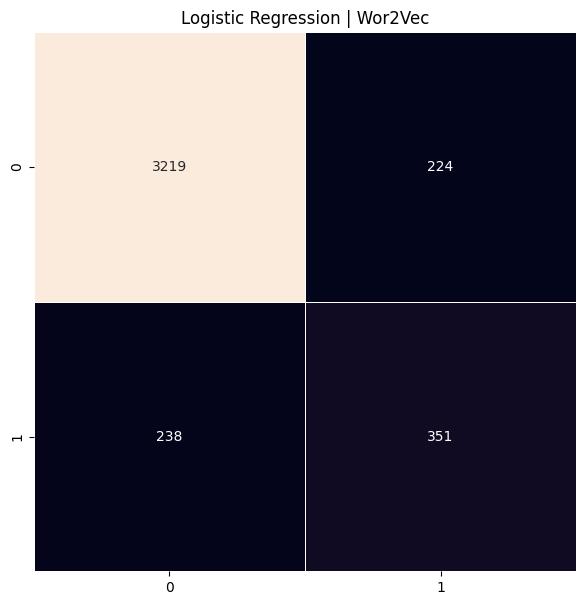

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, prediction_LR_int)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | Wor2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### [**2. Support Vector Machine**](#b2)

In [ ]:
from sklearn import svm


In [ ]:
from sklearn.svm import LinearSVC
l2_norm = 2
l2_norm_inverse = 1/l2_norm
maximum_iterations=4000
svm = LinearSVC(C=l2_norm_inverse,max_iter=maximum_iterations)
SVM=svm.fit(xtrain_w2v,y_train)

# predict the labels on validation dataset
predictions_SVM = SVM.predict(xvalid_w2v)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  88.83928571428571


In [ ]:
import numpy as np
from sklearn import svm
from sklearn.metrics import f1_score

svc = svm.SVC(kernel='linear', C=1, probability=True).fit(xtrain_w2v, ytrain)

prediction = svc.predict_proba(xvalid_w2v)
prediction_int = prediction[:, 1] >= 0.3
prediction_SVM_int = prediction_int.astype(int)
f1_score(yvalid_int, prediction_SVM_int)


0.6497890295358649

In [ ]:
f1_score(yvalid_int, prediction_SVM_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, prediction_SVM_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.8973250467559992

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_SVM_int))

              precision    recall  f1-score   support

           0       0.94      0.94      0.94      3443
           1       0.65      0.65      0.65       589

    accuracy                           0.90      4032
   macro avg       0.79      0.80      0.79      4032
weighted avg       0.90      0.90      0.90      4032



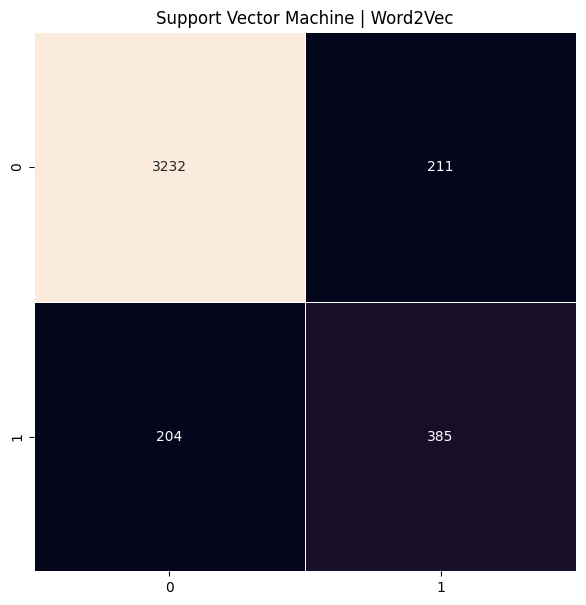

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, prediction_SVM_int)
plt.figure(figsize=(7,7))
plt.title("Support Vector Machine | Word2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### [**3. Decission tree**]($b2)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
tree_clf = DecisionTreeClassifier()
tree_clf.fit(xtrain_w2v, ytrain)
predictions_tree = tree_clf.predict(xvalid_w2v)
predictions_tree_int = [int(label) for label in predictions_tree]
yvalid_int = [int(label) for label in yvalid]
print("Decision Tree Accuracy Score -> ", accuracy_score(predictions_tree_int, yvalid_int) * 100)

Decision Tree Accuracy Score ->  85.76388888888889


In [ ]:
from sklearn.tree import DecisionTreeClassifier


In [ ]:
dt = DecisionTreeClassifier().fit(xtrain_w2v, ytrain)
yvalid_int = [int(label) for label in yvalid]
prediction_DT=  dt.predict(xvalid_w2v)
prediction_DT_int = [int(label) for label in prediction_DT]
f1_score(yvalid_int, prediction_DT_int)


0.538961038961039

In [ ]:
f1_score(yvalid_int, prediction_DT_int, average='macro')       # Sınıflar eşit ağırlıklı
#f1_score(yvalid_int, prediction_DT_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.7279114328294656

In [ ]:
f1_score(yvalid_int, prediction_DT_int, average='weighted')

0.8616575697591506

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_DT_int))

              precision    recall  f1-score   support

           0       0.92      0.91      0.92      3443
           1       0.52      0.56      0.54       589

    accuracy                           0.86      4032
   macro avg       0.72      0.74      0.73      4032
weighted avg       0.86      0.86      0.86      4032



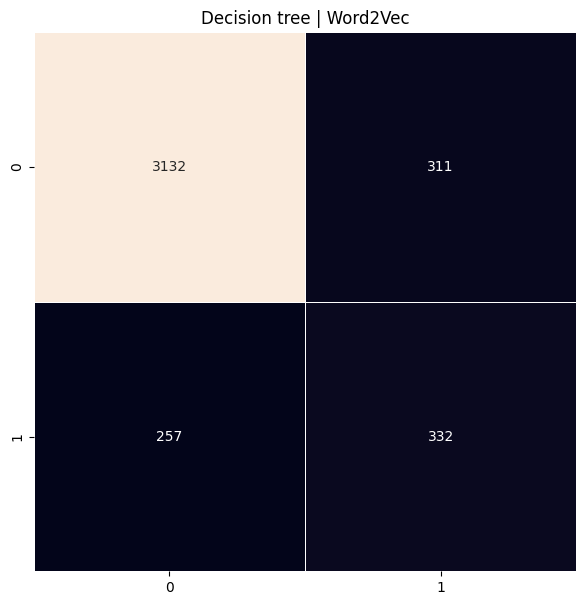

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, prediction_DT_int)
plt.figure(figsize=(7,7))
plt.title("Decision tree | Word2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### [NB](#b2)
Navie Bayes wordvec deki negatif değerlerden dolayı hata verdi

In [ ]:
#use ML algorithms classifier
#use a Naive Bayes Classifier and train the model on the training set.
"""from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(xtrain_w2v, ytrain)"""

'from sklearn.naive_bayes import MultinomialNB\nclf = MultinomialNB().fit(xtrain_w2v, ytrain)'

###### [Random Forest](#b2)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Random Forest sınıflandırıcısını tanımla
rf_clf = RandomForestClassifier()

# Modeli eğit
rf_clf.fit(xtrain_w2v, ytrain)

# Test verileri üzerinde tahmin yap
predictions_rf = rf_clf.predict(xvalid_w2v)
predictions_rf_int = [int(label) for label in predictions_rf]
yvalid_int = [int(label) for label in yvalid]
# Doğruluk skorunu hesapla ve yazdır
print("Random Forest Accuracy Score -> ", accuracy_score(predictions_rf_int, yvalid_int) * 100)


Random Forest Accuracy Score ->  90.52579365079364


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score

RF = RandomForestClassifier().fit(xtrain_w2v, ytrain)
yvalid_int = [int(label) for label in yvalid]
prediction_RF = RF.predict(xvalid_w2v)

# Bu satırda yanlışlık var — prediction_DT yanlış değişken
prediction_RF_int = [int(label) for label in prediction_RF]  # Doğrusu bu olmalı

f1_score(yvalid_int, prediction_RF_int)

0.6405228758169934

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_RF_int))

              precision    recall  f1-score   support

           0       0.93      0.96      0.94      3443
           1       0.71      0.58      0.64       589

    accuracy                           0.90      4032
   macro avg       0.82      0.77      0.79      4032
weighted avg       0.90      0.90      0.90      4032



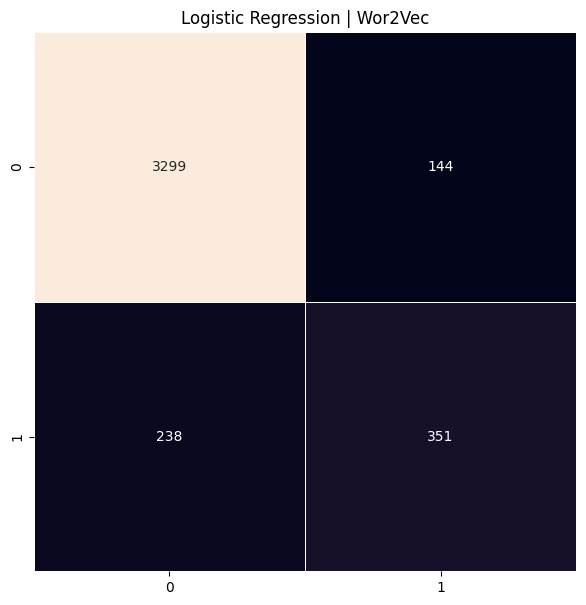

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, predictions_rf_int)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | Wor2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

In [ ]:
f1_score(yvalid_int, predictions_rf_int, average='macro')       # Sınıflar eşit ağırlıklı
  # Gerçek örnek sayısına göre ağırlıklı


0.7964368411592425

In [ ]:
f1_score(yvalid_int, predictions_rf_int, average='weighted')

0.9017880644038736

* ## [LSTM](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [LOGISTIC REG](#log)


#####[Dosya en başta yüklenmemişse](#b2)

###### [Kütüphanelerin yüklenmesi](#p2)

In [ ]:
# importing required libraries
import pandas as pd
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import string
import nltk
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

%matplotlib inline

###### [Dosyanın yüklenmesin](#p2)

In [ ]:
import numpy as np
import pandas as pd
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

/kaggle/input/amazon-product-reviews/amazon.csv

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/BİL482/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[Errno 2] No such file or directory: '/content/drive/My Drive/BİL482/'
/content/drive/My Drive/Bil482


In [ ]:
train_df = pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

###### [Veri Setinin incelenmesi](#p2)

In [ ]:
train_df=df

In [ ]:
train_df.isnull().values.any()

False

In [ ]:
train_df.head()

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2,Comment
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0,"At Wipro, growth remains a mirage"
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0,Why Chinese stocks leave US investors vulnerable
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0,US stocks finish mixed amid more tech selling
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0,Opec reduces estimate on oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0,Immediate support for rupee is placed at 55.10: Bonanza


In [ ]:
train_df

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2,Text_prepro
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1.0,0,0.0,"wipro , growth remain mirag"
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1.0,0,0.0,chines stock leav us investor vulner
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1.0,0,0.0,us stock finish mix amid tech sell
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1.0,0,0.0,opec reduc estim oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1.0,0,0.0,immedi support rupe place bonanza
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","[""['negotiation', 'carry', 'constructive', 'manner', '', 'patch', 'tire', 'fund', 'solution', 'situation', '']""]",121,negotiations carried constructive manner parties tried find solution situation,negoti carri construct manner parti tri find solut situat,negotiation carried constructive manner party tried find solution situation,The negotiations were carried out in constructive manner and all parties tried to find solution to the situation,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","negoti carri construct manner , parti tri find solut situat",1.0,2,1.0,"negoti carri construct manner , parti tri find solut situat"
9738,Wockhardt story is really intriguing: Deven Choksey,"[""['hardtack', 'story', 'really', 'intrigue', 'seven', 'choke']""]",51,wockhardt story really intriguing deven choksey,wockhardt stori realli intrigu deven choksey,wockhardt story really intriguing deven choksey,Wockhardt story is really intriguing Deven Choksey,Wockhardt story is really intriguing: Deven Choksey,wockhardt stori realli intrigu deven choksey,1.0,2,1.0,wockhardt stori realli intrigu deven choksey
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .,"[""['Finnish', 'robe', 'own', 'get', 'family', 'frown', 'recently', 'acquisition', 'small', 'shipping', 'company', '']""]",123,finnish bore owned rettig family grown recently acquisition smaller shipping companies,finnish bore own rettig famili grown recent acquisit smaller ship compani,finnish bore owned rettig family grown recently acquisition smaller shipping company,Finnish Bore that is o

In [ ]:
train_df

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2,Text_prepro
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0,"wipro , growth remain mirag"
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0,chines stock leav us investor vulner
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0,us stock finish mix amid tech sell
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0,opec reduc estim oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0,immedi support rupe place bonanza
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","[""['negotiation', 'carry', 'constructive', 'manner', '', 'patch', 'tire', 'fund', 'solution', 'situation', '']""]",121,negotiations carried constructive manner parties tried find solution situation,negoti carri construct manner parti tri find solut situat,negotiation carried constructive manner party tried find solution situation,The negotiations were carried out in constructive manner and all parties tried to find solution to the situation,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","negoti carri construct manner , parti tri find solut situat",1,2,1,"negoti carri construct manner , parti tri find solut situat"
9738,Wockhardt story is really intriguing: Deven Choksey,"[""['hardtack', 'story', 'really', 'intrigue', 'seven', 'choke']""]",51,wockhardt story really intriguing deven choksey,wockhardt stori realli intrigu deven choksey,wockhardt story really intriguing deven choksey,Wockhardt story is really intriguing Deven Choksey,Wockhardt story is really intriguing: Deven Choksey,wockhardt stori realli intrigu deven choksey,1,2,1,wockhardt stori realli intrigu deven choksey
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .,"[""['Finnish', 'robe', 'own', 'get', 'family', 'frown', 'recently', 'acquisition', 'small', 'shipping', 'company', '']""]",123,finnish bore owned rettig family grown recently acquisition smaller shipping companies,finnish bore own rettig famili grown recent acquisit smaller ship compani,finnish bore owned rettig family grown recently acquisition smaller shipping company,Finnish Bore that is owned by the Rettig family ha

#####[Dosya en başta yüklenmişse burdan başla](#b2)

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
#ecilen_kolon_adi="hibrit"
#secilen_sentiment_kolon_adi="score2"

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(9741, 1)

In [ ]:
print(len(df))

9741


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data

,USAirPrePro2,score2
1,wipro growth remains mirage,0
2,chinese stock leave u investor vulnerable,0
3,u stock finish mixed amid tech selling,0
4,opec reduces estimate oil demand growth,0
5,immediate support rupee placed bonanza,0
...,...,...
9737,negotiation carried constructive manner party tried find solution situation,1
9738,wockhardt story really intriguing deven choksey,1
9739,finnish bore owned rettig family grown recently acquisition smaller shipping company,1
9740,operating profit eur mn eur mn,1


###### [Tokanize işlemleri](#p2)

In [ ]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
nltk.download('stopwords')
nltk.download('punkt')
stemmer = PorterStemmer()
def preprocess_text(text):
    text = text.lower()
    text = re.sub(r'[^\x00-\x7F]+', ' ', text)
    text = re.sub(r'(.)\1{2,}', '', text)
    text = re.sub(r'\.{2,}', ' ', text)
    text = re.sub(r'\b(\w+)\s+(\1\s+){2,}', r'\1 ', text)
    text = re.sub(r'[^a-zA-Z\s,\']', '', text)
    tokens = word_tokenize(text)
    stopwords_set = set(stopwords.words('english'))
    tokens = [stemmer.stem(word) for word in tokens if word not in stopwords_set]
    preprocessed_text = ' '.join(tokens)
    return preprocessed_text

def preprocess_text2(text):
    text = text.lower()
    text = re.sub(r'[^\x00-\x7F]+', ' ', text)
    text = re.sub(r'\.{2,}', ' ', text)
    text = re.sub(r'[^a-zA-Z\s,\']', '', text)
    tokens = word_tokenize(text)
    stopwords_set = set(stopwords.words('english'))
    tokens = [stemmer.stem(word) for word in tokens if word not in stopwords_set]
    return tokens
def preprocess_text3(text):

    tokens = word_tokenize(text)

    return tokens

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
preprocess_data=lambda text:preprocess_text(text)
data["Text_prepro"]=data[secilen_kolon_adi].apply(preprocess_data)

In [ ]:
tokenized_documents=[preprocess_text2(doc) for doc in X_df[secilen_kolon_adi]]

In [ ]:
X_df

,USAirPrePro2
1,aalwuhaib muslim mob violence hindu bangladesh continues islam
3,jncatron israjourisra ampalestine islamophobia like idea naziphobia islam religion hate must outlawed
4,finally caught sudden death cook look like going intense mkr
5,carolinesinders herecomesfran hug
6,please please start using discernment blunted steroid mean drug dead
...,...
13467,mkr nooooo wanted kat andre lose
13468,rt mumtazceltik whitehouse vp kobane jesuischarlie turkish military say mit shipped weapon alqaeda fehimtastekinhttp
13469,glad proper competition starting even happier colin back mkr
13470,worry pete manu take time need fact feel free fuck right prefer colin mkr


In [ ]:
#Ön işleme yapmayacaksak
tokenized_documents=[preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]

In [ ]:
len(tokenized_documents)

13437

In [ ]:
tokenized_documents[0]

['aalwuhaib',
 'muslim',
 'mob',
 'violence',
 'hindu',
 'bangladesh',
 'continues',
 'islam']

In [ ]:
from gensim.models import Word2Vec
ukuran_vektor=100
word2vec_model = Word2Vec(sentences=tokenized_documents,
                          min_count=1, vector_size=ukuran_vektor,sg=1)

In [ ]:
print(word2vec_model)

Word2Vec<vocab=16940, vector_size=100, alpha=0.025>


In [ ]:
all_words =word2vec_model.wv.index_to_key
print("50 kata pertama dalam model Word2Vec:")
for index, word in enumerate(all_words):
    if index < 50:
        print(f"{word} : {index}")
    else:
        break

50 kata pertama dalam model Word2Vec:
mkr : 0
rt : 1
islam : 2
muslim : 3
like : 4
kat : 5
people : 6
would : 7
one : 8
get : 9
woman : 10
isi : 11
andre : 12
time : 13
think : 14
go : 15
know : 16
want : 17
going : 18
make : 19
good : 20
thing : 21
say : 22
really : 23
see : 24
look : 25
u : 26
maxblumenthal : 27
need : 28
oh : 29
mohammed : 30
way : 31
even : 32
year : 33
right : 34
girl : 35
still : 36
mykitchenrules : 37
never : 38
well : 39
daesh : 40
quran : 41
show : 42
got : 43
love : 44
back : 45
religion : 46
freebsdgirl : 47
much : 48
twitter : 49


In [ ]:
max_length = X_df[secilen_kolon_adi].apply(lambda x: len(x.split())).max()

In [ ]:
max_length

19

In [ ]:
max_length_index = X_df[secilen_kolon_adi].apply(len).idxmax()
print("Index baris dengan max_length adalah :", max_length_index)

Index baris dengan max_length adalah : 6848


In [ ]:
X_df.at[max_length_index, secilen_kolon_adi]

'getting puppy today getting puppy today getting puppy today getting puppy today getting puppy today getting puppy today getting'

In [ ]:
X_df.at[max_length_index, secilen_kolon_adi]

'getting puppy today getting puppy today getting puppy today getting puppy today getting puppy today getting puppy today getting'

In [ ]:
sequences = [[word2vec_model.wv.key_to_index[word] for word in text]
             for text in [preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]]

In [ ]:
sequences = [
    [word2vec_model.wv.key_to_index[word] if word in word2vec_model.wv.key_to_index else None for word in text]
    for text in [preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]
]


In [ ]:
sequences = [
    [word2vec_model.wv.key_to_index[word] for word in text if word in word2vec_model.wv.key_to_index]
    for text in [preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]
]

# Pad sequences after removing None values
padded_sequences = pad_sequences(sequences, maxlen=max_length, padding='post')


In [ ]:
len(sequences)

13437

In [ ]:
sequences[0]

[642, 3, 822, 406, 476, 3436, 1715, 2]

In [ ]:
from keras.preprocessing.sequence import pad_sequences
padded_sequences = pad_sequences(sequences, maxlen=max_length, padding='post')

In [ ]:
padded_sequences.shape

(13437, 19)

In [ ]:
y = np.asarray(df[secilen_sentiment_kolon_adi])

In [ ]:
jumlah_kelas=len(df[secilen_sentiment_kolon_adi].unique())

In [ ]:
jumlah_kelas

2

In [ ]:
y

array([1., 1., 0., ..., 0., 0., 0.])

In [ ]:
padded_sequences

array([[  642,     3,   822, ...,     0,     0,     0],
       [ 1061,  1001, 10728, ...,     0,     0,     0],
       [  537,  2034,   295, ...,     0,     0,     0],
       ...,
       [  527,  3613,   225, ...,     0,     0,     0],
       [ 1097,   208,   298, ...,     0,     0,     0],
       [   37,     0,   140, ...,     0,     0,     0]], dtype=int32)

###### [Test_train ayrımı ve embeding yapma](#p2)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(padded_sequences, y,
                                            test_size=0.3,
                                            random_state=42, stratify=y)

In [ ]:
embedding_matrix = np.zeros((len(word2vec_model.wv.key_to_index) + 1, word2vec_model.vector_size))
for word, i in word2vec_model.wv.key_to_index.items():
    embedding_vector = word2vec_model.wv[word]
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

###### [Model Oluşturma ve çalıştırma](#p2)

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input,Embedding,GlobalMaxPooling1D
model = Sequential()
model.add(Input(shape=(max_length,)))
model.add(Embedding(input_dim=embedding_matrix.shape[0], output_dim=embedding_matrix.shape[1],
                  trainable=False))
model.add(LSTM(ukuran_vektor, return_sequences=True))
model.add(GlobalMaxPooling1D())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(jumlah_kelas, activation='softmax'))

In [ ]:
# 0 ve 1 output varsa
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input, Embedding, GlobalMaxPooling1D

model = Sequential()
model.add(Input(shape=(max_length,)))  # Giriş katmanı
model.add(Embedding(input_dim=embedding_matrix.shape[0], output_dim=embedding_matrix.shape[1], trainable=False))  # Embedding katmanı
model.add(LSTM(ukuran_vektor, return_sequences=True))  # LSTM katmanı
model.add(GlobalMaxPooling1D())  # GlobalMaxPooling1D katmanı
model.add(Dense(128, activation='relu'))  # Dense katmanı
model.add(Dropout(0.2))  # Dropout katmanı
model.add(Dense(1, activation='sigmoid'))  # Çıkış katmanı: 1 nöron, sigmoid aktivasyon

# Modelin derlenmesi
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
y_train_int=[int(label) for label in y_train]
y_val_int=[int(label) for label in y_val]

In [ ]:
from keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0001)
model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
from keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

In [ ]:
history = model.fit(X_train, y_train, epochs=500, batch_size=256,
                    validation_data=(X_val, y_val), callbacks=[early_stopping])

Epoch 1/500


InvalidArgumentError: Graph execution error:

Detected at node compile_loss/sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/SparseSoftmaxCrossEntropyWithLogits defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "/usr/local/lib/python3.11/dist-packages/colab_kernel_launcher.py", line 37, in <module>

  File "/usr/local/lib/python3.11/dist-packages/traitlets/config/application.py", line 992, in launch_instance

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelapp.py", line 712, in start

  File "/usr/local/lib/python3.11/dist-packages/tornado/platform/asyncio.py", line 205, in start

  File "/usr/lib/python3.11/asyncio/base_events.py", line 608, in run_forever

  File "/usr/lib/python3.11/asyncio/base_events.py", line 1936, in _run_once

  File "/usr/lib/python3.11/asyncio/events.py", line 84, in _run

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 510, in dispatch_queue

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 499, in process_one

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 406, in dispatch_shell

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 730, in execute_request

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py", line 383, in do_execute

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/zmqshell.py", line 528, in run_cell

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 2975, in run_cell

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3030, in _run_cell

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/async_helpers.py", line 78, in _pseudo_sync_runner

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3257, in run_cell_async

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3473, in run_ast_nodes

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code

  File "<ipython-input-402-5073228405bd>", line 1, in <cell line: 0>

  File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 371, in fit

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 219, in function

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 132, in multi_step_on_iterator

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 113, in one_step_on_data

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 60, in train_step

  File "/usr/local/lib/python3.11/dist-packages/keras/src/trainers/trainer.py", line 383, in _compute_loss

  File "/usr/local/lib/python3.11/dist-packages/keras/src/trainers/trainer.py", line 351, in compute_loss

  File "/usr/local/lib/python3.11/dist-packages/keras/src/trainers/compile_utils.py", line 691, in __call__

  File "/usr/local/lib/python3.11/dist-packages/keras/src/trainers/compile_utils.py", line 700, in call

  File "/usr/local/lib/python3.11/dist-packages/keras/src/losses/loss.py", line 67, in __call__

  File "/usr/local/lib/python3.11/dist-packages/keras/src/losses/losses.py", line 33, in call

  File "/usr/local/lib/python3.11/dist-packages/keras/src/losses/losses.py", line 2246, in sparse_categorical_crossentropy

  File "/usr/local/lib/python3.11/dist-packages/keras/src/ops/nn.py", line 1963, in sparse_categorical_crossentropy

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/nn.py", line 744, in sparse_categorical_crossentropy

Received a label value of 1 which is outside the valid range of [0, 1).  Label values: 0 0 0 0 0 1 1 0 0 1 0 0 0 1 1 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 1 1 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0
	 [[{{node compile_loss/sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/SparseSoftmaxCrossEntropyWithLogits}}]] [Op:__inference_multi_step_on_iterator_47551]

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input, Embedding, GlobalMaxPooling1D

model = Sequential()
model.add(Input(shape=(max_length,)))  # Giriş katmanı
model.add(Embedding(input_dim=embedding_matrix.shape[0], output_dim=embedding_matrix.shape[1], trainable=False))  # Embedding katmanı
model.add(LSTM(ukuran_vektor, return_sequences=True))  # LSTM katmanı
model.add(GlobalMaxPooling1D())  # GlobalMaxPooling1D katmanı
model.add(Dense(128, activation='relu'))  # Dense katmanı
model.add(Dropout(0.2))  # Dropout katmanı
model.add(Dense(1, activation='sigmoid'))  # Çıkış katmanı: 1 nöron, sigmoid aktivasyon

# Modelin derlenmesi
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

# Etiketlerinizi sayısal değerlere dönüştürün
y_train = label_encoder.fit_transform(y_train)
y_val = label_encoder.transform(y_val)


In [ ]:
y_val.shape

(4032,)

In [ ]:
y_train.shape

(9405,)

In [ ]:
history = model.fit(X_train, y_train, epochs=100, batch_size=256,
                    validation_data=(X_val, y_val), callbacks=[early_stopping])


Epoch 1/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 8s 121ms/step - accuracy: 0.8353 - loss: 0.5501 - val_accuracy: 0.8534 - val_loss: 0.3889
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - accuracy: 0.8557 - loss: 0.3788 - val_accuracy: 0.8534 - val_loss: 0.3348
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.8621 - loss: 0.3107 - val_accuracy: 0.8795 - val_loss: 0.2985
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 5s 148ms/step - accuracy: 0.8780 - loss: 0.2994 - val_accuracy: 0.8824 - val_loss: 0.3055
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step - accuracy: 0.8854 - loss: 0.2894 - val_accuracy: 0.8767 - val_loss: 0.3037
Epoch 6/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - accuracy: 0.8797 - loss: 0.2888 - val_accuracy: 0.8847 - val_loss: 0.2866
Epoch 7/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - accuracy: 0.8782 - loss: 0.2923 - val_accuracy: 0.8894 - val_loss: 0.2857
Epoch 8/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - accuracy: 0.8830 - loss: 0.2854 - val_accuracy

In [ ]:
loss, accuracy = model.evaluate(X_val, y_val, verbose=0)
print(f'Test Accuracy: {accuracy*100:.2f}%')

Test Accuracy: 91.87%


In [ ]:
from sklearn.metrics import classification_report
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
report = classification_report(y_val, y_pred_classes)
print("Classification Report:")
print(report)

126/126 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.85      1.00      0.92      3441
           1       0.00      0.00      0.00       591

    accuracy                           0.85      4032
   macro avg       0.43      0.50      0.46      4032
weighted avg       0.73      0.85      0.79      4032



In [ ]:
print("Konfigurasi Lapisan Embedding:")
print(model.layers[0].get_config())

Konfigurasi Lapisan Embedding:
{'name': 'embedding_5', 'trainable': False, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None}, 'input_dim': 16941, 'output_dim': 100, 'embeddings_initializer': {'module': 'keras.initializers', 'class_name': 'RandomUniform', 'config': {'seed': None, 'minval': -0.05, 'maxval': 0.05}, 'registered_name': None}, 'embeddings_regularizer': None, 'activity_regularizer': None, 'embeddings_constraint': None, 'mask_zero': False}


In [ ]:
print("Bobot Lapisan Embedding:")
print(model.layers[0].get_weights()[0])

Bobot Lapisan Embedding:
[[-0.01040156 -0.04769677 -0.04061379 ... -0.03624126  0.04445609
  -0.04679516]
 [ 0.04253523  0.03150847  0.01943674 ...  0.04478024 -0.01426091
  -0.0116258 ]
 [ 0.01640664 -0.03426895 -0.02987617 ... -0.00048025  0.03486153
   0.0368078 ]
 ...
 [ 0.04863114  0.04078159  0.03984227 ... -0.04365298 -0.00409855
   0.00513166]
 [ 0.04306641 -0.04086542  0.01292026 ...  0.04352231 -0.00108362
   0.03059968]
 [ 0.04783097 -0.01810805 -0.00164809 ... -0.01785213 -0.02406689
   0.03813476]]


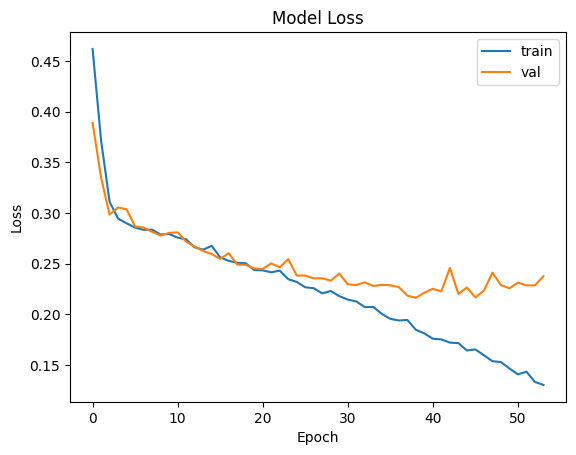

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

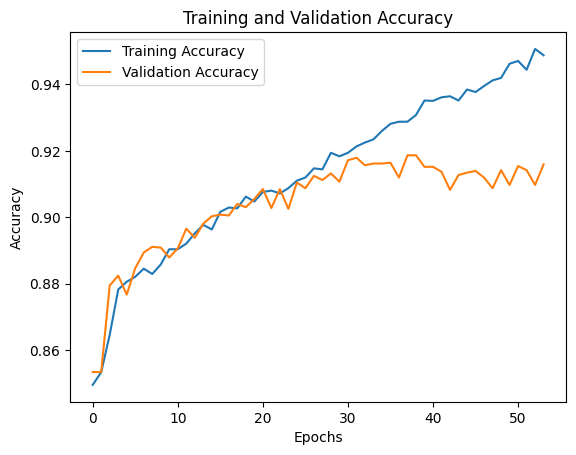

In [ ]:
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
plt.plot(accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_5 (Embedding)         │ (None, 19, 100)        │     1,694,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_5 (LSTM)                   │ (None, 19, 100)        │        80,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling1d_5          │ (None, 100)            │             0 │
│ (GlobalMaxPooling1D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 128)            │        12,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,974,473 (7.53 MB)

 Trainable params: 93,457 (365.07 KB)

 Non-trainable params: 1,694,100 (6.46 MB)

 Optimizer params: 186,916 (730.14 KB)

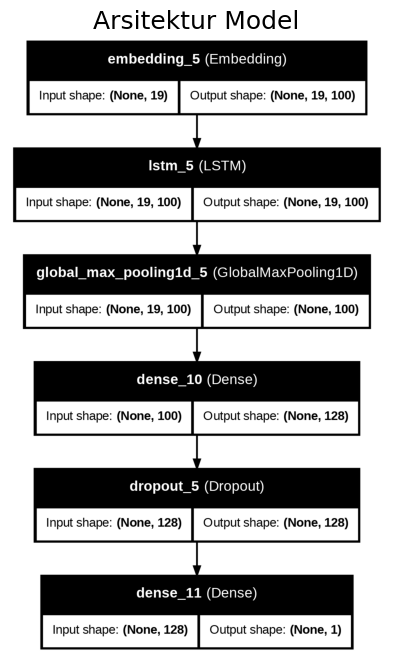

In [ ]:
from keras.utils import plot_model
file_name = 'arsitektur_model.png'
plot_model(model, to_file=file_name, show_shapes=True, show_layer_names=True)
plt.figure(figsize=(8,8))
img = plt.imread(file_name)
plt.imshow(img)
plt.title('Arsitektur Model', fontsize=18)
plt.axis('off')
plt.savefig(file_name)
plt.show()

In [ ]:
from sklearn.metrics import classification_report
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
report = classification_report(y_val, y_pred_classes)
print("Classification Report:")
print(report)

126/126 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.85      1.00      0.92      3441
           1       0.00      0.00      0.00       591

    accuracy                           0.85      4032
   macro avg       0.43      0.50      0.46      4032
weighted avg       0.73      0.85      0.79      4032



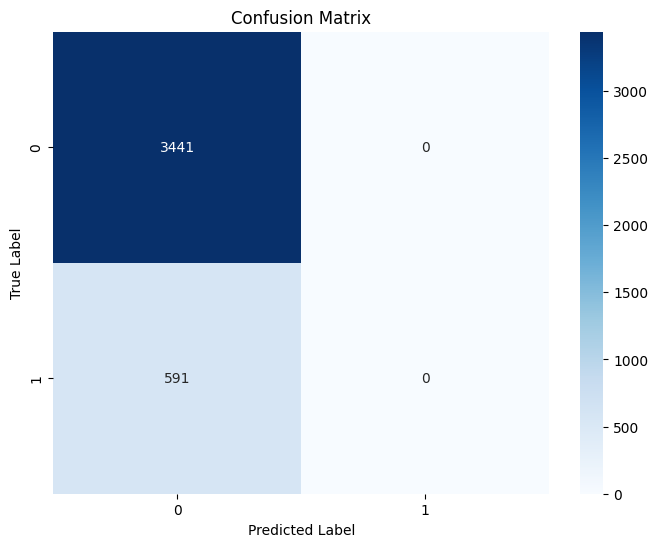

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
cm = confusion_matrix(y_val, y_pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
model.save("model_Amazon_Product_Reviews.h5")
word2vec_model.save("word2vec_model.model")
train_df.to_csv("train_data.csv", index=False)

NameError: name 'train_df' is not defined

###### [Denemeler 0 ın öğrenmesi o geldiği için yapıldı](#b2)

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weights_dict = {i : class_weights[i] for i in range(len(class_weights))}

model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=50, class_weight=class_weights_dict)


Epoch 1/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - accuracy: 0.8543 - loss: 0.3336 - val_accuracy: 0.7756 - val_loss: 0.4651
Epoch 2/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - accuracy: 0.8863 - loss: 0.2743 - val_accuracy: 0.7680 - val_loss: 0.5310
Epoch 3/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step - accuracy: 0.9294 - loss: 0.2049 - val_accuracy: 0.7889 - val_loss: 0.4667
Epoch 4/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step - accuracy: 0.9353 - loss: 0.1925 - val_accuracy: 0.7886 - val_loss: 0.5145
Epoch 5/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step - accuracy: 0.9554 - loss: 0.1389 - val_accuracy: 0.7927 - val_loss: 0.5285
Epoch 6/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step - accuracy: 0.9706 - loss: 0.1073 - val_accuracy: 0.8050 - val_loss: 0.5483
Epoch 7/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9819 - loss: 0.0785 - val_accuracy: 0.7978 - val_loss: 0.5897
Epoch 8/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step - accuracy: 0.9856 - loss: 0.0622 - 

In [ ]:
loss, accuracy = model.evaluate(X_val, y_val, verbose=0)
print(f'Test Accuracy: {accuracy*100:.2f}%')


Test Accuracy: 80.19%


In [ ]:
from sklearn.metrics import classification_report
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
report = classification_report(y_val, y_pred_classes)
print("Classification Report:")
print(report)

92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.49      1.00      0.65      1423
           1       0.00      0.00      0.00      1500

    accuracy                           0.49      2923
   macro avg       0.24      0.50      0.33      2923
weighted avg       0.24      0.49      0.32      2923



In [ ]:
import numpy as np

y_pred_probs = model.predict(X_val)
print("Tahmin ortalaması:", np.mean(y_pred_probs))
print("0.5'ten büyük kaç tane tahmin var:", np.sum(y_pred_probs > 0.5))


92/92 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step
Tahmin ortalaması: 0.5227914
0.5'ten büyük kaç tane tahmin var: 1535


In [ ]:
print(np.unique(y_train))  # [0 1] olmalı
print(y_train[:10])        # Sayılar olmalı, liste değil


[0 1]
[0 1 0 1 1 1 1 1 1 0]


In [ ]:
print(embedding_matrix.shape)
# input_dim=embedding_matrix.shape[0] ile tokenizer.num_words eşleşiyor mu?


(10791, 100)


In [ ]:
print(X_train.shape, y_train.shape)


(6818, 53) (6818,)


In [ ]:
print("Etiket tipi:", y_train.dtype)
print("Eşsiz etiketler:", np.unique(y_train))


Etiket tipi: int64
Eşsiz etiketler: [0 1]


In [ ]:
y_pred_probs = model.predict(X_val)
print("Tahmin ortalaması:", np.mean(y_pred_probs))
print("0.5 üstü kaç tane:", np.sum(y_pred_probs > 0.5))


92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step
Tahmin ortalaması: 0.5227914
0.5 üstü kaç tane: 1535
